# Experiments with Variational AutoEncoder

## Setup

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

import pandas as pd
from IPython.display import display

import numpy as np
import copy
import sys
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.optim as optim

from torch.utils.data import DataLoader, random_split, ConcatDataset, SubsetRandomSampler
from sklearn.model_selection import KFold
from scipy.stats import norm
from torch.autograd import Variable
from torch.utils.data.dataloader import DataLoader
from torchvision.datasets import MNIST
from torchvision.utils import make_grid as make_image_grid
from matplotlib.backends.backend_pdf import PdfPages
from tqdm import tnrange

 ## Training and evaluation functions VAE

In [ ]:
def train_VAE_model(model, train_loader,val_loader, test_loader, VAE_criterion,eval_criterions, optimizer, device, epochs, VAE_likelihood, beta, L, fold):
    outputs = []

    average_recons_losses = []  # List to store average reconstruction losses
    average_kld_losses = []     # List to store average KLD losses
    average_vae_losses = []         # List to store average total losses
    average_vae_val_losses = []
    average_recons_val_losses = []
    average_kld_val_losses = []
    average_val_losses = []

    for epoch in range(epochs):
        model.train()
        total_vae_loss = 0.0
        total_recons_loss = 0.0
        total_kld_loss = 0.0
        for images, _ in train_loader:
            x_in = images.view(images.size(0), -1).to(device)
            z_mu, z_logvar, z_samples, x_out  = model(x_in, L)
            recons_loss, kld_loss, vae_loss = VAE_criterion(x_out, x_in, z_mu, z_logvar, L, VAE_likelihood, beta)
            optimizer.zero_grad()
            vae_loss.backward()
            optimizer.step()
            total_recons_loss += recons_loss.item()
            total_kld_loss += kld_loss.item()
            total_vae_loss += vae_loss.item()

        average_recons_loss = total_recons_loss / len(train_loader)
        average_kld_loss = total_kld_loss / len(train_loader)
        average_vae_loss = total_vae_loss / len(train_loader)

        average_recons_losses.append(average_recons_loss)
        average_kld_losses.append(average_kld_loss)
        average_vae_losses.append(average_vae_loss)


        print(f'Train Fold/Epoch: {fold + 1}/{epoch + 1}, Training Loss:{average_vae_loss:.6f}, Training Recons Loss: {average_recons_loss:.6f}, Training KLD Loss: {average_kld_loss:.6f}')


        # Validation phase

        average_loss, average_vae_val_loss, average_recons_val_loss, average_kld_val_loss = eval_VAE_model(fold, model, val_loader, eval_criterions, VAE_likelihood, beta, L, device)
        average_loss_0 = {criterion_name_0: loss_value_0 for criterion_name_0, loss_value_0 in average_loss.items()}
        average_vae_val_losses_1 = {criterion_name_1: loss_value_1 for criterion_name_1, loss_value_1 in average_vae_val_loss.items()}
        average_recons_val_losses_2 = {criterion_name_2: loss_value_2 for criterion_name_2, loss_value_2 in average_recons_val_loss.items()}
        average_kld_val_losses_3 = {criterion_name_3: loss_value_3 for criterion_name_3, loss_value_3 in average_kld_val_loss.items()}


        average_val_losses.append(average_loss_0)
        average_vae_val_losses.append(average_vae_val_losses_1)
        average_recons_val_losses.append(average_recons_val_losses_2)
        average_kld_val_losses.append(average_kld_val_losses_3)

        print(f'Validation Fold/Epoch: {fold + 1}/{epoch + 1},  Validation Loss: {average_loss_0}, Validation VAE Loss: {average_vae_val_losses_1}, Validation Recons Loss: {average_recons_val_losses_2}, Validation KLD Loss: {average_kld_val_losses_3}')



        outputs.append((epoch, x_in, x_out))


    return outputs, average_vae_losses, average_recons_losses, average_kld_losses, average_val_losses, average_vae_val_losses, average_recons_val_losses, average_kld_val_losses

### Visualize reconstructions function VAE

In [ ]:
def VAE_visualize_original_images(test_loader, img_shape, num_samples=10, figure_size=(8, 2)):
    with torch.no_grad():
        for batch_features, _ in test_loader:
            batch_features = batch_features.view(-1, img_shape[0] * img_shape[1])
            break

    plt.figure(figsize=figure_size)
    plt.gray()

    plt.suptitle('Visualizing Original Images', fontsize=12)

    for i in range(num_samples):
        ax = plt.subplot(2, num_samples, i + 1)
        # Check if there is only one image in the batch
        if len(batch_features) == 1:
            plt.imshow(batch_features[0].numpy().reshape(img_shape))
        else:
            plt.imshow(batch_features[i].numpy().reshape(img_shape))
        plt.axis('off')

    plt.show()
def VAE_visualize_reconstructions(model, test_loader, img_shape, L, device, num_samples=10, fold_index=None, figure_size=(8, 2)):
    with torch.no_grad():
        for batch_features, _ in test_loader:
            batch_features = batch_features.to(device)
            x_in = batch_features.view(batch_features.size(0), -1)
            z_mu, z_logvar, z_samples, x_out = model(x_in, L)
            break

    plt.figure(figsize=figure_size)
    plt.gray()

    for i, (item_in, item_out) in enumerate(zip(x_in.cpu().numpy(), x_out.cpu().numpy())):
        if i >= num_samples:
            break
        # Plot original image
        if fold_index == 0:
          plt.subplot(2, num_samples, i + 1)
          item_in = item_in.reshape(img_shape)
          plt.imshow(item_in)
          plt.axis('off')

        # Plot reconstructed image for all folds
        plt.subplot(2, num_samples, num_samples + i + 1)
        item_out = item_out.reshape(img_shape)
        plt.imshow(item_out)
        plt.axis('off')

    plt.show()
img_shape = (28, 28)

### Evaluation functions VAE

In [ ]:
def eval_VAE_model(fold, model, test_loader, criterions, VAE_likelihood, beta, L, device):
    model.eval()
    criterion_names = list(criterions.keys())

    average_vae_val_loss = {criterion_name: 0.0 for criterion_name in criterion_names}
    average_recons_val_loss = {criterion_name: 0.0 for criterion_name in criterion_names}
    average_kld_val_loss = {criterion_name: 0.0 for criterion_name in criterion_names}

    average_total_loss = {criterion_name: 0.0 for criterion_name in criterion_names}


    for name, criterion in criterions.items():
        total_recons_loss = 0.0
        total_kld_loss = 0.0
        total_vae_loss = 0.0

        total_loss = 0.0

        for (images, _) in test_loader:
            #x_in = Variable(images.view(images.size(0), -1))
            x_in = images.view(images.size(0), -1).to(device)
            z_mu, z_logvar, z_samples, x_out = model(x_in, L)
            x_out_flat = x_out.view(x_in.size()).to(device)

            loss = criterion(x_out_flat , x_in)

            recons_loss, kld_loss, vae_loss = VAE_criterion(x_out, x_in, z_mu, z_logvar, L, VAE_likelihood, beta)

            total_recons_loss += recons_loss.item()
            total_kld_loss += kld_loss.item()
            total_vae_loss += vae_loss.item()

            total_loss += loss.item()

        # Calculate the average loss for this criterion
        average_recons_loss = total_recons_loss / len(test_loader)
        average_kld_loss = total_kld_loss / len(test_loader)
        average_vae_loss = total_vae_loss / len(test_loader)

        average_loss = total_loss / len(test_loader)

        # Update the dictionaries with the average values
        average_vae_val_loss[name] = average_vae_loss
        average_recons_val_loss[name] = average_recons_loss
        average_kld_val_loss[name] = average_kld_loss

        average_total_loss[name] = average_loss

    return average_total_loss, average_vae_val_loss, average_recons_val_loss, average_kld_val_loss


## Model definitions: Pytorch Classes

## Variational Autoencoder

Code Regis Djaha

In [ ]:
# Encoder class used in VAE below
# Note the forward pass, where we compute the mean and logvariance of the latent variable
class Encoder(nn.Module):
    def __init__(self, D_x, D_z, n_layers, activation):
        super(Encoder, self).__init__()
        self.D_x = D_x
        self.D_z = D_z
        self.n_layers=n_layers

        hidden_sizes = [D_x - (D_x - D_z) * i // n_layers for i in range(n_layers)] + [D_z]
        encoder_hidden_sizes = [D_x] + hidden_sizes

        encoder_layers = []
        for i in range(1, len(encoder_hidden_sizes) - 1):
            # Remove activation at the last layer of the encoder
            if i == len(encoder_hidden_sizes) - 2:
                self.fc_mean = nn.Linear(encoder_hidden_sizes[i], D_z)
                self.fc_logvar = nn.Linear(encoder_hidden_sizes[i], D_z)
            else:
                encoder_layers.extend([nn.Linear(encoder_hidden_sizes[i], encoder_hidden_sizes[i + 1]), activation()])
        #encoder_layers.pop()
        self.encoder = nn.Sequential(*encoder_layers)

    def forward(self, x_in):
        encoded = self.encoder(x_in)
        z_mean = self.fc_mean(encoded)
        z_logvar = self.fc_logvar(encoded)

        return z_mean,z_logvar


In [ ]:
# Decoder of the VAE below
# Note the forward pass, where we compute the mean and logvariance of the latent variable
class Decoder(nn.Module):
    def __init__(self, D_x, D_z, n_layers, activation):
        super(Decoder, self).__init__()
        self.D_x = D_x
        self.D_z = D_z
        self.n_layers=n_layers

        hidden_sizes = [D_x - (D_x - D_z) * i // n_layers for i in range(n_layers)] + [D_z]
        encoder_hidden_sizes = [D_x] + hidden_sizes
        decoder_hidden_sizes = encoder_hidden_sizes[::-1]

        decoder_layers = []
        for i in range(0, len(decoder_hidden_sizes) - 2):
            if i == len(decoder_hidden_sizes) - 3:
                decoder_layers.extend([nn.Linear(decoder_hidden_sizes[i], decoder_hidden_sizes[i + 1]), nn.Sigmoid()])
            else:
                decoder_layers.extend([nn.Linear(decoder_hidden_sizes[i], decoder_hidden_sizes[i + 1]), activation()])

        self.decoder = nn.Sequential(*decoder_layers)

    def forward(self, z):
      x_out = self.decoder(z)
      return x_out.view(-1, 1, int(self.D_x**0.5), int(self.D_x**0.5))


In [ ]:
# Full VAE model, based on encoder/decoder above
class VAE(nn.Module):
    def __init__(self, D_x=784, n_layers=1, D_z=2, activation=nn.ReLU):
        super(VAE, self).__init__()
        self.D_x = D_x
        self.D_z = D_z
        self.n_layers=n_layers

        encoder = Encoder(D_x, D_z, n_layers, activation)
        decoder = Decoder(D_x, D_z, n_layers, activation)

        self.encoder = encoder
        self.decoder = decoder

    def encode(self, x_in):
        return self.encoder(x_in)

    def decode(self, z):
        return self.decoder(z)

    def reparameterization(self, mean, logvar):
        sd = torch.exp(logvar * 0.5)
        epsilon = torch.randn_like(sd)
        z = epsilon.mul(sd).add_(mean)
        return z

    def forward(self, x_in, L=1):
        z_mean, z_logvar = self.encode(x_in)
        z_samples = []
        for _ in range(L):
            z = self.reparameterization(z_mean, z_logvar)
            z_samples.append(z)
        z_samples = torch.cat(z_samples, dim=0)
        x_out = self.decode(z_samples)
        x_out = x_out.view(-1, 1, int(self.D_x**0.5), int(self.D_x**0.5))
        return z_mean, z_logvar, z_samples, x_out

### VAE_criterion

In [ ]:
# VAE Criterion, as combination of reconstruction loss and KL divergence
# Note that the reconstruction loss can be based on the Gaussian or Bernoulli likelihood
# Note that the KL divergence term can be weighted by the input $\beta$ parameter
def VAE_criterion(x_out, x_in, z_mu, z_logvar, L, VAE_likelihood, beta=1.0):
    recons_losses = []  # Store individual reconstruction losses

    if VAE_likelihood == "gaussian":
        for i in range(L):
            # Flatten x_in to match the shape of x_out
            x_in_flat = x_in.view(x_out[i::L].shape)
            # Calculate the mean squared error (MSE) loss for each sample
            recons_loss = F.mse_loss(x_out[i::L], x_in_flat, reduction='sum')
            recons_losses.append(recons_loss)
    elif VAE_likelihood == "bernoulli":
        for i in range(L):
            # Flatten x_in to match the shape of x_out
            x_in_flat = x_in.view(x_out[i::L].shape)
            # Calculate the binary cross-entropy loss for each sample
            recons_loss = F.binary_cross_entropy(x_out[i::L], x_in_flat, reduction='sum')
            recons_losses.append(recons_loss)

    # Calculate the mean loss over the L samples
    recons_loss = (1 / L) * sum(recons_losses)/ x_out.size(0)

    kld_loss = -0.5 * torch.sum(1 + z_logvar - z_mu.pow(2) - z_logvar.exp())/ x_out.size(0)

    loss = (recons_loss + beta * kld_loss)

    return recons_loss, kld_loss, loss


### latent space VAE model

In [ ]:
def latent_space_VAE_model(model, test_loader, device, number_fold):
    model.eval()
    latent_variables = []
    labels = []

    for images, _ in test_loader:
        x_in = images.view(images.size(0), -1).to(device)
        with torch.no_grad():
            z_mean, z_logvar = model.encode(x_in)
            z = model.reparameterization(z_mean, z_logvar)
        latent_variables.append(z.cpu().numpy())
        labels.append(_.numpy())

    latent_variables = np.concatenate(latent_variables)
    labels = np.concatenate(labels)

    colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))
    colors = colormap(labels)

    # Scatter plot for latente space on the left
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

    scatter_latent_variables = ax1.scatter(latent_variables[:, 0], latent_variables[:, 1], c=labels, cmap=colormap)
    ax1.set_xlabel("Latent Space 1")
    ax1.set_ylabel("Latent Space 2")
    ax1.set_title(f'Latent Space (z_size = {model.D_z}) for fold {number_fold}')
    cbar_mean = plt.colorbar(scatter_latent_variables)

    # Plot the distribution of the first latent variable (z[0]) on the right
    ax2.hist(latent_variables[:, 0], bins=50, density=True, alpha=0.5, color='blue', label='Latent Space 1')
    ax3.hist(latent_variables[:, 1], bins=50, density=True, alpha=0.5, color='blue', label='Latent Space 2')

    # Overlay the standard normal distribution (mean=0, std=1) using an orange line
    x = np.linspace(-5, 5, 1000)
    y = (1 / np.sqrt(2 * np.pi)) * np.exp(-0.5 * x**2)
    ax2.plot(x, y, color='orange', label='Standard Normal Distribution')

    ax2.set_xlabel("Latent Space")
    ax2.set_ylabel("Density")
    ax2.set_title(f'Distribution of Latent Space 1 (z_size = {model.D_z}) for fold {number_fold}')
    ax2.legend()

    # Overlay the standard normal distribution (mean=0, std=1) using an orange line
    ax3.plot(x, y, color='orange', label='Standard Normal Distribution')

    ax3.set_xlabel("Latent Space")
    ax3.set_ylabel("Density")
    ax3.set_title(f'Distribution of Latent Space 2 (z_size = {model.D_z}) for fold {number_fold}')
    ax3.legend()


    plt.tight_layout()
    plt.show()




### VAE k_fold_cross_validation

In [ ]:
def VAE_k_fold_cross_validation(model_class, model_config, train_dataset, test_dataset, VAE_criterion, learning_rate, training_setup, beta,  L, k_folds, batch_size,
                            eval_criterions={
        'MSE': torch.nn.MSELoss(),
        'L1 Loss': torch.nn.L1Loss(),
        'BCE': torch.nn.BCELoss()
    }):
    # Set up k-fold cross-validation
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

    # Initialize a list to store models and losses
    models = []
    fold_results = []

    # Perform k-fold cross-validation
    for fold, (train_indices, val_indices) in enumerate(kf.split(train_dataset)):
        print(f"Fold {fold + 1}/{k_folds}")

        # Split dataset into training and validation sets
        train_subset = torch.utils.data.Subset(train_dataset, train_indices)
        val_subset = torch.utils.data.Subset(train_dataset, val_indices)

        # Create data loaders
        train_loader_fold = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
        print(len(train_loader_fold.dataset))
        val_loader_fold = DataLoader(val_subset, batch_size=batch_size, shuffle=False)
        print(len(val_loader_fold.dataset))
        test_loader_fold = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
        print(test_loader_fold.dataset)

        # Initialize autoencoder model

        model = model_class(**model_config).to(training_setup['device'])

        # Define loss function and optimizer after initializing the model
        criterion = VAE_criterion
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)

        # Initialize test_losses_fold
        test_losses_fold_1 = []
        test_vae_losses_fold_1 = []
        test_recons_losses_fold_1 = []
        test_kld_losses_fold_1 = []
        val_losses_fold_1 = []
        val_vae_losses_fold_1 = []
        val_recons_losses_fold_1 = []
        val_kld_losses_fold_1 = []

        # Train the model for k-fold cross-validation
        train_outputs_fold, train_vae_losses_fold, train_recons_losses_fold, train_kld_losses_fold, val_losses_fold, val_vae_losses_fold, val_recons_losses_fold, val_kld_losses_fold = train_VAE_model(
            model,
            train_loader_fold,
            val_loader_fold,
            test_loader_fold,
            criterion,
            eval_criterions,
            optimizer,
            training_setup['device'],
            training_setup['epochs'],
            training_setup['VAE_likelihood'],
            beta,
            L,
            fold
        )
        # Test and validate the model for k-fold cross-validation
        val_losses_fold_1, val_vae_losses_fold_1, val_recons_losses_fold_1, val_kld_losses_fold_1 = eval_VAE_model(fold,
                                           model,
                                           val_loader_fold,
                                           eval_criterions,
                                           training_setup['VAE_likelihood'],
                                           beta,
                                           L,
                                           training_setup['device'])
        val_losses_0 = {criterion_name_0: loss_value_0 for criterion_name_0, loss_value_0 in val_losses_fold_1.items()}
        val_vae_losses_1 = {criterion_name_1: loss_value_1 for criterion_name_1, loss_value_1 in val_vae_losses_fold_1.items()}
        recons_val_losses_2 = {criterion_name_2: loss_value_2 for criterion_name_2, loss_value_2 in val_recons_losses_fold_1.items()}
        kld_val_losses_3 = {criterion_name_3: loss_value_3 for criterion_name_3, loss_value_3 in val_kld_losses_fold_1.items()}
        print(f'Validation results for fold {fold +1}, Validation Loss: {val_losses_0}, Validation Average VAE Loss: {val_vae_losses_1}, Validation Average Recons Loss: {recons_val_losses_2}, Validation Average KLD Loss: {kld_val_losses_3}')

        test_losses_fold_1, test_vae_losses_fold_1, test_recons_losses_fold_1, test_kld_losses_fold_1 = eval_VAE_model(fold,
                                                                                   model,
                                                                                   test_loader_fold,
                                                                                   eval_criterions,
                                                                                   training_setup['VAE_likelihood'],
                                                                                   beta,
                                                                                   L,
                                                                                   training_setup['device'])
        test_losses_0 = {criterion_name_0: loss_value_0 for criterion_name_0, loss_value_0 in test_losses_fold_1.items()}
        test_vae_losses_1 = {criterion_name_1: loss_value_1 for criterion_name_1, loss_value_1 in test_vae_losses_fold_1.items()}
        recons_test_losses_2 = {criterion_name_2: loss_value_2 for criterion_name_2, loss_value_2 in test_recons_losses_fold_1.items()}
        kld_test_losses_3 = {criterion_name_3: loss_value_3 for criterion_name_3, loss_value_3 in test_kld_losses_fold_1.items()}
        print(f'Test results for fold {fold +1}, Testing Loss: {test_losses_0}, Testing Average VAE Loss: {test_vae_losses_1}, Testing Average Recons Loss: {recons_test_losses_2}, Testing Average KLD Loss: {kld_test_losses_3}')


        # Save the model from this fold
        models.append(model)
        fold_results.append({
            "outputs": train_outputs_fold,
            "train_recons_losses_fold": train_recons_losses_fold,
            "train_kld_losses_fold": train_kld_losses_fold,
            "train_losses_fold": train_vae_losses_fold,
            "val_fold": val_losses_fold,
            "val_losses_fold": val_vae_losses_fold,
            "val_recons_losses_fold": val_recons_losses_fold,
            "val_kld_losses_fold": val_kld_losses_fold,
            "metrics_val_results": val_losses_0,
            "val_results": val_vae_losses_1 ,
            "val_recons_results": recons_val_losses_2,
            "val_kld_results": kld_val_losses_3,
            "metrics_test_results": test_losses_0,
            "test_results": test_vae_losses_1,
            "test_recons_results": recons_test_losses_2,
            "test_kld_results": kld_test_losses_3,
        })

    return models, fold_results


## plot mean and std VAE

In [ ]:
def VAE_plot_mean_std(data, title, ax, label, epochs, plot_std=True):
    mean_data = np.mean(data, axis=0)
    std_data = np.std(data, axis=0)
    ax.plot(epochs, mean_data, label=label)

    if plot_std:
        ax.fill_between(
            epochs,
            mean_data - std_data,
            mean_data + std_data,
            alpha=0.3,
            label='Standard Deviation'
        )

    ax.set_title(title)
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))  # x-axis ticks to integers

def VAE_plot_results(kfold_results, loss_type='MSE'):

    # trin each epoch
    train_losses = []
    train_recons_losses = []
    train_kld_losses = []

    # valid each epoch
    val_losses = []
    val_recons_losses = []
    val_kld_losses = []

    # valid result
    valid_result = []
    recons_valid_result = []
    kld_valid_result = []

    # test result
    test_result = []
    recons_test_result = []
    kld_test_result = []

    # valid results metrics
    valid_metrics = []

    # test result metrics
    test_metrics = []

    epochs = None

    for fold_result in kfold_results:
        train_losses.append(fold_result['train_losses_fold'])
        train_recons_losses.append(fold_result['train_recons_losses_fold'])
        train_kld_losses.append(fold_result['train_kld_losses_fold'])


        if isinstance(fold_result['val_losses_fold'], list):
            val_losses.append([val[loss_type] for val in fold_result['val_losses_fold']])
        else:
            val_losses.append(fold_result['val_losses_fold'][loss_type])

        if isinstance(fold_result['val_recons_losses_fold'], list):
            val_recons_losses.append([val[loss_type] for val in fold_result['val_recons_losses_fold']])
        else:
            val_recons_losses.append(fold_result['val_recons_losses_fold'][loss_type])

        if isinstance(fold_result['val_kld_losses_fold'], list):
            val_kld_losses.append([val[loss_type] for val in fold_result['val_kld_losses_fold']])
        else:
            val_kld_losses.append(fold_result['val_kld_losses_fold'][loss_type])

            # valid result

        if isinstance(fold_result['val_results'], list):
            valid_result.append([val[loss_type] for val in fold_result['val_results']])
        else:
            valid_result.append(fold_result['val_results'][loss_type])

        if isinstance(fold_result['val_recons_results'], list):
            recons_valid_result.append([val[loss_type] for val in fold_result['val_recons_results']])
        else:
            recons_valid_result.append(fold_result['val_recons_results'][loss_type])

        if isinstance(fold_result['val_kld_results'], list):
            kld_valid_result.append([val[loss_type] for val in fold_result['val_kld_results']])
        else:
            kld_valid_result.append(fold_result['val_kld_results'][loss_type])

        # test result
        if isinstance(fold_result['test_results'], list):
            test_result.append([val[loss_type] for val in fold_result['test_results']])
        else:
            test_result.append(fold_result['test_results'][loss_type])

        if isinstance(fold_result['test_recons_results'], list):
            recons_test_result.append([val[loss_type] for val in fold_result['test_recons_results']])
        else:
            recons_test_result.append(fold_result['test_recons_results'][loss_type])

        if isinstance(fold_result['test_kld_results'], list):
            kld_test_result.append([val[loss_type] for val in fold_result['test_kld_results']])
        else:
            kld_test_result.append(fold_result['test_kld_results'][loss_type])

            # valid results metrics

         # valid result
        if isinstance(fold_result['metrics_val_results'], list):
            valid_metrics.append([val[loss_type] for val in fold_result['metrics_val_results']])
        else:
            valid_metrics.append(fold_result['metrics_val_results'][loss_type])

        # test result
        if isinstance(fold_result['metrics_test_results'], list):
            test_metrics.append([val[loss_type] for val in fold_result['metrics_test_results']])
        else:
            test_metrics.append(fold_result['metrics_test_results'][loss_type])

        if epochs is None:
            epochs = np.arange(1, len(train_recons_losses[0]) + 1)

    # Convert lists to numpy arrays
    train_losses = np.array(train_losses)
    train_recons_losses = np.array(train_recons_losses)
    train_kld_losses = np.array(train_kld_losses)


    val_losses = np.array(val_losses)
    val_recons_losses = np.array(val_recons_losses)
    val_kld_losses = np.array(val_kld_losses)

    valid_result = np.array(valid_result)
    recons_valid_result = np.array(recons_valid_result)
    kld_valid_result = np.array(kld_valid_result)

    test_result = np.array(test_result)
    recons_test_result = np.array(recons_test_result)
    kld_test_result = np.array(kld_test_result)

    valid_metrics = np.array(valid_metrics)
    test_metrics = np.array(test_metrics)

     # Calculate mean for validation
    mean_valid_metrics = np.mean(valid_metrics)
    std_valid_metrics = np.std(valid_metrics)

    mean_valid_result = np.mean(valid_result)
    std_valid_result = np.std(valid_result)

    mean_recons_valid_result = np.mean(recons_valid_result)
    std_recons_valid_result = np.std(recons_valid_result)

    mean_kld_valid_result = np.mean(kld_valid_result)
    std_kld_valid_result = np.std(kld_valid_result)

    # Calculate mean for testing
    mean_test_metrics = np.mean(test_metrics)
    std_test_metrics = np.std(test_metrics)

    mean_test_result = np.mean(test_result)
    std_test_result = np.std(test_result)

    mean_recons_test_result = np.mean(recons_test_result)
    std_recons_test_result = np.std(recons_test_result)

    mean_kld_test_result = np.mean(kld_test_result)
    std_kld_test_result = np.std(kld_test_result)

    return {
        'mean_valid_metrics': mean_valid_metrics,
        'std_valid_metrics': std_valid_metrics,
        'mean_valid_result': mean_valid_result,
        'std_valid_result': std_valid_result,
        'mean_recons_valid_result': mean_recons_valid_result,
        'std_recons_valid_result': std_recons_valid_result,
        'mean_kld_valid_result': mean_kld_valid_result,
        'std_kld_valid_result': std_kld_valid_result,
        'mean_test_metrics ': mean_test_metrics ,
        'std_test_metrics': std_test_metrics,
        'mean_test_result': mean_test_result,
        'std_test_result': std_test_result,
        'mean_recons_test_result': mean_recons_test_result,
        'std_recons_test_result': std_recons_test_result,
        'mean_kld_test_result': mean_kld_test_result,
        'std_kld_test_result': std_kld_test_result,
        'epochs': epochs,
        'train_losses': train_losses,
        'train_recons_losses':train_recons_losses,
        'train_kld_losses': train_kld_losses,
        'val_losses': val_losses,
        'val_recons_losses': val_recons_losses,
        'val_kld_losses': val_kld_losses,
        'valid_result': valid_result,
        'recons_valid_result': recons_valid_result,
        'kld_valid_result': kld_valid_result,
        'test_result': test_result,
        'recons_test_result': recons_test_result,
        'kld_test_result': kld_test_result,
        'valid_metrics': valid_metrics,
        'test_metrics': test_metrics,
    }
def highlight_min(s):
    is_min = s == s.min()
    return ['background-color: lightgreen' if v else '' for v in is_min]

def print_evaluation_table(valid_metrics, test_metrics, valid_result, test_result, recons_valid_result, recons_test_result,kld_valid_result, kld_test_result):
    # Calculate mean and standard deviation for Validation Loss and Test Loss
    mean_valid_metrics_loss = np.mean(valid_metrics)
    std_valid_metrics_loss = np.std(valid_metrics)
    mean_valid_loss = np.mean(valid_result)
    std_valid_loss = np.std(valid_result)
    mean_recons_valid_result_loss = np.mean(recons_valid_result)
    std_recons_valid_result_loss = np.std(recons_valid_result)
    mean_kld_valid_result_loss = np.mean(kld_valid_result)
    std_kld_valid_result_loss = np.std(kld_valid_result)

    mean_test_metrics_loss = np.mean(test_metrics)
    std_test_metrics_loss = np.std(test_metrics)
    mean_test_loss = np.mean(test_result)
    std_test_loss = np.std(test_result)
    mean_recons_test_result_loss = np.mean(recons_valid_result)
    std_recons_test_result_loss = np.std(recons_valid_result)
    mean_kld_test_result_loss = np.mean(kld_test_result)
    std_kld_test_result_loss = np.std(kld_test_result)

    # Create a DataFrame for mean and standard deviation
    evaluation_summary_dict = {
    'Metric': ['Mean', 'Standard Deviation'],
    'Validation Metrics Loss': [mean_valid_metrics_loss, std_valid_metrics_loss],
    'Test Metrics Loss': [mean_test_metrics_loss, std_test_metrics_loss],
    'Validation VAE Loss': [mean_valid_loss, std_valid_loss],
    'Test VAE Loss': [mean_test_loss, std_test_loss],
    'Validation Recons Loss': [mean_recons_valid_result_loss, std_recons_valid_result_loss],
    'Test Recons Loss': [mean_recons_test_result_loss, std_recons_test_result_loss],
    'Validation KLD Loss': [mean_kld_valid_result_loss, std_kld_valid_result_loss],
    'Test KLD Loss': [mean_kld_test_result_loss, std_kld_test_result_loss]
}

    df_summary = pd.DataFrame(evaluation_summary_dict)

    # Print the mean and standard deviation table
    print("\nMean and Standard Deviation Table:")
    print(df_summary.to_string(index=False))


    # Print the detailed evaluation table with highlighted rows
    min_val_loss_index = np.argmin(valid_result)
    evaluation_dict = {
        'Fold': np.arange(1, len(valid_result) + 1),
        'Validation Metrics Loss': valid_metrics,
        'Test Metrics Loss': test_metrics,
        'Validation Loss': valid_result,
        'Test Loss': test_result
    }

    df = pd.DataFrame(evaluation_dict)


    # Display the Detailed Evaluation Table with proper styling
    styles = [
        dict(selector=f'.row{min_val_loss_index + 2}', props=[('background-color', 'lightgreen')])
    ]
    #df_styled = df.style.set_table_styles(styles, axis=1)
    df_styled = df.style.apply(highlight_min, subset=['Validation Loss'], axis=0)

    print("\nDetailed Evaluation Table:")
    display(df_styled)

## Experiments with MNIST

### Set our seed and other configurations for reproducibility.

In [ ]:
seed = 42
torch.manual_seed(seed)
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True

### Dataset

#### We load our MNIST dataset using the torchvision package.

#### We need to specify the batch size for the dataloader first

In [ ]:
batch_size=64

In [ ]:
# Load MNIST Training data
# Note that we shuffle the training data
train_loader = DataLoader(
    MNIST(
      root='./data',
      train=True,
      download=True,
      transform=transforms.ToTensor()),
       batch_size=batch_size,
       shuffle=True
    )

100%|██████████| 9912422/9912422 [00:00<00:00, 92596032.62it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 74821305.64it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 31639368.65it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 994027.07it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [ ]:
# Load MNIST Test data
# Note that we DO NOT shuffle the test data
test_loader = DataLoader(
    MNIST(
      root='./data',
      train=False,
      download=True,
      transform=transforms.ToTensor()),
      batch_size=batch_size,
      shuffle=False
    )

#### Total number of images in the training and testing sets

In [ ]:
print("Total number of training images:", len(train_loader.dataset))
print("Total number of testing images:", len(test_loader.dataset))

Total number of training images: 60000
Total number of testing images: 10000


In [ ]:
examples = iter(train_loader)
example_data, example_targets = next(examples)
print(example_data.shape)
print(example_targets)

torch.Size([64, 1, 28, 28])
tensor([1, 2, 8, 5, 2, 6, 9, 9, 9, 4, 0, 3, 9, 9, 5, 6, 7, 8, 8, 9, 2, 6, 9, 3,
        0, 5, 0, 7, 6, 1, 2, 0, 7, 4, 6, 0, 6, 9, 7, 0, 7, 3, 2, 5, 9, 0, 4, 8,
        3, 6, 4, 0, 3, 2, 6, 6, 3, 2, 2, 3, 6, 7, 8, 4])


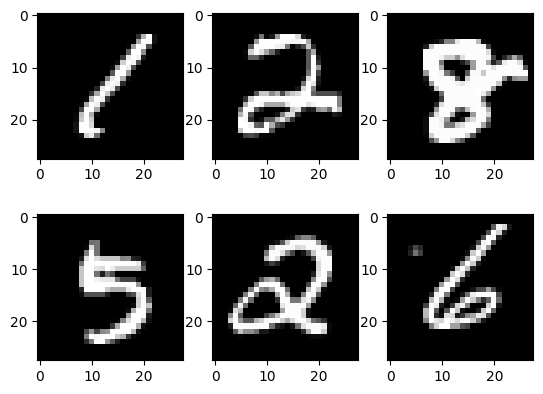

In [ ]:
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(example_data[i][0], cmap='gray')
plt.show()

### Experiments 1 : AE with n_layers =1

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz) across different values, specifically {2, 8, 16, 32, 64}. Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 1, considering likelihoods modeled as Gaussian and Bernoulli.

### Experiments with MNIST: Variational Autoencoder

## Test 3 VAE: MSE

### Experiment 3.1 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_1 = 'VAE'
model_config_3_1 = {'D_x': 784, 'n_layers': 1, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_1, fold_results_3_1 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_1),
                                                model_config=model_config_3_1,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:99.126070, Training Recons Loss: 92.399970, Training KLD Loss: 6.726100
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.07119183931896027, 'L1 Loss': 0.18870168147569008, 'BCE': 0.29882101524383464}, Validation VAE Loss: {'MSE': 62.743041829859955, 'L1 Loss': 62.70053883816333, 'BCE': 62.86519797304843}, Validation Recons Loss: {'MSE': 55.814401951242, 'L1 Loss': 55.771898878381606, 'BCE': 55.93655821617613}, Validation KLD Loss: {'MSE': 6.928639787308713, 'L1 Loss': 6.928639787308713, 'BCE': 6.928639787308713}
Train Fold/Epoch: 1/2, Training Loss:59.090207, Training Recons Loss: 53.139391, Training KLD Loss: 5.950816
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.06462726397241683, 'L1 Loss': 0.1695790190963035, 'BCE': 0.27440863213640576}, Validation VAE Loss: {'MSE': 55.753093394

## Visualizing reconstructions for all fold

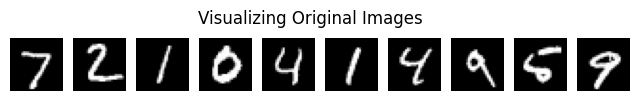

Visualizing reconstructions for fold 1


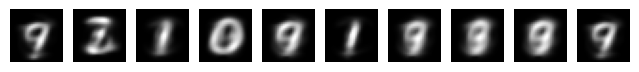

Visualizing reconstructions for fold 2


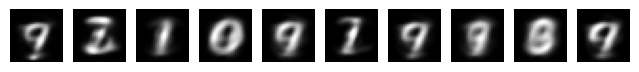

Visualizing reconstructions for fold 3


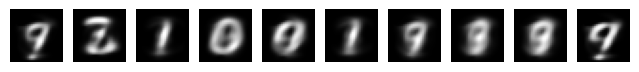

Visualizing reconstructions for fold 4


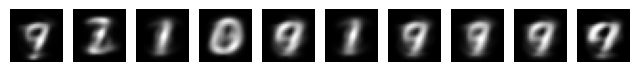

Visualizing reconstructions for fold 5


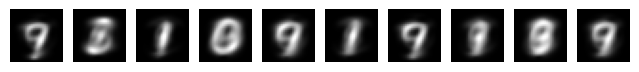

Visualizing reconstructions for fold 6


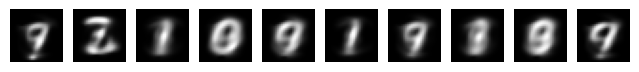

Visualizing reconstructions for fold 7


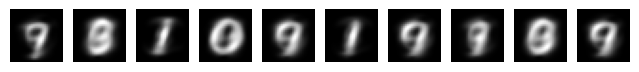

Visualizing reconstructions for fold 8


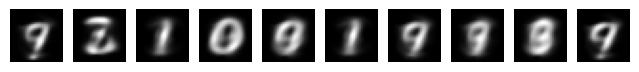

Visualizing reconstructions for fold 9


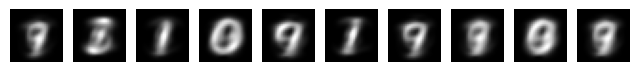

Visualizing reconstructions for fold 10


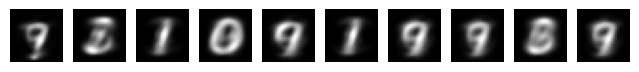

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_1):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

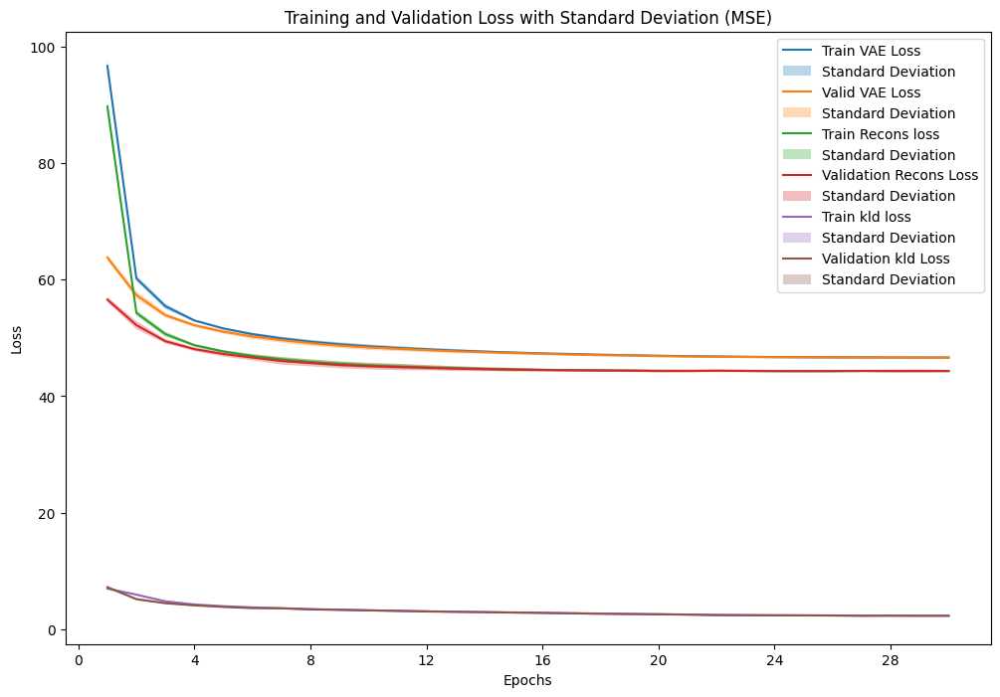

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_1_1 = VAE_plot_results(fold_results_3_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_1_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_1_1['epochs'])
VAE_plot_mean_std(result_data_3_1_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_1_1['epochs'])
VAE_plot_mean_std(result_data_3_1_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_1_1['epochs'])
VAE_plot_mean_std(result_data_3_1_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_1_1['epochs'])
VAE_plot_mean_std(result_data_3_1_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_1_1['epochs'])
VAE_plot_mean_std(result_data_3_1_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_1_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_1_1['valid_metrics'],
    result_data_3_1_1['test_metrics'],
    result_data_3_1_1['valid_result'],
    result_data_3_1_1['test_result'],
    result_data_3_1_1['recons_valid_result'],
    result_data_3_1_1['recons_test_result'],
    result_data_3_1_1['kld_valid_result'],
    result_data_3_1_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.056540           0.056233            46.632222      46.431346                44.32774          44.32774             2.304482       2.345051
Standard Deviation                 0.000261           0.000075             0.220595       0.025173                 0.20463           0.20463             0.060559       0.061538

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.056334,0.056324,46.377010,46.419098
1,2,0.056605,0.056299,46.616704,46.419947
2,3,0.056749,0.056267,46.807139,46.459834
3,4,0.056466,0.056070,46.659676,46.410773
4,5,0.056532,0.056218,46.589053,46.410288
5,6,0.056624,0.056155,46.812780,46.481205
6,7,0.056596,0.056272,46.683002,46.456684
7,8,0.057111,0.056292,47.064520,46.439630
8,9,0.056266,0.056171,46.438509,46.401228
9,10,0.056122,0.056256,46.273827,46.414771


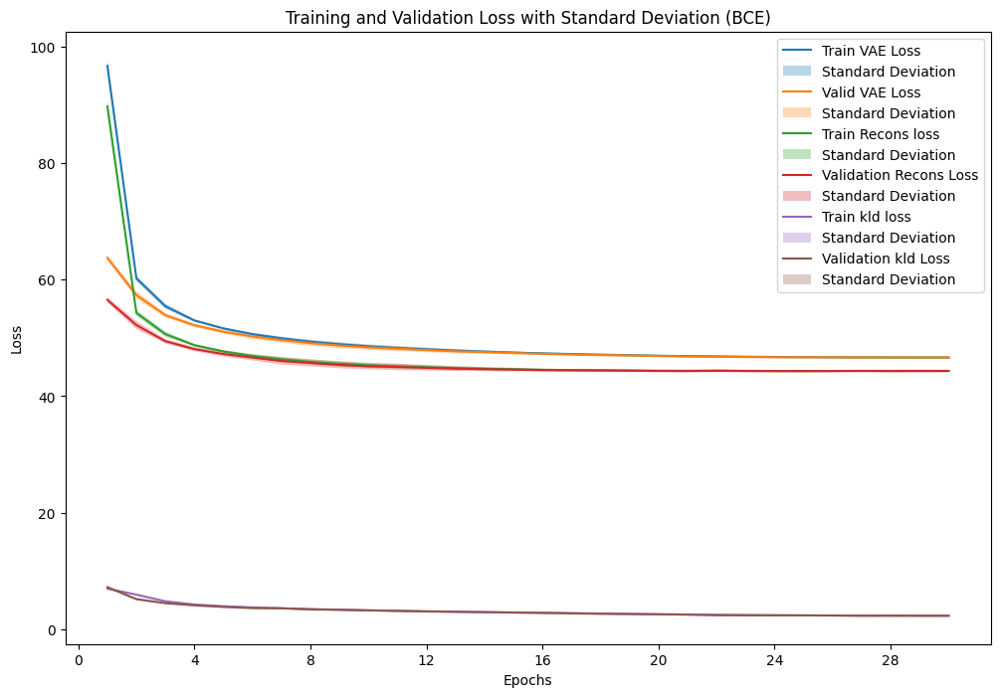

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_1_2 = VAE_plot_results(fold_results_3_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_1_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_1_2['epochs'])
VAE_plot_mean_std(result_data_3_1_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_1_2['epochs'])
VAE_plot_mean_std(result_data_3_1_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_1_2['epochs'])
VAE_plot_mean_std(result_data_3_1_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_1_2['epochs'])
VAE_plot_mean_std(result_data_3_1_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_1_2['epochs'])
VAE_plot_mean_std(result_data_3_1_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_1_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_1_2['valid_metrics'],
    result_data_3_1_2['test_metrics'],
    result_data_3_1_2['valid_result'],
    result_data_3_1_2['test_result'],
    result_data_3_1_2['recons_valid_result'],
    result_data_3_1_2['recons_test_result'],
    result_data_3_1_2['kld_valid_result'],
    result_data_3_1_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.231968           0.230503            46.642291      46.429045               44.337808         44.337808             2.304482       2.345051
Standard Deviation                 0.001051           0.000314             0.223575       0.028240                0.207294          0.207294             0.060559       0.061538

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.231541,0.230798,46.372663,46.406648
1,2,0.232331,0.230671,46.627477,46.408138
2,3,0.233292,0.230988,46.864802,46.460364
3,4,0.231972,0.230250,46.660635,46.411737
4,5,0.231613,0.230157,46.612835,46.426127
5,6,0.232550,0.230449,46.812199,46.471136
6,7,0.231557,0.230383,46.673072,46.473287
7,8,0.233900,0.230939,47.057534,46.420213
8,9,0.230673,0.230031,46.486203,46.385013
9,10,0.230255,0.230360,46.255485,46.427786


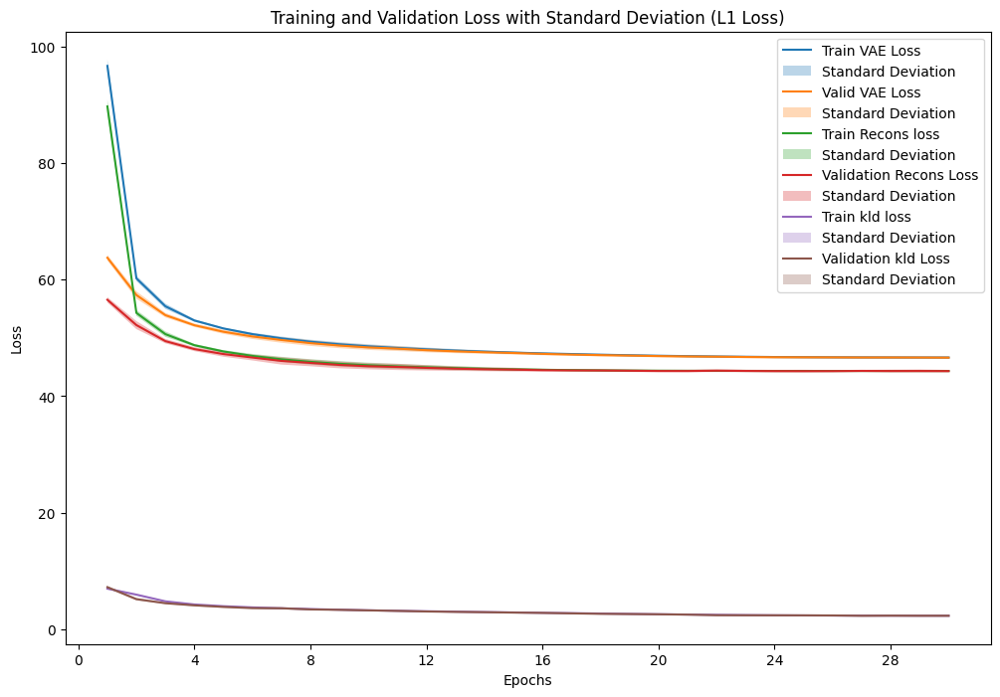

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_1_3 = VAE_plot_results(fold_results_3_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_1_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_1_3['epochs'])
VAE_plot_mean_std(result_data_3_1_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_1_3['epochs'])
VAE_plot_mean_std(result_data_3_1_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_1_3['epochs'])
VAE_plot_mean_std(result_data_3_1_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_1_3['epochs'])
VAE_plot_mean_std(result_data_3_1_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_1_3['epochs'])
VAE_plot_mean_std(result_data_3_1_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_1_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_1_3['valid_metrics'],
    result_data_3_1_3['test_metrics'],
    result_data_3_1_3['valid_result'],
    result_data_3_1_3['test_result'],
    result_data_3_1_3['recons_valid_result'],
    result_data_3_1_3['recons_test_result'],
    result_data_3_1_3['kld_valid_result'],
    result_data_3_1_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.129382           0.129199            46.619452      46.433866               44.314970         44.314970             2.304482       2.345051
Standard Deviation                 0.000442           0.000220             0.209410       0.023996                0.197951          0.197951             0.060559       0.061538

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.129188,0.129297,46.397889,46.398248
1,2,0.129090,0.129006,46.622649,46.435030
2,3,0.129566,0.129093,46.802817,46.457201
3,4,0.129480,0.129323,46.615827,46.432300
4,5,0.129428,0.129175,46.587393,46.432792
5,6,0.129315,0.128884,46.774433,46.459166
6,7,0.129896,0.129668,46.660168,46.460566
7,8,0.130278,0.129334,47.034596,46.445748
8,9,0.128735,0.128939,46.423056,46.384415
9,10,0.128843,0.129269,46.275694,46.433195


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_1 = sum(p.numel() for p in models_3_1[0].parameters())
print(f"Number of parameters in the model: {total_params_3_1}")

Number of parameters in the model: 5492


<ipython-input-18-14e9441719e3>:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


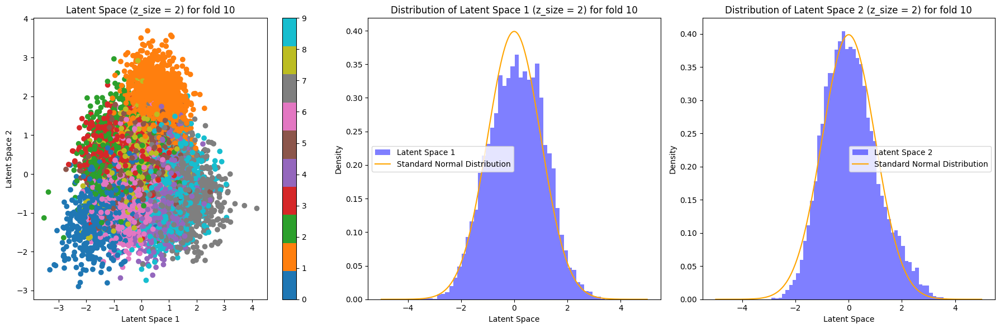

In [ ]:
latent_space_VAE_model(models_3_1[9], test_loader, device, number_fold=10)

### Experiment 3.2 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=8, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_2 = 'VAE'
model_config_3_2 = {'D_x': 784, 'n_layers': 1, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_2, fold_results_3_2 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_2),
                                                model_config=model_config_3_2,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:76.725693, Training Recons Loss: 65.663211, Training KLD Loss: 11.062482
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.05700849313685234, 'L1 Loss': 0.15911574154458147, 'BCE': 0.25707501807111377}, Validation VAE Loss: {'MSE': 55.01248871011937, 'L1 Loss': 55.100804389791286, 'BCE': 55.085302799306014}, Validation Recons Loss: {'MSE': 44.6946584011646, 'L1 Loss': 44.78297428374595, 'BCE': 44.767472774424455}, Validation KLD Loss: {'MSE': 10.317830288663824, 'L1 Loss': 10.317830288663824, 'BCE': 10.317830288663824}
Train Fold/Epoch: 1/2, Training Loss:49.967015, Training Recons Loss: 40.086230, Training KLD Loss: 9.880785
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.04652088924132763, 'L1 Loss': 0.13241821424441136, 'BCE': 0.22108464909994857}, Validation VAE Loss: {'MSE': 46.41

## Visualizing reconstructions for all fold

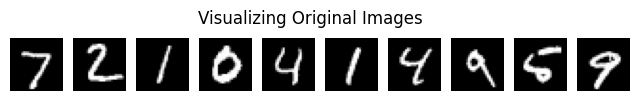

Visualizing reconstructions for fold 1


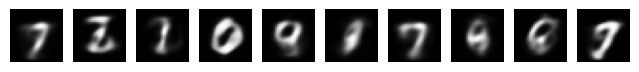

Visualizing reconstructions for fold 2


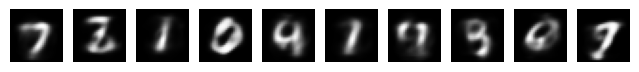

Visualizing reconstructions for fold 3


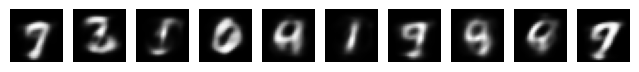

Visualizing reconstructions for fold 4


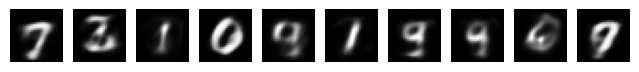

Visualizing reconstructions for fold 5


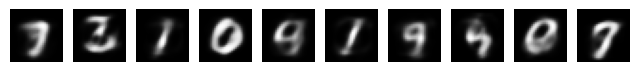

Visualizing reconstructions for fold 6


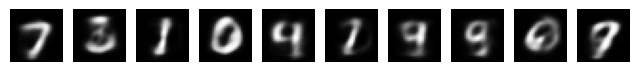

Visualizing reconstructions for fold 7


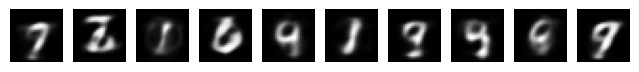

Visualizing reconstructions for fold 8


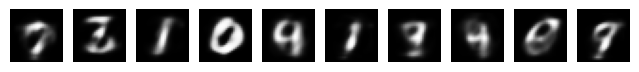

Visualizing reconstructions for fold 9


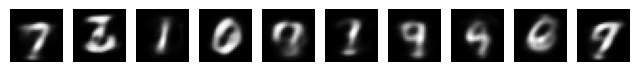

Visualizing reconstructions for fold 10


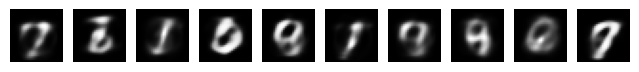

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_2):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

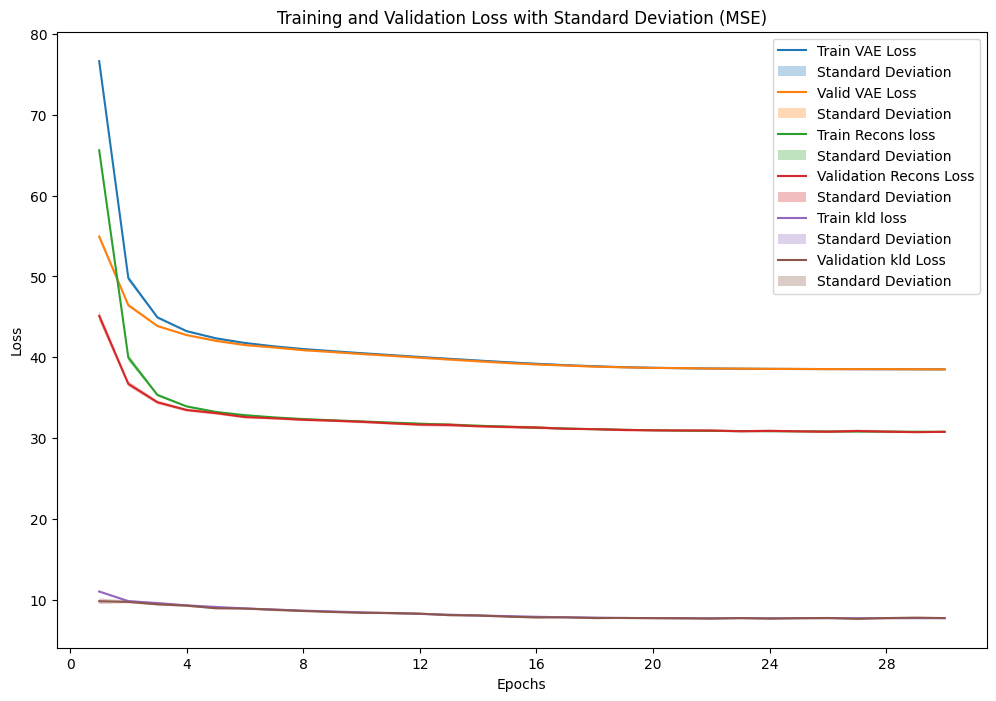

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_2_1 = VAE_plot_results(fold_results_3_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_2_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_2_1['epochs'])
VAE_plot_mean_std(result_data_3_2_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_2_1['epochs'])
VAE_plot_mean_std(result_data_3_2_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_2_1['epochs'])
VAE_plot_mean_std(result_data_3_2_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_2_1['epochs'])
VAE_plot_mean_std(result_data_3_2_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_2_1['epochs'])
VAE_plot_mean_std(result_data_3_2_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_2_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_2_1['valid_metrics'],
    result_data_3_2_1['test_metrics'],
    result_data_3_2_1['valid_result'],
    result_data_3_2_1['test_result'],
    result_data_3_2_1['recons_valid_result'],
    result_data_3_2_1['recons_test_result'],
    result_data_3_2_1['kld_valid_result'],
    result_data_3_2_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.039264           0.038767            38.516494      38.208303               30.782623         30.782623             7.733871       7.814828
Standard Deviation                 0.000155           0.000081             0.141194       0.050120                0.121865          0.121865             0.057501       0.050162

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.039187,0.038689,38.406058,38.132576
1,2,0.039236,0.038814,38.438427,38.179946
2,3,0.039466,0.038795,38.717228,38.255844
3,4,0.039106,0.038863,38.354823,38.242381
4,5,0.039422,0.038885,38.563774,38.270002
5,6,0.039313,0.038621,38.595840,38.128931
6,7,0.039292,0.038738,38.612834,38.248733
7,8,0.039499,0.038760,38.726297,38.160791
8,9,0.039070,0.038679,38.454423,38.236725
9,10,0.039045,0.038829,38.295239,38.227096


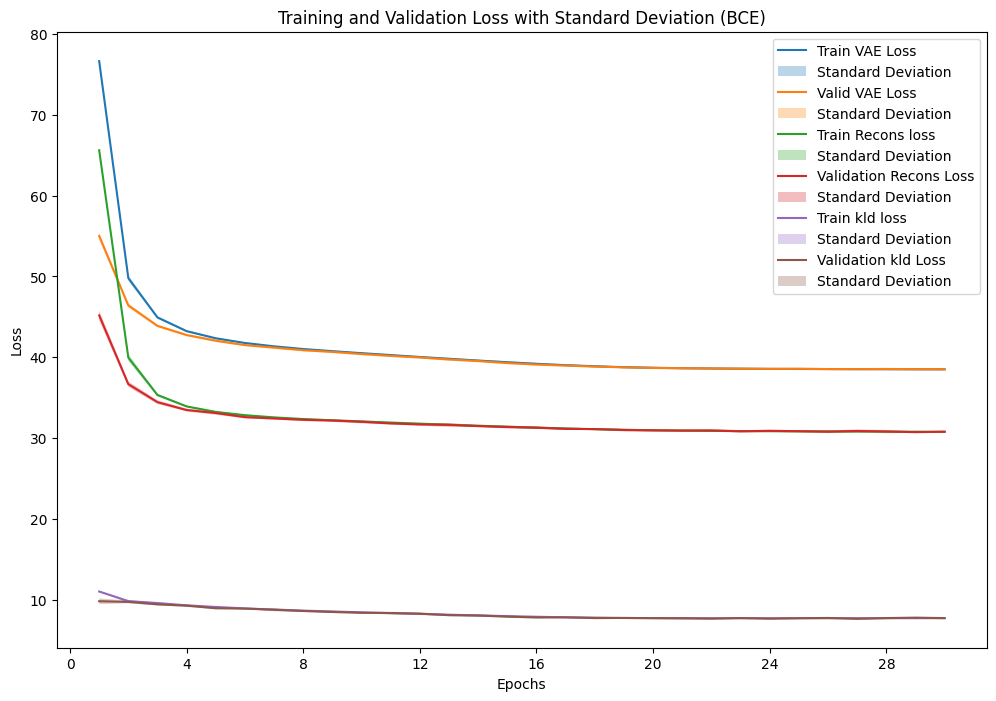

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_2_2 = VAE_plot_results(fold_results_3_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_2_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_2_2['epochs'])
VAE_plot_mean_std(result_data_3_2_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_2_2['epochs'])
VAE_plot_mean_std(result_data_3_2_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_2_2['epochs'])
VAE_plot_mean_std(result_data_3_2_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_2_2['epochs'])
VAE_plot_mean_std(result_data_3_2_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_2_2['epochs'])
VAE_plot_mean_std(result_data_3_2_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_2_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_2_2['valid_metrics'],
    result_data_3_2_2['test_metrics'],
    result_data_3_2_2['valid_result'],
    result_data_3_2_2['test_result'],
    result_data_3_2_2['recons_valid_result'],
    result_data_3_2_2['recons_test_result'],
    result_data_3_2_2['kld_valid_result'],
    result_data_3_2_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.182881           0.181169            38.538780      38.216204               30.804909         30.804909             7.733871       7.814828
Standard Deviation                 0.000489           0.000257             0.125815       0.056918                0.104912          0.104912             0.057501       0.050162

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.182893,0.180874,38.450248,38.140399
1,2,0.182889,0.181560,38.455123,38.243276
2,3,0.183634,0.181348,38.766411,38.274200
3,4,0.182822,0.181183,38.502786,38.190613
4,5,0.183082,0.181362,38.531517,38.226801
5,6,0.182997,0.180751,38.572813,38.167182
6,7,0.182791,0.181294,38.585084,38.295510
7,8,0.183547,0.180951,38.703285,38.117373
8,9,0.181969,0.180949,38.526231,38.270189
9,10,0.182186,0.181420,38.294300,38.236499


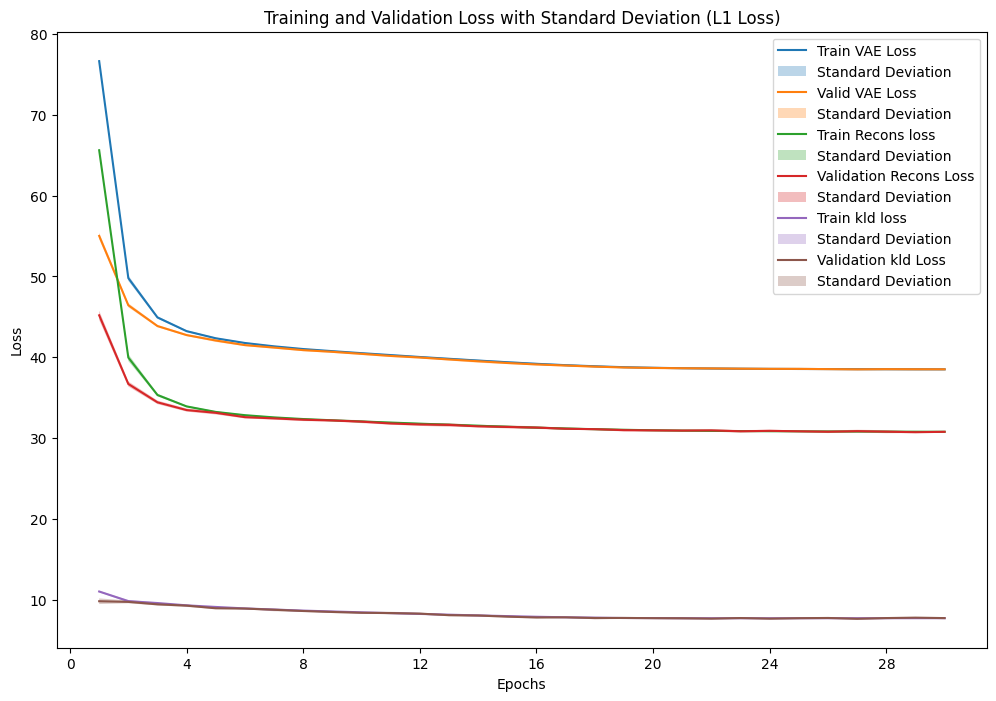

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_2_3 = VAE_plot_results(fold_results_3_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_2_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_2_3['epochs'])
VAE_plot_mean_std(result_data_3_2_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_2_3['epochs'])
VAE_plot_mean_std(result_data_3_2_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_2_3['epochs'])
VAE_plot_mean_std(result_data_3_2_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_2_3['epochs'])
VAE_plot_mean_std(result_data_3_2_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_2_3['epochs'])
VAE_plot_mean_std(result_data_3_2_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_2_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_2_3['valid_metrics'],
    result_data_3_2_3['test_metrics'],
    result_data_3_2_3['valid_result'],
    result_data_3_2_3['test_result'],
    result_data_3_2_3['recons_valid_result'],
    result_data_3_2_3['recons_test_result'],
    result_data_3_2_3['kld_valid_result'],
    result_data_3_2_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.096475           0.095792            38.543398      38.219182               30.809527         30.809527             7.733871       7.814828
Standard Deviation                 0.000359           0.000249             0.136589       0.045914                0.125729          0.125729             0.057501       0.050162

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.096295,0.095510,38.445946,38.123173
1,2,0.096492,0.096107,38.454330,38.193956
2,3,0.097018,0.096105,38.749987,38.258144
3,4,0.096180,0.095700,38.494164,38.265286
4,5,0.096832,0.095837,38.607239,38.213278
5,6,0.096637,0.095753,38.581248,38.171864
6,7,0.096579,0.095892,38.631667,38.279681
7,8,0.096759,0.095753,38.739039,38.199406
8,9,0.095719,0.095263,38.432007,38.237468
9,10,0.096239,0.095996,38.298350,38.249567


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_2 = sum(p.numel() for p in models_3_2[0].parameters())
print(f"Number of parameters in the model: {total_params_3_2}")

Number of parameters in the model: 19616


### Experiment 3.3 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_3 = 'VAE'
model_config_3_3 = {'D_x': 784, 'n_layers': 1, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_3, fold_results_3_3 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_3),
                                                model_config=model_config_3_3,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:69.361711, Training Recons Loss: 56.600904, Training KLD Loss: 12.760807
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.04918794861023731, 'L1 Loss': 0.14172249065434678, 'BCE': 0.23300950229167938}, Validation VAE Loss: {'MSE': 50.6092263485523, 'L1 Loss': 50.66133888731611, 'BCE': 50.68825656809705}, Validation Recons Loss: {'MSE': 38.56335161087361, 'L1 Loss': 38.61546419021931, 'BCE': 38.64238154634516}, Validation KLD Loss: {'MSE': 12.045874839133404, 'L1 Loss': 12.045874839133404, 'BCE': 12.045874839133404}
Train Fold/Epoch: 1/2, Training Loss:46.673823, Training Recons Loss: 34.500414, Training KLD Loss: 12.173409
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.039666950306359756, 'L1 Loss': 0.11899553009487213, 'BCE': 0.2017861362150375}, Validation VAE Loss: {'MSE': 43.7472

## Visualizing reconstructions for all fold

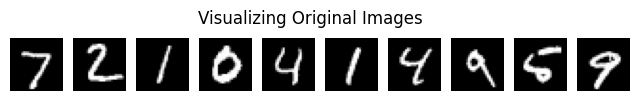

Visualizing reconstructions for fold 1


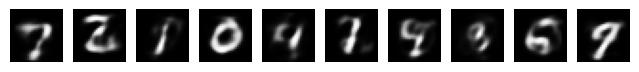

Visualizing reconstructions for fold 2


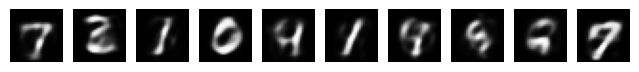

Visualizing reconstructions for fold 3


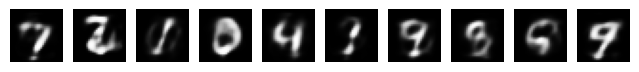

Visualizing reconstructions for fold 4


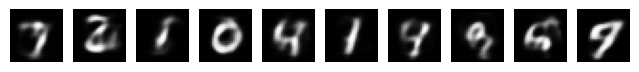

Visualizing reconstructions for fold 5


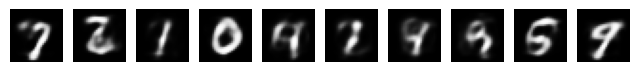

Visualizing reconstructions for fold 6


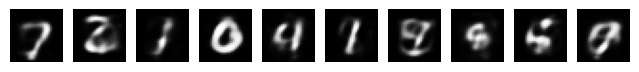

Visualizing reconstructions for fold 7


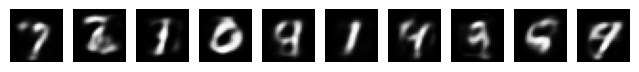

Visualizing reconstructions for fold 8


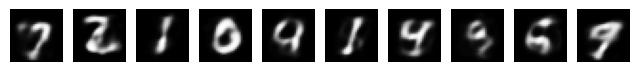

Visualizing reconstructions for fold 9


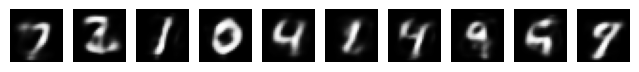

Visualizing reconstructions for fold 10


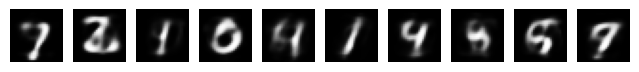

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_3):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

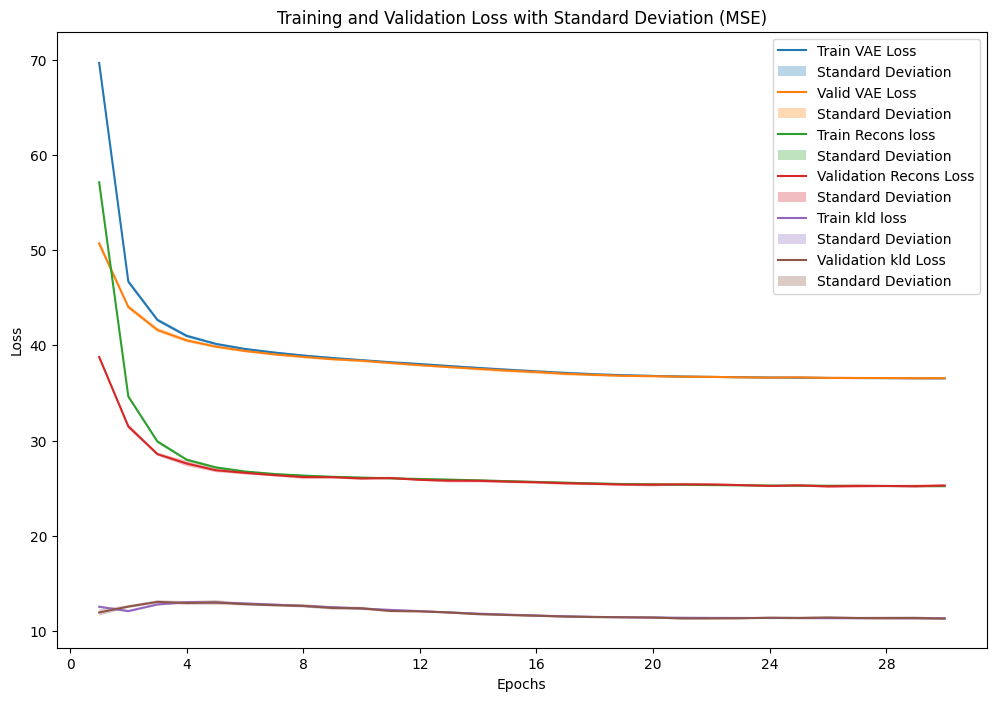

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_3_1 = VAE_plot_results(fold_results_3_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_3_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_3_1['epochs'])
VAE_plot_mean_std(result_data_3_3_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_3_1['epochs'])
VAE_plot_mean_std(result_data_3_3_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_3_1['epochs'])
VAE_plot_mean_std(result_data_3_3_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_3_1['epochs'])
VAE_plot_mean_std(result_data_3_3_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_3_1['epochs'])
VAE_plot_mean_std(result_data_3_3_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_3_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_3_1['valid_metrics'],
    result_data_3_3_1['test_metrics'],
    result_data_3_3_1['valid_result'],
    result_data_3_3_1['test_result'],
    result_data_3_3_1['recons_valid_result'],
    result_data_3_3_1['recons_test_result'],
    result_data_3_3_1['kld_valid_result'],
    result_data_3_3_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.032211           0.031700            36.537695      36.221939               25.253781         25.253781            11.283913      11.369383
Standard Deviation                 0.000164           0.000111             0.098242       0.044978                0.128209          0.128209             0.099916       0.113811

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.032050,0.031556,36.458563,36.203363
1,2,0.032017,0.031587,36.480422,36.248544
2,3,0.032409,0.031750,36.688161,36.212322
3,4,0.032169,0.031668,36.503513,36.220665
4,5,0.032414,0.031884,36.456662,36.165599
5,6,0.032313,0.031714,36.611879,36.188385
6,7,0.032264,0.031677,36.650494,36.260852
7,8,0.032413,0.031903,36.644720,36.211668
8,9,0.031989,0.031613,36.505769,36.328521
9,10,0.032076,0.031645,36.376766,36.179472


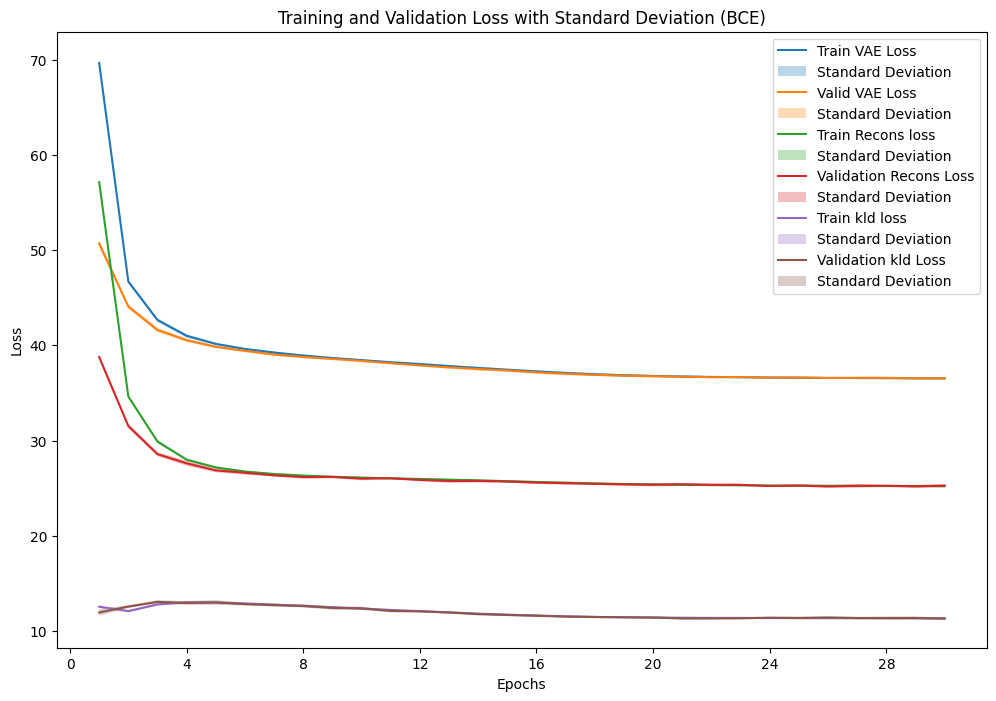

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_3_2 = VAE_plot_results(fold_results_3_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_3_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_3_2['epochs'])
VAE_plot_mean_std(result_data_3_3_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_3_2['epochs'])
VAE_plot_mean_std(result_data_3_3_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_3_2['epochs'])
VAE_plot_mean_std(result_data_3_3_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_3_2['epochs'])
VAE_plot_mean_std(result_data_3_3_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_3_2['epochs'])
VAE_plot_mean_std(result_data_3_3_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_3_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_3_2['valid_metrics'],
    result_data_3_3_2['test_metrics'],
    result_data_3_3_2['valid_result'],
    result_data_3_3_2['test_result'],
    result_data_3_3_2['recons_valid_result'],
    result_data_3_3_2['recons_test_result'],
    result_data_3_3_2['kld_valid_result'],
    result_data_3_3_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.162786           0.160919            36.550998      36.214497               25.267084         25.267084            11.283913      11.369383
Standard Deviation                 0.000690           0.000386             0.093283       0.057788                0.148665          0.148665             0.099916       0.113811

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.162401,0.160328,36.444116,36.157900
1,2,0.162199,0.160372,36.521620,36.198915
2,3,0.163145,0.161215,36.665000,36.274632
3,4,0.162716,0.160909,36.477755,36.192969
4,5,0.163734,0.161296,36.600363,36.144214
5,6,0.163351,0.161250,36.587821,36.225500
6,7,0.162469,0.160845,36.577829,36.261458
7,8,0.163941,0.161557,36.703435,36.190773
8,9,0.161735,0.160686,36.550209,36.337668
9,10,0.162173,0.160734,36.381828,36.160935


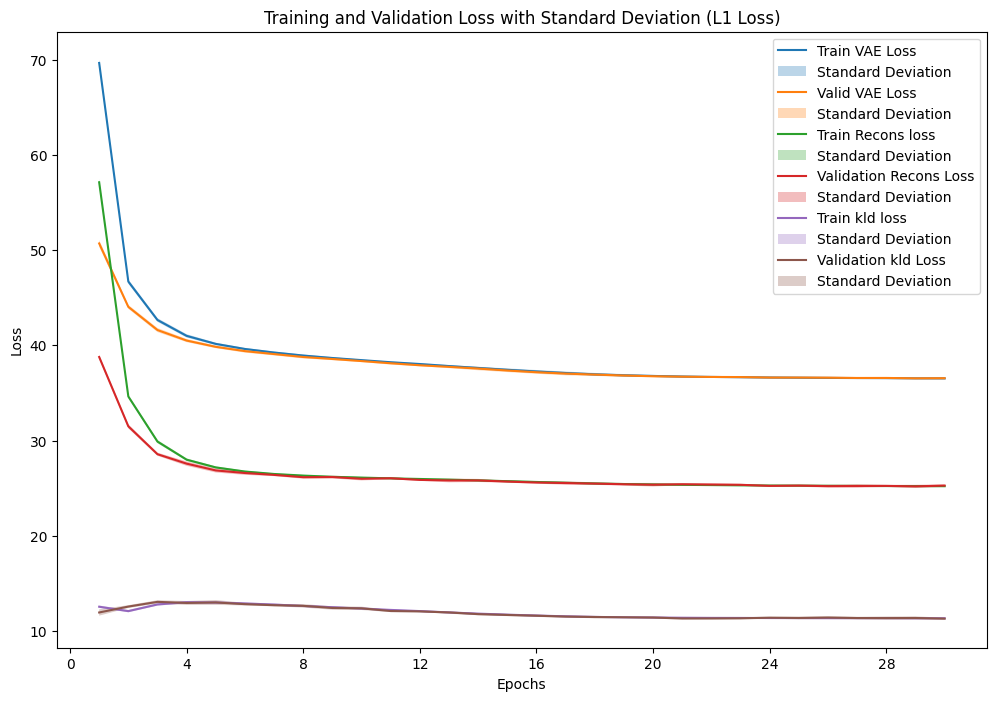

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_3_3 = VAE_plot_results(fold_results_3_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_3_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_3_3['epochs'])
VAE_plot_mean_std(result_data_3_3_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_3_3['epochs'])
VAE_plot_mean_std(result_data_3_3_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_3_3['epochs'])
VAE_plot_mean_std(result_data_3_3_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_3_3['epochs'])
VAE_plot_mean_std(result_data_3_3_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_3_3['epochs'])
VAE_plot_mean_std(result_data_3_3_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_3_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_3_3['valid_metrics'],
    result_data_3_3_3['test_metrics'],
    result_data_3_3_3['valid_result'],
    result_data_3_3_3['test_result'],
    result_data_3_3_3['recons_valid_result'],
    result_data_3_3_3['recons_test_result'],
    result_data_3_3_3['kld_valid_result'],
    result_data_3_3_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.082820           0.082032            36.546929      36.228732               25.263016         25.263016            11.283913      11.369383
Standard Deviation                 0.000398           0.000311             0.093882       0.049884                0.137931          0.137931             0.099916       0.113811

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.082524,0.081577,36.530863,36.172843
1,2,0.082270,0.081727,36.507584,36.240193
2,3,0.083011,0.082205,36.601649,36.238724
3,4,0.083024,0.082376,36.471626,36.235246
4,5,0.083034,0.081944,36.566787,36.132822
5,6,0.083343,0.082473,36.625525,36.243341
6,7,0.082784,0.082018,36.645345,36.304854
7,8,0.083393,0.082332,36.667837,36.210650
8,9,0.082156,0.081559,36.519744,36.302508
9,10,0.082657,0.082108,36.332332,36.206139


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_3 = sum(p.numel() for p in models_3_3[0].parameters())
print(f"Number of parameters in the model: {total_params_3_3}")

Number of parameters in the model: 38448


### Experiment 3.4 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=32, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_4 = 'VAE'
model_config_3_4 = {'D_x': 784, 'n_layers': 1, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_4, fold_results_3_4 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_4),
                                                model_config=model_config_3_4,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:65.071746, Training Recons Loss: 51.663799, Training KLD Loss: 13.407947
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.047159251103058776, 'L1 Loss': 0.1392501860539964, 'BCE': 0.22736441407431948}, Validation VAE Loss: {'MSE': 49.25198948636968, 'L1 Loss': 49.3526408418696, 'BCE': 49.393862054703085}, Validation Recons Loss: {'MSE': 36.972852909818606, 'L1 Loss': 37.073504265318526, 'BCE': 37.11472535640635}, Validation KLD Loss: {'MSE': 12.27913662727843, 'L1 Loss': 12.27913662727843, 'BCE': 12.27913662727843}
Train Fold/Epoch: 1/2, Training Loss:46.565204, Training Recons Loss: 33.267984, Training KLD Loss: 13.297220
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.039844325287862026, 'L1 Loss': 0.1150878461751532, 'BCE': 0.19961076594413596}, Validation VAE Loss: {'MSE': 44.4701

## Visualizing reconstructions for all fold

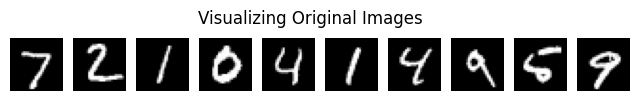

Visualizing reconstructions for fold 1


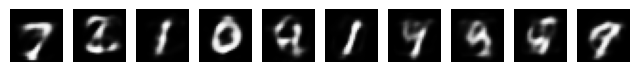

Visualizing reconstructions for fold 2


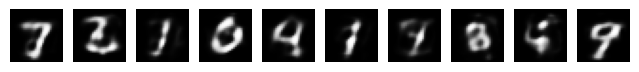

Visualizing reconstructions for fold 3


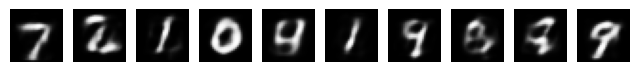

Visualizing reconstructions for fold 4


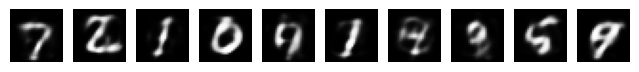

Visualizing reconstructions for fold 5


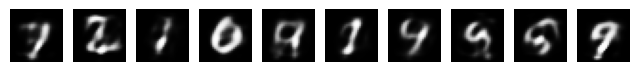

Visualizing reconstructions for fold 6


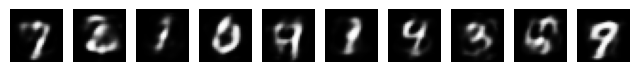

Visualizing reconstructions for fold 7


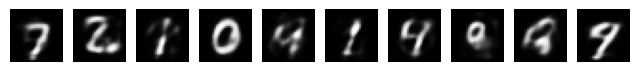

Visualizing reconstructions for fold 8


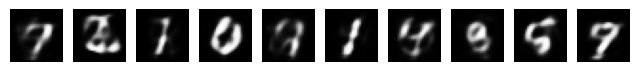

Visualizing reconstructions for fold 9


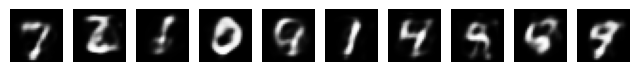

Visualizing reconstructions for fold 10


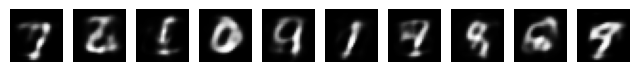

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_4):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

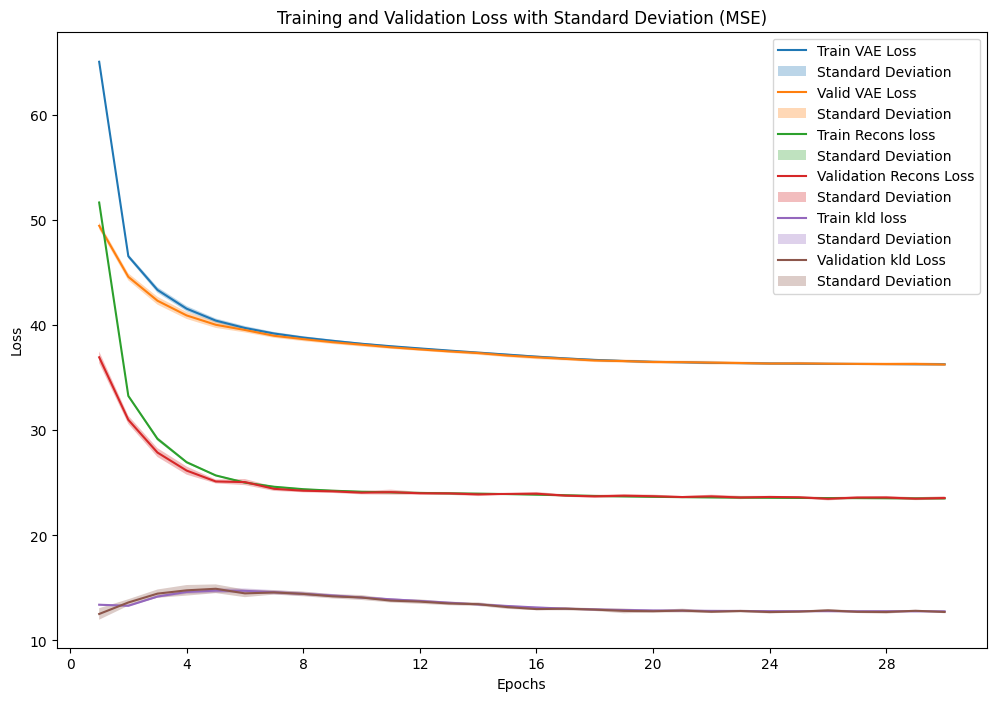

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_4_1 = VAE_plot_results(fold_results_3_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_4_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_4_1['epochs'])
VAE_plot_mean_std(result_data_3_4_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_4_1['epochs'])
VAE_plot_mean_std(result_data_3_4_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_4_1['epochs'])
VAE_plot_mean_std(result_data_3_4_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_4_1['epochs'])
VAE_plot_mean_std(result_data_3_4_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_4_1['epochs'])
VAE_plot_mean_std(result_data_3_4_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_4_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_4_1['valid_metrics'],
    result_data_3_4_1['test_metrics'],
    result_data_3_4_1['valid_result'],
    result_data_3_4_1['test_result'],
    result_data_3_4_1['recons_valid_result'],
    result_data_3_4_1['recons_test_result'],
    result_data_3_4_1['kld_valid_result'],
    result_data_3_4_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.030086           0.029557            36.296553      35.967150               23.587079         23.587079            12.709474      12.794117
Standard Deviation                 0.000190           0.000164             0.119198       0.074701                0.148667          0.148667             0.120081       0.119047

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.030424,0.029771,36.285538,35.898858
1,2,0.030130,0.029616,36.361399,36.047292
2,3,0.030334,0.029838,36.379140,36.018545
3,4,0.030041,0.029677,36.274688,36.089831
4,5,0.030041,0.029410,36.306660,35.961918
5,6,0.030107,0.029491,36.335133,35.907618
6,7,0.029915,0.029351,36.324762,35.946894
7,8,0.030203,0.029632,36.466597,35.987203
8,9,0.029873,0.029403,36.245835,35.994205
9,10,0.029788,0.029383,35.985775,35.819135


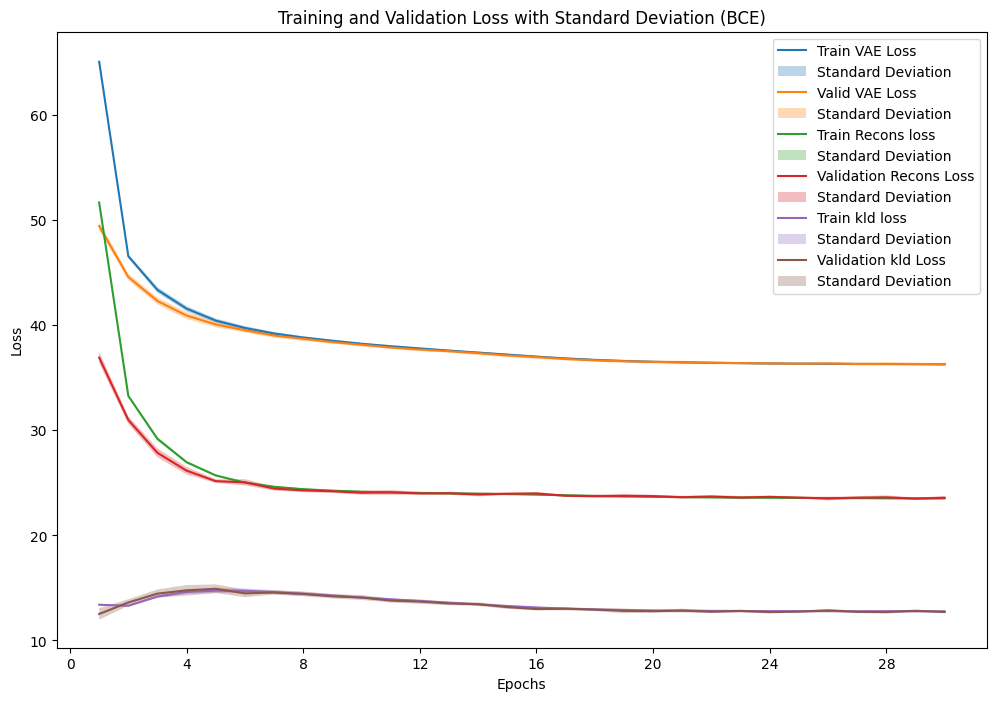

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_4_2 = VAE_plot_results(fold_results_3_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_4_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_4_2['epochs'])
VAE_plot_mean_std(result_data_3_4_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_4_2['epochs'])
VAE_plot_mean_std(result_data_3_4_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_4_2['epochs'])
VAE_plot_mean_std(result_data_3_4_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_4_2['epochs'])
VAE_plot_mean_std(result_data_3_4_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_4_2['epochs'])
VAE_plot_mean_std(result_data_3_4_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_4_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_4_2['valid_metrics'],
    result_data_3_4_2['test_metrics'],
    result_data_3_4_2['valid_result'],
    result_data_3_4_2['test_result'],
    result_data_3_4_2['recons_valid_result'],
    result_data_3_4_2['recons_test_result'],
    result_data_3_4_2['kld_valid_result'],
    result_data_3_4_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.156475           0.154594            36.291285      35.950828               23.581811         23.581811            12.709474      12.794117
Standard Deviation                 0.000743           0.000519             0.137984       0.068621                0.163924          0.163924             0.120081       0.119047

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.157392,0.155273,36.233207,35.903827
1,2,0.156815,0.154504,36.496971,36.005014
2,3,0.157494,0.155605,36.410727,36.016612
3,4,0.156521,0.154802,36.296976,36.027815
4,5,0.156220,0.154061,36.267730,35.896010
5,6,0.156716,0.154646,36.285226,35.962170
6,7,0.155719,0.154073,36.287549,35.948811
7,8,0.157117,0.154825,36.452107,35.980552
8,9,0.155343,0.154136,36.200408,35.980334
9,10,0.155410,0.154012,35.981948,35.787129


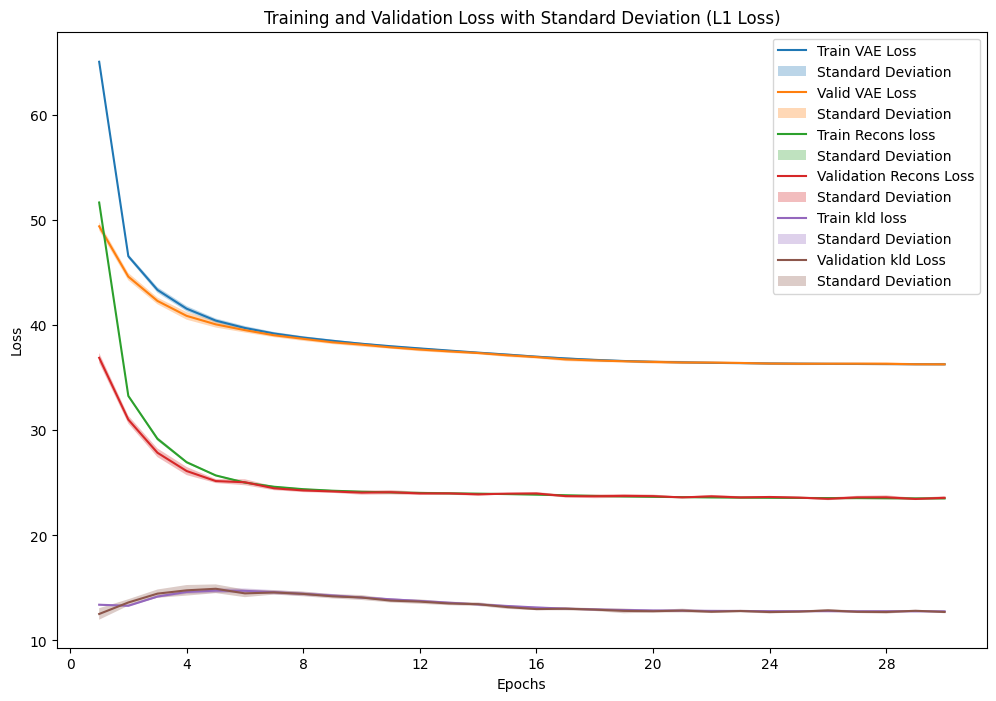

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_4_3 = VAE_plot_results(fold_results_3_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_4_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_4_3['epochs'])
VAE_plot_mean_std(result_data_3_4_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_4_3['epochs'])
VAE_plot_mean_std(result_data_3_4_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_4_3['epochs'])
VAE_plot_mean_std(result_data_3_4_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_4_3['epochs'])
VAE_plot_mean_std(result_data_3_4_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_4_3['epochs'])
VAE_plot_mean_std(result_data_3_4_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_4_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_4_3['valid_metrics'],
    result_data_3_4_3['test_metrics'],
    result_data_3_4_3['valid_result'],
    result_data_3_4_3['test_result'],
    result_data_3_4_3['recons_valid_result'],
    result_data_3_4_3['recons_test_result'],
    result_data_3_4_3['kld_valid_result'],
    result_data_3_4_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.078516           0.077698            36.306226      35.959026               23.596752         23.596752            12.709474      12.794117
Standard Deviation                 0.000288           0.000341             0.098704       0.069808                0.102091          0.102091             0.120081       0.119047

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.078728,0.077983,36.207124,35.910637
1,2,0.078127,0.077210,36.452977,35.999601
2,3,0.079175,0.078447,36.298488,35.955649
3,4,0.078298,0.077758,36.237246,36.083751
4,5,0.078432,0.077367,36.251575,35.858297
5,6,0.078658,0.077775,36.343251,35.997699
6,7,0.078333,0.077450,36.333315,35.971601
7,8,0.078629,0.077915,36.414813,36.003700
8,9,0.078543,0.077572,36.403873,35.973471
9,10,0.078234,0.077501,36.119593,35.835853


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_4 = sum(p.numel() for p in models_3_4[0].parameters())
print(f"Number of parameters in the model: {total_params_3_4}")

Number of parameters in the model: 76112


### Experiment 3.5 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=64, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_5 = 'VAE'
model_config_3_5 = {'D_x': 784, 'n_layers': 1, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_5, fold_results_3_5 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_5),
                                                model_config=model_config_3_5,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:62.080316, Training Recons Loss: 48.308419, Training KLD Loss: 13.771897
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.046188908530042525, 'L1 Loss': 0.1273477718709631, 'BCE': 0.2184404892490265}, Validation VAE Loss: {'MSE': 49.2114961096581, 'L1 Loss': 49.30953484393181, 'BCE': 49.421243789348196}, Validation Recons Loss: {'MSE': 36.21210437125348, 'L1 Loss': 36.31014300407247, 'BCE': 36.42185199007075}, Validation KLD Loss: {'MSE': 12.99939189058669, 'L1 Loss': 12.99939189058669, 'BCE': 12.99939189058669}
Train Fold/Epoch: 1/2, Training Loss:47.486450, Training Recons Loss: 33.769616, Training KLD Loss: 13.716833
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.03989300654923662, 'L1 Loss': 0.10423165092125852, 'BCE': 0.19287111261423598}, Validation VAE Loss: {'MSE': 45.7075418

## Visualizing reconstructions for all fold

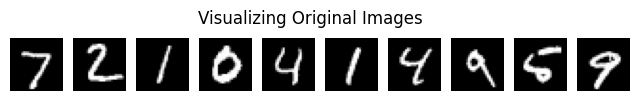

Visualizing reconstructions for fold 1


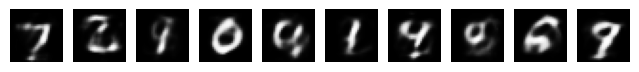

Visualizing reconstructions for fold 2


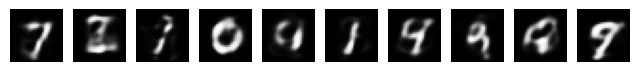

Visualizing reconstructions for fold 3


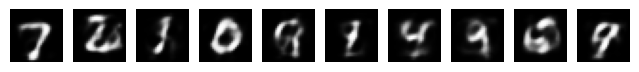

Visualizing reconstructions for fold 4


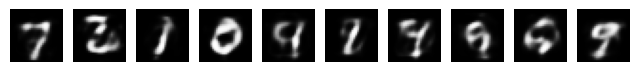

Visualizing reconstructions for fold 5


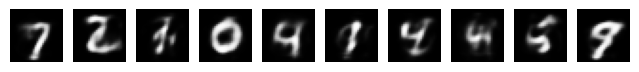

Visualizing reconstructions for fold 6


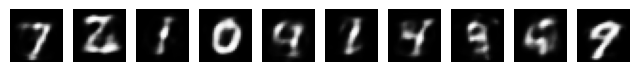

Visualizing reconstructions for fold 7


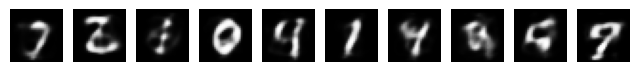

Visualizing reconstructions for fold 8


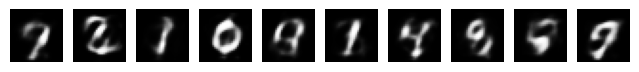

Visualizing reconstructions for fold 9


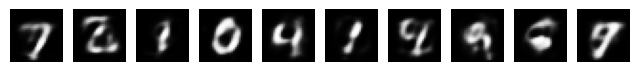

Visualizing reconstructions for fold 10


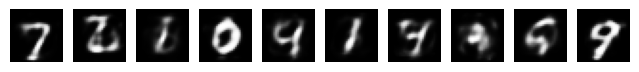

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_5):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

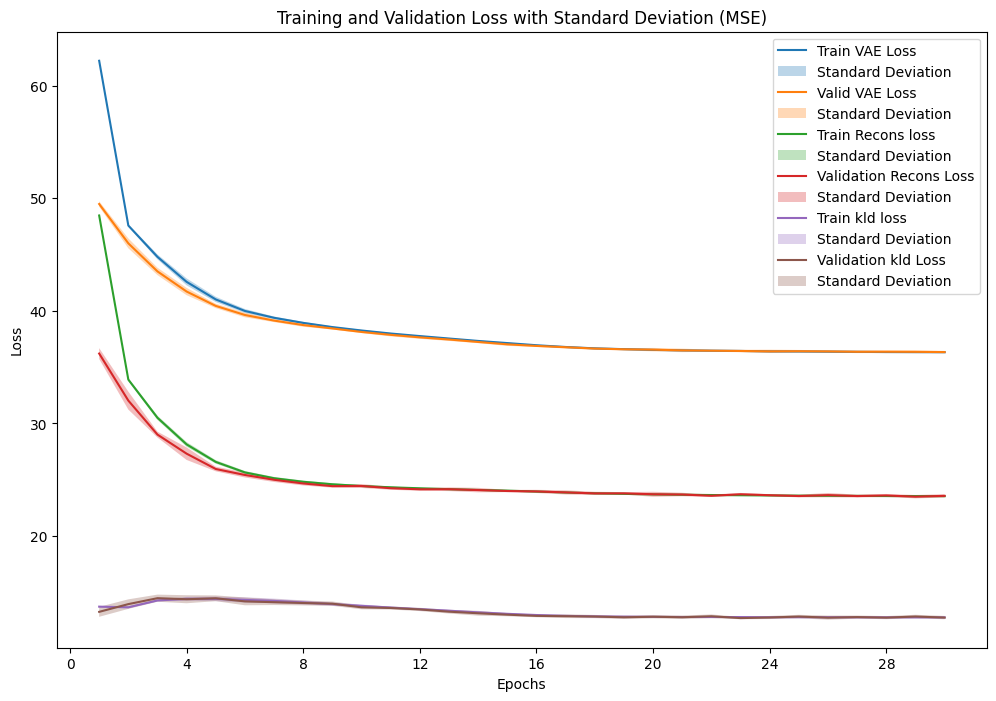

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_5_1 = VAE_plot_results(fold_results_3_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_5_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_5_1['epochs'])
VAE_plot_mean_std(result_data_3_5_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_5_1['epochs'])
VAE_plot_mean_std(result_data_3_5_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_5_1['epochs'])
VAE_plot_mean_std(result_data_3_5_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_5_1['epochs'])
VAE_plot_mean_std(result_data_3_5_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_5_1['epochs'])
VAE_plot_mean_std(result_data_3_5_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_5_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_5_1['valid_metrics'],
    result_data_3_5_1['test_metrics'],
    result_data_3_5_1['valid_result'],
    result_data_3_5_1['test_result'],
    result_data_3_5_1['recons_valid_result'],
    result_data_3_5_1['recons_test_result'],
    result_data_3_5_1['kld_valid_result'],
    result_data_3_5_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.030077           0.029532            36.344616      36.004641               23.580371         23.580371            12.764245      12.851369
Standard Deviation                 0.000228           0.000178             0.133716       0.047596                0.178768          0.178768             0.147140       0.145763

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.030032,0.029439,36.274245,35.940094
1,2,0.029636,0.029186,36.230642,35.992971
2,3,0.030409,0.029760,36.482183,36.014636
3,4,0.030039,0.029598,36.219571,35.978294
4,5,0.030319,0.029624,36.456394,36.047968
5,6,0.030001,0.029415,36.514666,36.122895
6,7,0.030175,0.029694,36.304123,35.981234
7,8,0.030139,0.029509,36.539461,35.990523
8,9,0.030260,0.029751,36.284343,36.003943
9,10,0.029761,0.029346,36.140535,35.973854


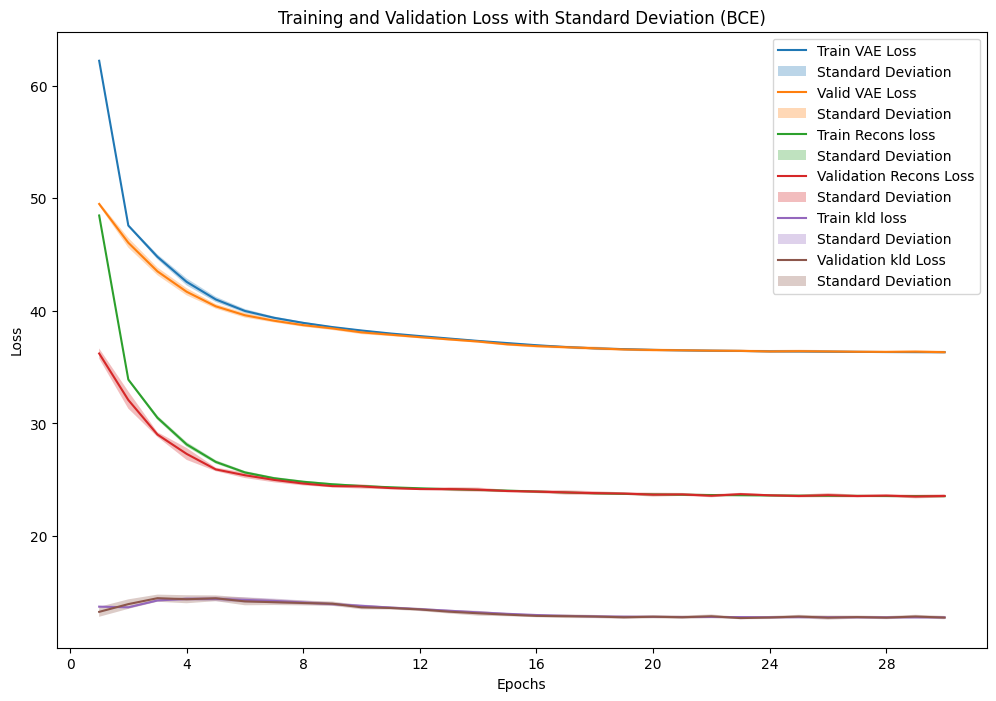

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_5_2 = VAE_plot_results(fold_results_3_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_5_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_5_2['epochs'])
VAE_plot_mean_std(result_data_3_5_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_5_2['epochs'])
VAE_plot_mean_std(result_data_3_5_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_5_2['epochs'])
VAE_plot_mean_std(result_data_3_5_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_5_2['epochs'])
VAE_plot_mean_std(result_data_3_5_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_5_2['epochs'])
VAE_plot_mean_std(result_data_3_5_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_5_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_5_2['valid_metrics'],
    result_data_3_5_2['test_metrics'],
    result_data_3_5_2['valid_result'],
    result_data_3_5_2['test_result'],
    result_data_3_5_2['recons_valid_result'],
    result_data_3_5_2['recons_test_result'],
    result_data_3_5_2['kld_valid_result'],
    result_data_3_5_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.156438           0.154549            36.342614      36.002427               23.578369         23.578369            12.764245      12.851369
Standard Deviation                 0.000509           0.000578             0.087377       0.040535                0.135841          0.135841             0.147140       0.145763

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.156473,0.154335,36.280126,35.958001
1,2,0.155320,0.153385,36.281901,35.916156
2,3,0.156947,0.155293,36.352801,36.044953
3,4,0.156598,0.154846,36.292184,36.010903
4,5,0.156828,0.154611,36.395925,36.012374
5,6,0.156671,0.153961,36.539092,36.058149
6,7,0.156774,0.155034,36.333270,35.982476
7,8,0.156644,0.154648,36.435659,36.014286
8,9,0.156514,0.155268,36.284619,36.037435
9,10,0.155611,0.154115,36.230561,35.989536


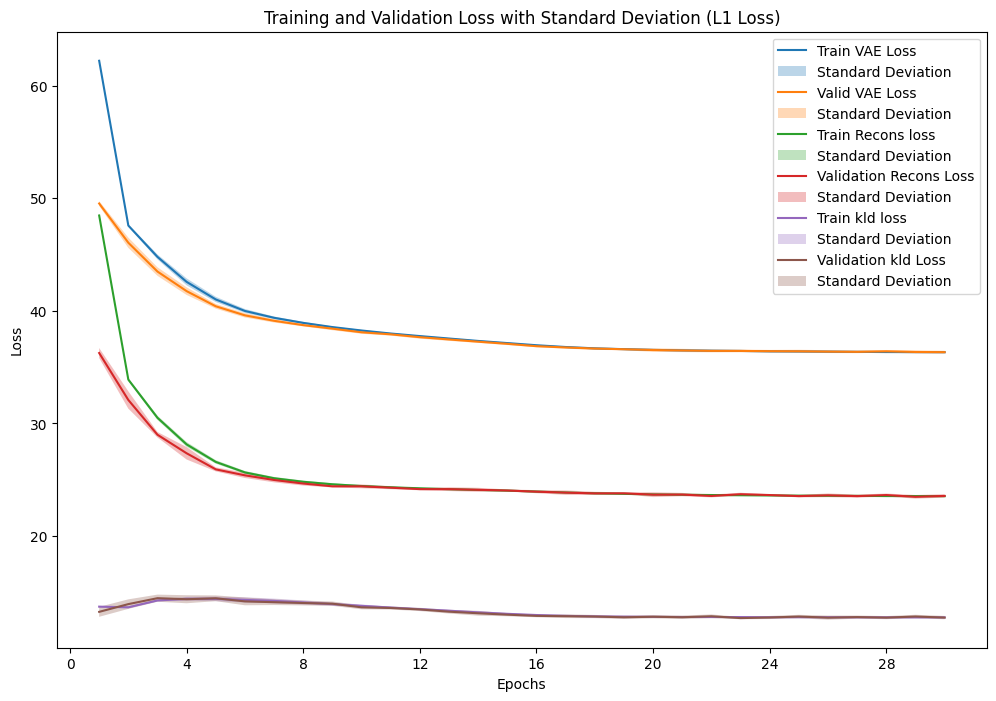

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_5_3 = VAE_plot_results(fold_results_3_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_5_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_5_3['epochs'])
VAE_plot_mean_std(result_data_3_5_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_5_3['epochs'])
VAE_plot_mean_std(result_data_3_5_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_5_3['epochs'])
VAE_plot_mean_std(result_data_3_5_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_5_3['epochs'])
VAE_plot_mean_std(result_data_3_5_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_5_3['epochs'])
VAE_plot_mean_std(result_data_3_5_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_5_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_5_3['valid_metrics'],
    result_data_3_5_3['test_metrics'],
    result_data_3_5_3['valid_result'],
    result_data_3_5_3['test_result'],
    result_data_3_5_3['recons_valid_result'],
    result_data_3_5_3['recons_test_result'],
    result_data_3_5_3['kld_valid_result'],
    result_data_3_5_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.078422           0.077621            36.350476      36.006164               23.586231         23.586231            12.764245      12.851369
Standard Deviation                 0.000280           0.000245             0.120885       0.042960                0.161206          0.161206             0.147140       0.145763

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.078090,0.077359,36.276631,35.961886
1,2,0.078069,0.077300,36.248797,35.935311
2,3,0.078944,0.077786,36.532746,36.018213
3,4,0.078587,0.078027,36.281503,36.039521
4,5,0.078331,0.077473,36.393256,36.053886
5,6,0.078407,0.077294,36.550397,36.062711
6,7,0.078550,0.077861,36.235538,35.964565
7,8,0.078749,0.077813,36.482753,36.002250
8,9,0.078410,0.077727,36.263558,35.973332
9,10,0.078081,0.077573,36.239577,36.049967


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_5 = sum(p.numel() for p in models_3_5[0].parameters())
print(f"Number of parameters in the model: {total_params_3_5}")

Number of parameters in the model: 151440


## Test 4 VAE: BCE

### Experiment 4.1 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=2, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_1 = 'VAE'
model_config_4_1 = {'D_x': 784, 'n_layers': 1, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_1, fold_results_4_1 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_1),
                                                model_config=model_config_4_1,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:319.626408, Training Recons Loss: 306.210578, Training KLD Loss: 13.415830
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.06835016758835062, 'L1 Loss': 0.16643589196052958, 'BCE': 0.27572575750503137}, Validation VAE Loss: {'MSE': 231.3661500646713, 'L1 Loss': 231.37458752571268, 'BCE': 231.3697360424285}, Validation Recons Loss: {'MSE': 216.16540770835064, 'L1 Loss': 216.17384549404713, 'BCE': 216.16899352378033}, Validation KLD Loss: {'MSE': 15.20074231573876, 'L1 Loss': 15.20074231573876, 'BCE': 15.20074231573876}
Train Fold/Epoch: 1/2, Training Loss:223.345381, Training Recons Loss: 210.473269, Training KLD Loss: 12.872112
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.06503257559652025, 'L1 Loss': 0.1535317601358637, 'BCE': 0.2613811489749462}, Validation VAE Loss: {'MSE': 215

## Visualizing reconstructions for all fold

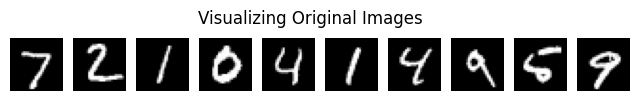

Visualizing reconstructions for fold 1


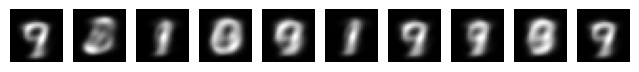

Visualizing reconstructions for fold 2


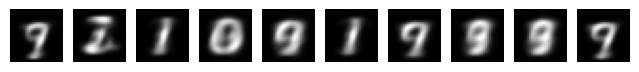

Visualizing reconstructions for fold 3


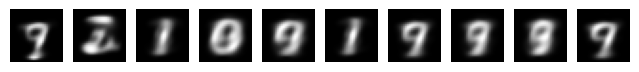

Visualizing reconstructions for fold 4


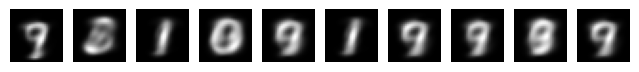

Visualizing reconstructions for fold 5


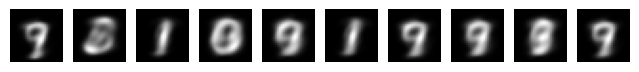

Visualizing reconstructions for fold 6


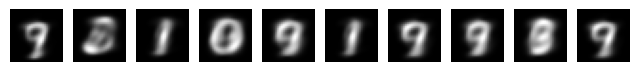

Visualizing reconstructions for fold 7


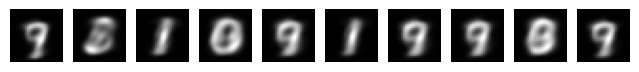

Visualizing reconstructions for fold 8


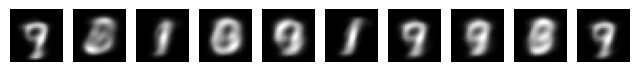

Visualizing reconstructions for fold 9


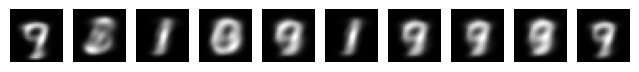

Visualizing reconstructions for fold 10


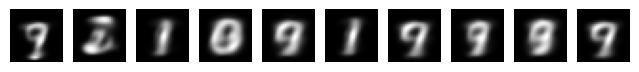

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_1):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

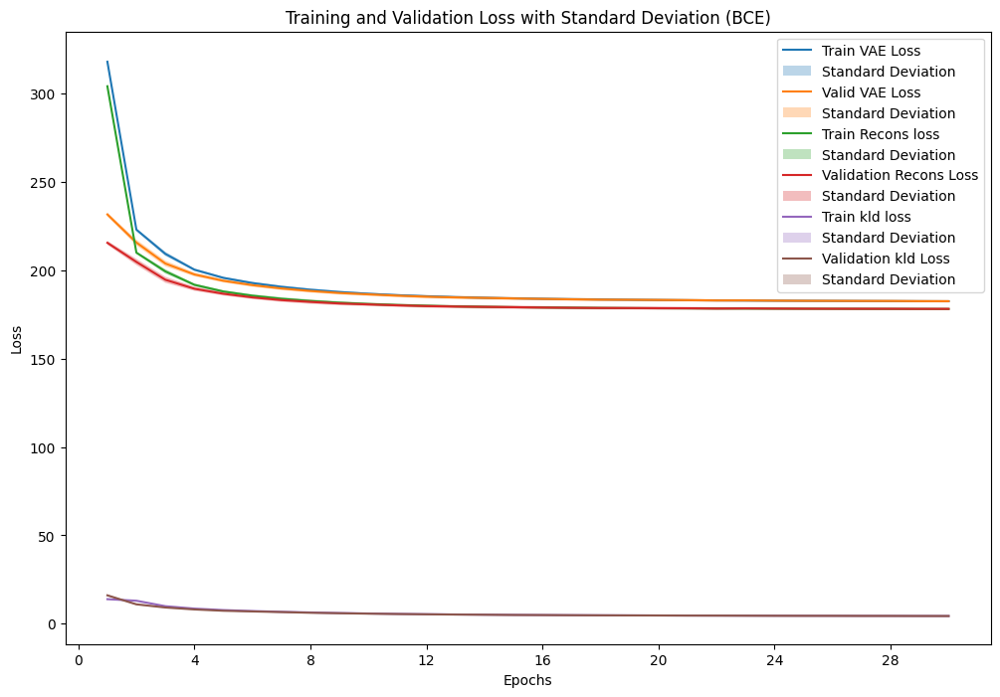

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_1_1 = VAE_plot_results(fold_results_4_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_1_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_1_1['epochs'])
VAE_plot_mean_std(result_data_4_1_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_1_1['epochs'])
VAE_plot_mean_std(result_data_4_1_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_1_1['epochs'])
VAE_plot_mean_std(result_data_4_1_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_1_1['epochs'])
VAE_plot_mean_std(result_data_4_1_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_1_1['epochs'])
VAE_plot_mean_std(result_data_4_1_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_1_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_1_1['valid_metrics'],
    result_data_4_1_1['test_metrics'],
    result_data_4_1_1['valid_result'],
    result_data_4_1_1['test_result'],
    result_data_4_1_1['recons_valid_result'],
    result_data_4_1_1['recons_test_result'],
    result_data_4_1_1['kld_valid_result'],
    result_data_4_1_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.227362           0.226324           182.596947     181.796366              178.251888        178.251888             4.345059       4.358527
Standard Deviation                 0.000904           0.000175             0.720614       0.129493                0.708425          0.708425             0.083829       0.087897

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.227081,0.226495,182.323041,181.884518
1,2,0.227397,0.226402,182.473525,181.702268
2,3,0.228495,0.226171,183.530362,181.731905
3,4,0.226865,0.226266,182.225347,181.772280
4,5,0.227172,0.226305,182.627073,181.973537
5,6,0.228320,0.226197,183.397591,181.741841
6,7,0.227047,0.226162,182.390599,181.704613
7,8,0.228947,0.226707,183.786949,182.036196
8,9,0.226299,0.226420,181.738979,181.831736
9,10,0.225999,0.226112,181.476008,181.584770


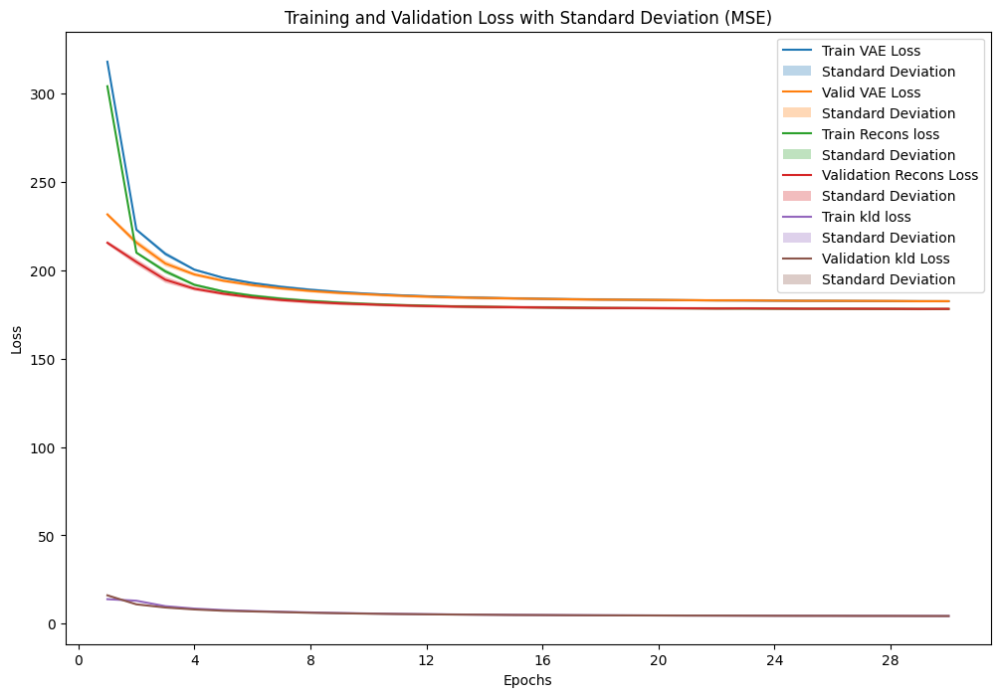

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_1_2 = VAE_plot_results(fold_results_4_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_1_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_1_2['epochs'])
VAE_plot_mean_std(result_data_4_1_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_1_2['epochs'])
VAE_plot_mean_std(result_data_4_1_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_1_2['epochs'])
VAE_plot_mean_std(result_data_4_1_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_1_2['epochs'])
VAE_plot_mean_std(result_data_4_1_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_1_2['epochs'])
VAE_plot_mean_std(result_data_4_1_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_1_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_1_2['valid_metrics'],
    result_data_4_1_2['test_metrics'],
    result_data_4_1_2['valid_result'],
    result_data_4_1_2['test_result'],
    result_data_4_1_2['recons_valid_result'],
    result_data_4_1_2['recons_test_result'],
    result_data_4_1_2['kld_valid_result'],
    result_data_4_1_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.056016           0.055796           182.594750     181.791730              178.249691        178.249691             4.345059       4.358527
Standard Deviation                 0.000293           0.000075             0.714339       0.133237                0.701639          0.701639             0.083829       0.087897

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.055830,0.055814,182.330836,181.882322
1,2,0.055971,0.055802,182.422063,181.745958
2,3,0.056346,0.055768,183.481004,181.730082
3,4,0.055871,0.055745,182.283552,181.737817
4,5,0.056011,0.055852,182.612190,181.964550
5,6,0.056220,0.055730,183.414497,181.742062
6,7,0.055966,0.055745,182.387462,181.705727
7,8,0.056628,0.055985,183.796133,182.039162
8,9,0.055738,0.055807,181.716030,181.820265
9,10,0.055575,0.055717,181.503733,181.549355


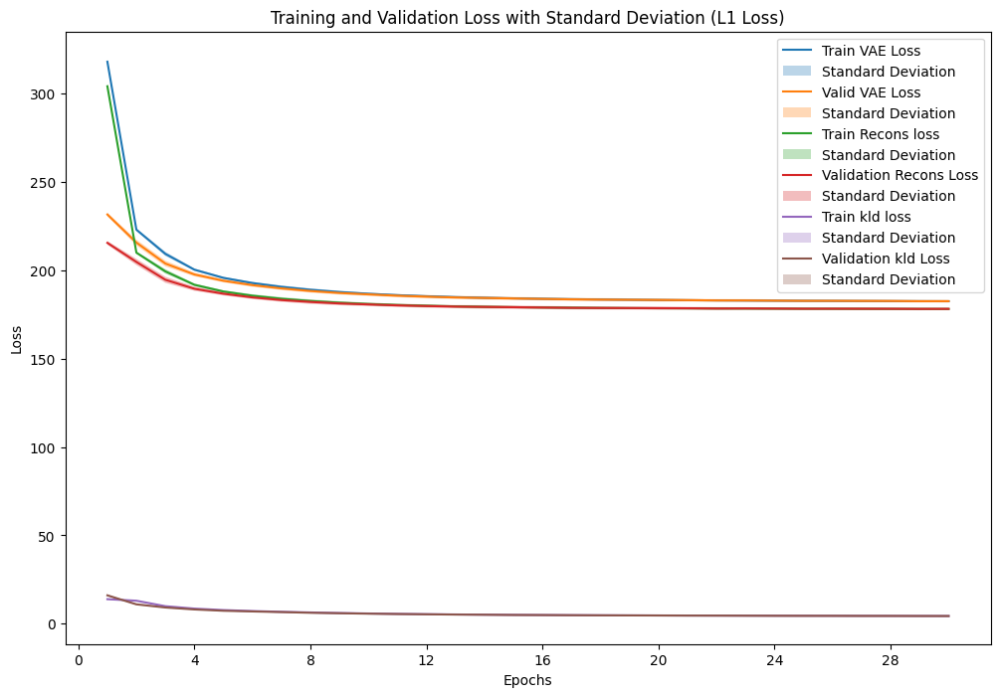

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_1_3 = VAE_plot_results(fold_results_4_1, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_1_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_1_3['epochs'])
VAE_plot_mean_std(result_data_4_1_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_1_3['epochs'])
VAE_plot_mean_std(result_data_4_1_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_1_3['epochs'])
VAE_plot_mean_std(result_data_4_1_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_1_3['epochs'])
VAE_plot_mean_std(result_data_4_1_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_1_3['epochs'])
VAE_plot_mean_std(result_data_4_1_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_1_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_1_3['valid_metrics'],
    result_data_4_1_3['test_metrics'],
    result_data_4_1_3['valid_result'],
    result_data_4_1_3['test_result'],
    result_data_4_1_3['recons_valid_result'],
    result_data_4_1_3['recons_test_result'],
    result_data_4_1_3['kld_valid_result'],
    result_data_4_1_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.126685           0.126513           182.584998     181.785589              178.239939        178.239939             4.345059       4.358527
Standard Deviation                 0.000595           0.000467             0.724260       0.133896                0.710282          0.710282             0.083829       0.087897

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.127340,0.127429,182.303857,181.854686
1,2,0.126915,0.126886,182.422545,181.758832
2,3,0.126870,0.126106,183.506172,181.723954
3,4,0.126704,0.126719,182.249595,181.733748
4,5,0.125724,0.125584,182.663792,181.971121
5,6,0.127275,0.126657,183.385362,181.757294
6,7,0.126620,0.126541,182.355286,181.704914
7,8,0.127480,0.126606,183.792952,181.996755
8,9,0.125770,0.126221,181.688100,181.846890
9,10,0.126154,0.126376,181.482323,181.507696


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_1 = sum(p.numel() for p in models_4_1[0].parameters())
print(f"Number of parameters in the model: {total_params_4_1}")

Number of parameters in the model: 5492


<ipython-input-18-14e9441719e3>:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


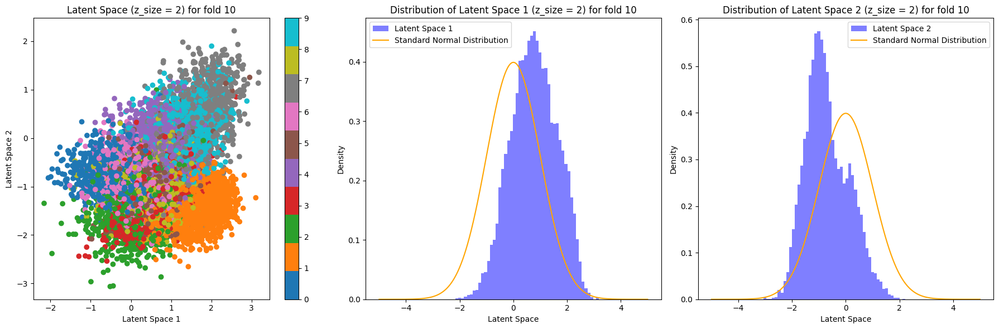

In [ ]:
latent_space_VAE_model(models_4_1[9], test_loader, device, number_fold=10)

### Experiment 3.2 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=8, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_2 = 'VAE'
model_config_4_2 = {'D_x': 784, 'n_layers': 1, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_2, fold_results_4_2 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_2),
                                                model_config=model_config_4_2,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:256.143153, Training Recons Loss: 232.540352, Training KLD Loss: 23.602802
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.04810290763828349, 'L1 Loss': 0.1256962780781249, 'BCE': 0.21632007493617686}, Validation VAE Loss: {'MSE': 191.58282795358213, 'L1 Loss': 191.43766995693775, 'BCE': 191.41114547404837}, Validation Recons Loss: {'MSE': 169.76662055482257, 'L1 Loss': 169.6214633698159, 'BCE': 169.59493856227144}, Validation KLD Loss: {'MSE': 21.816207256722958, 'L1 Loss': 21.816207256722958, 'BCE': 21.816207256722958}
Train Fold/Epoch: 1/2, Training Loss:176.575823, Training Recons Loss: 156.000428, Training KLD Loss: 20.575395
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.040437513843495795, 'L1 Loss': 0.10459370078875664, 'BCE': 0.18913694597939226}, Validation VAE Loss: {'MSE

## Visualizing reconstructions for all fold

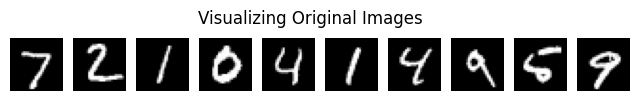

Visualizing reconstructions for fold 1


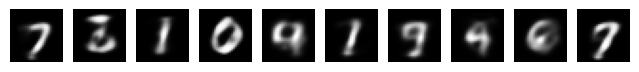

Visualizing reconstructions for fold 2


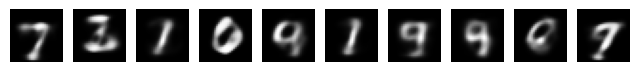

Visualizing reconstructions for fold 3


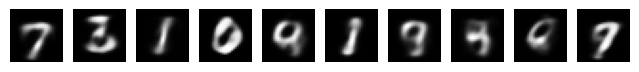

Visualizing reconstructions for fold 4


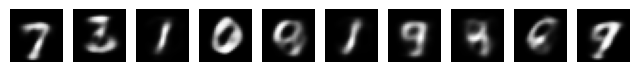

Visualizing reconstructions for fold 5


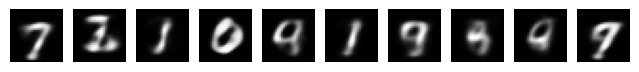

Visualizing reconstructions for fold 6


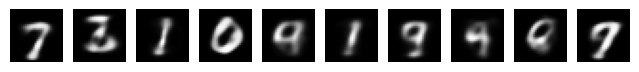

Visualizing reconstructions for fold 7


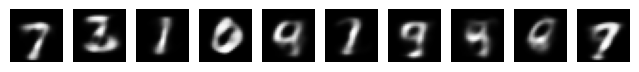

Visualizing reconstructions for fold 8


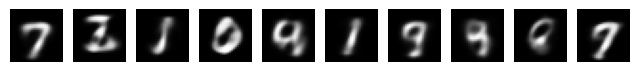

Visualizing reconstructions for fold 9


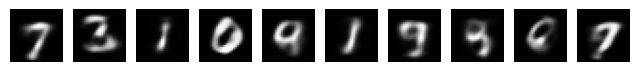

Visualizing reconstructions for fold 10


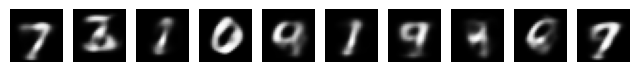

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_2):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

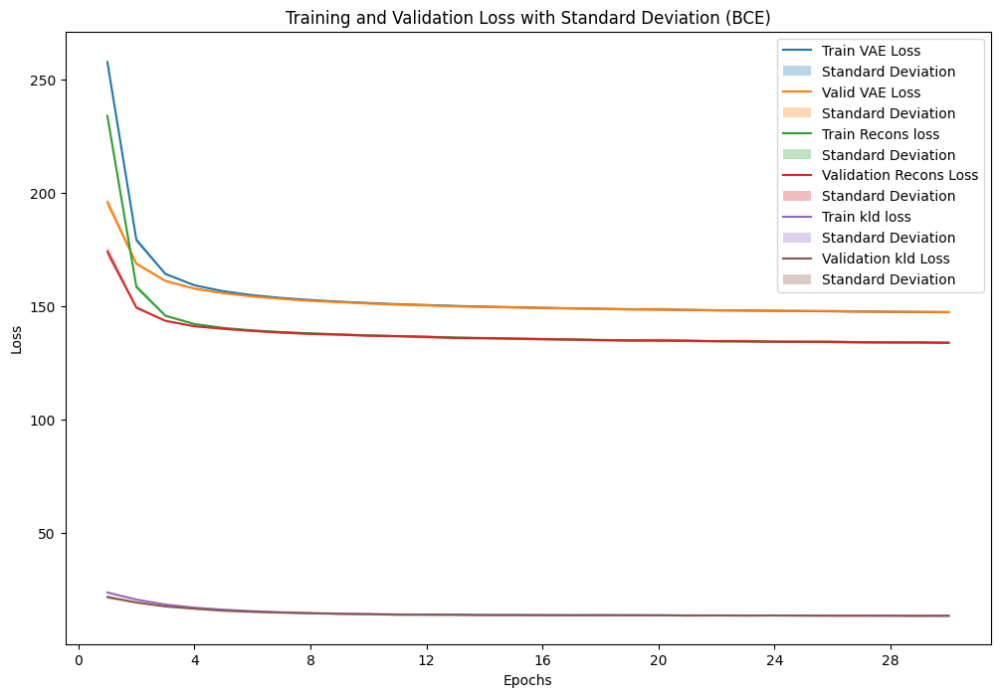

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_2_1 = VAE_plot_results(fold_results_4_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_2_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_2_1['epochs'])
VAE_plot_mean_std(result_data_4_2_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_2_1['epochs'])
VAE_plot_mean_std(result_data_4_2_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_2_1['epochs'])
VAE_plot_mean_std(result_data_4_2_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_2_1['epochs'])
VAE_plot_mean_std(result_data_4_2_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_2_1['epochs'])
VAE_plot_mean_std(result_data_4_2_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_2_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_2_1['valid_metrics'],
    result_data_4_2_1['test_metrics'],
    result_data_4_2_1['valid_result'],
    result_data_4_2_1['test_result'],
    result_data_4_2_1['recons_valid_result'],
    result_data_4_2_1['recons_test_result'],
    result_data_4_2_1['kld_valid_result'],
    result_data_4_2_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.170698           0.169026           147.337325     146.114427              133.827454        133.827454            13.509870      13.598145
Standard Deviation                 0.000714           0.000223             0.554220       0.144082                0.560043          0.560043             0.135604       0.122303

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.170813,0.168968,147.413173,146.111212
1,2,0.170095,0.168936,147.146381,146.308662
2,3,0.171418,0.169079,147.822435,146.058146
3,4,0.170120,0.168780,146.957590,145.997357
4,5,0.171426,0.169519,147.764848,146.403864
5,6,0.171059,0.168781,147.669098,145.942657
6,7,0.171063,0.169345,147.429006,146.181163
7,8,0.171634,0.168937,148.207768,146.128039
8,9,0.169922,0.168982,146.732434,146.083422
9,10,0.169432,0.168929,146.230514,145.929750


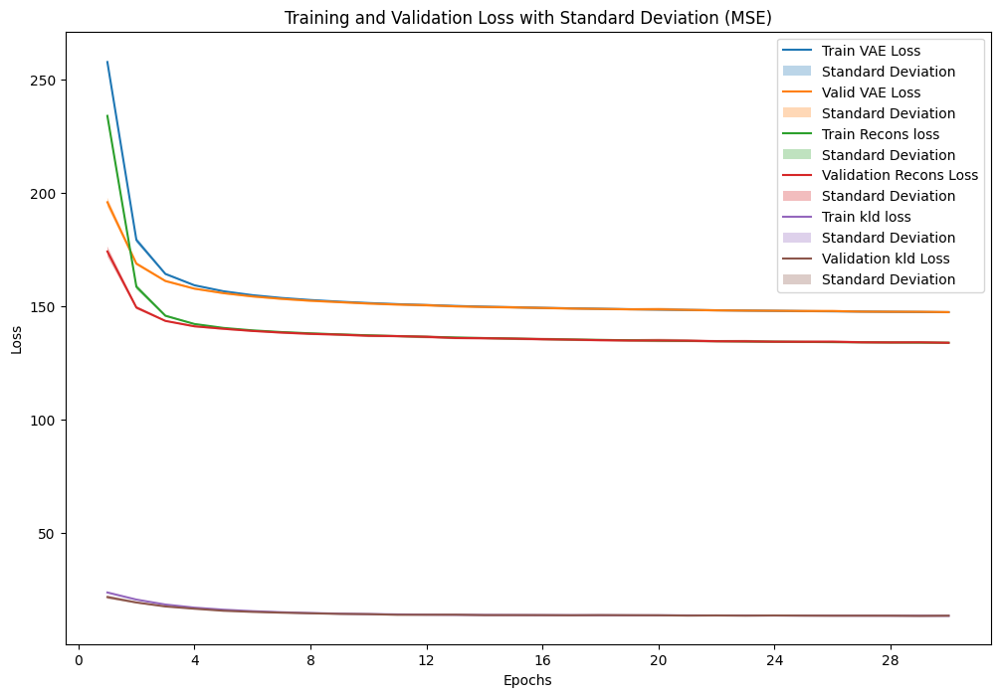

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_2_2 = VAE_plot_results(fold_results_4_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_2_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_2_2['epochs'])
VAE_plot_mean_std(result_data_4_2_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_2_2['epochs'])
VAE_plot_mean_std(result_data_4_2_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_2_2['epochs'])
VAE_plot_mean_std(result_data_4_2_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_2_2['epochs'])
VAE_plot_mean_std(result_data_4_2_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_2_2['epochs'])
VAE_plot_mean_std(result_data_4_2_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_2_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_2_2['valid_metrics'],
    result_data_4_2_2['test_metrics'],
    result_data_4_2_2['valid_result'],
    result_data_4_2_2['test_result'],
    result_data_4_2_2['recons_valid_result'],
    result_data_4_2_2['recons_test_result'],
    result_data_4_2_2['kld_valid_result'],
    result_data_4_2_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.035897           0.035394           147.324968     146.121784              133.815097        133.815097            13.509870      13.598145
Standard Deviation                 0.000197           0.000087             0.532779       0.141877                0.538747          0.538747             0.135604       0.122303

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.035936,0.035382,147.448298,146.106420
1,2,0.035770,0.035373,147.154245,146.297630
2,3,0.036124,0.035405,147.840890,146.054403
3,4,0.035701,0.035306,146.974461,146.006819
4,5,0.036189,0.035609,147.719942,146.403570
5,6,0.035870,0.035296,147.575277,145.916956
6,7,0.036012,0.035485,147.383224,146.207658
7,8,0.036070,0.035347,148.168270,146.133868
8,9,0.035763,0.035385,146.699957,146.122022
9,10,0.035529,0.035356,146.285112,145.968498


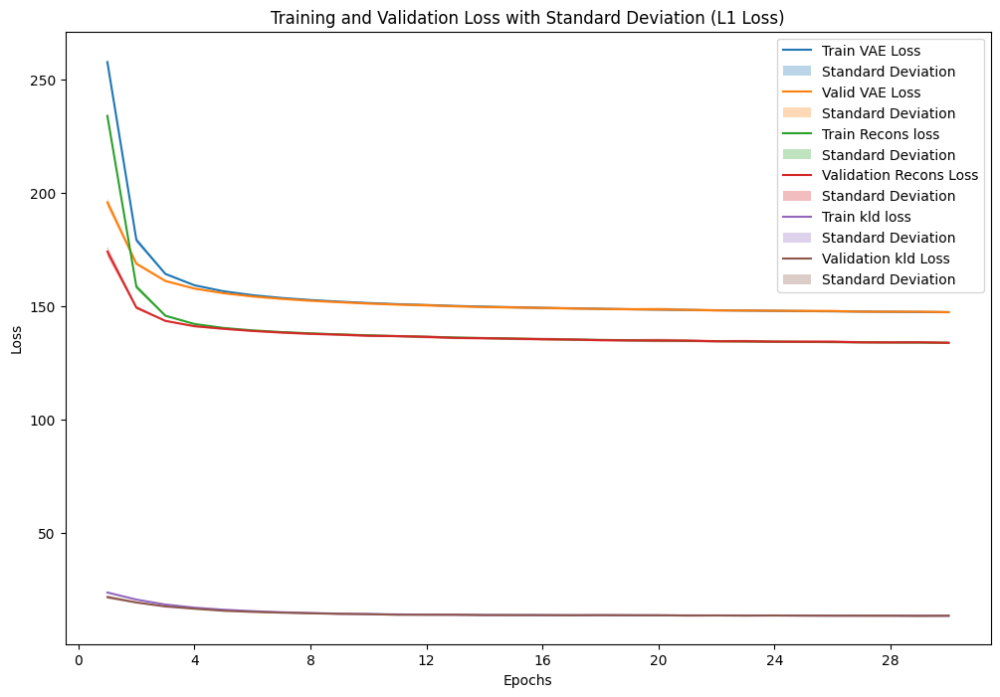

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_2_3 = VAE_plot_results(fold_results_4_2, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_2_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_2_3['epochs'])
VAE_plot_mean_std(result_data_4_2_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_2_3['epochs'])
VAE_plot_mean_std(result_data_4_2_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_2_3['epochs'])
VAE_plot_mean_std(result_data_4_2_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_2_3['epochs'])
VAE_plot_mean_std(result_data_4_2_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_2_3['epochs'])
VAE_plot_mean_std(result_data_4_2_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_2_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_2_3['valid_metrics'],
    result_data_4_2_3['test_metrics'],
    result_data_4_2_3['valid_result'],
    result_data_4_2_3['test_result'],
    result_data_4_2_3['recons_valid_result'],
    result_data_4_2_3['recons_test_result'],
    result_data_4_2_3['kld_valid_result'],
    result_data_4_2_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.087265           0.086442           147.320841     146.138103              133.810971        133.810971            13.509870      13.598145
Standard Deviation                 0.000490           0.000412             0.544659       0.154838                0.556679          0.556679             0.135604       0.122303

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.087543,0.086686,147.454038,146.089595
1,2,0.086300,0.085756,147.109376,146.295598
2,3,0.087585,0.086453,147.844464,146.128320
3,4,0.087088,0.086444,147.010354,146.107159
4,5,0.088157,0.087185,147.749787,146.457991
5,6,0.086919,0.085987,147.551413,146.005290
6,7,0.087744,0.086670,147.470784,146.205473
7,8,0.087184,0.085927,148.132912,146.126246
8,9,0.087169,0.086691,146.632272,146.121569
9,10,0.086957,0.086618,146.253008,145.843794


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_2 = sum(p.numel() for p in models_4_2[0].parameters())
print(f"Number of parameters in the model: {total_params_4_2}")

Number of parameters in the model: 19616


### Experiment 3.3 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=16, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_3 = 'VAE'
model_config_4_3 = {'D_x': 784, 'n_layers': 1, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_3, fold_results_4_3 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_3),
                                                model_config=model_config_4_3,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:232.743031, Training Recons Loss: 203.851211, Training KLD Loss: 28.891820
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.038872221920718535, 'L1 Loss': 0.10647074291680722, 'BCE': 0.18904491482262917}, Validation VAE Loss: {'MSE': 175.7045323797997, 'L1 Loss': 175.6901086036195, 'BCE': 175.6902253171231}, Validation Recons Loss: {'MSE': 148.22552003251747, 'L1 Loss': 148.2110959316822, 'BCE': 148.21121296984083}, Validation KLD Loss: {'MSE': 27.479012042918104, 'L1 Loss': 27.479012042918104, 'BCE': 27.479012042918104}
Train Fold/Epoch: 1/2, Training Loss:161.341520, Training Recons Loss: 134.296569, Training KLD Loss: 27.044951
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.03025913609072883, 'L1 Loss': 0.08439450940870225, 'BCE': 0.1597679186057537}, Validation VAE Loss: {'MSE': 

## Visualizing reconstructions for all fold

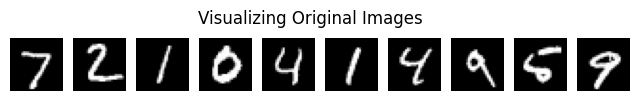

Visualizing reconstructions for fold 1


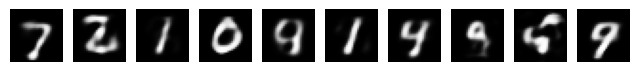

Visualizing reconstructions for fold 2


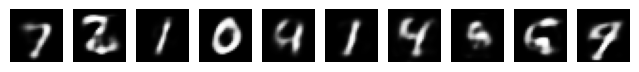

Visualizing reconstructions for fold 3


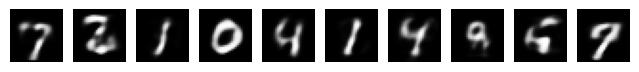

Visualizing reconstructions for fold 4


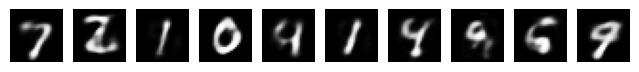

Visualizing reconstructions for fold 5


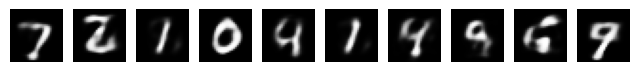

Visualizing reconstructions for fold 6


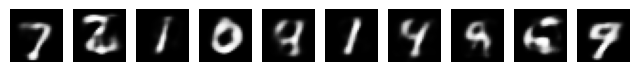

Visualizing reconstructions for fold 7


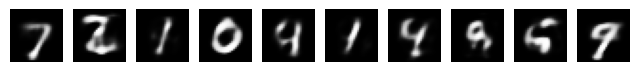

Visualizing reconstructions for fold 8


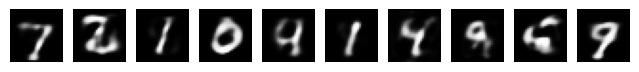

Visualizing reconstructions for fold 9


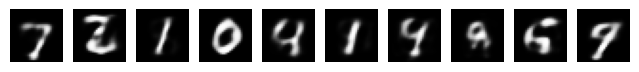

Visualizing reconstructions for fold 10


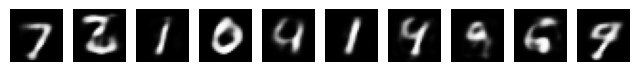

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_3):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

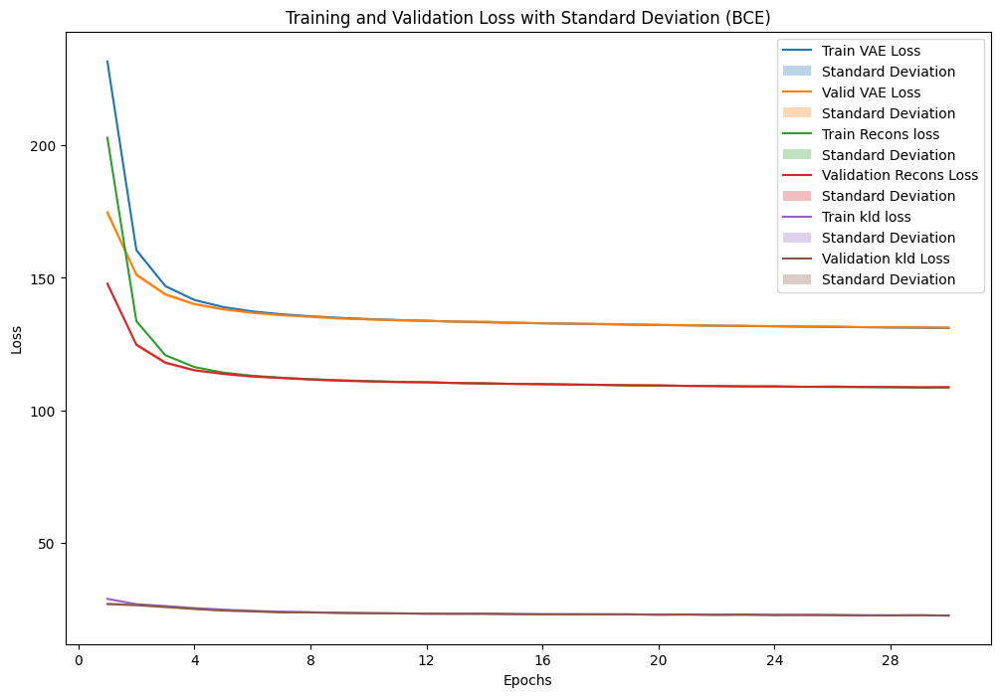

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_3_1 = VAE_plot_results(fold_results_4_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_3_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_3_1['epochs'])
VAE_plot_mean_std(result_data_4_3_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_3_1['epochs'])
VAE_plot_mean_std(result_data_4_3_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_3_1['epochs'])
VAE_plot_mean_std(result_data_4_3_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_3_1['epochs'])
VAE_plot_mean_std(result_data_4_3_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_3_1['epochs'])
VAE_plot_mean_std(result_data_4_3_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_3_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_3_1['valid_metrics'],
    result_data_4_3_1['test_metrics'],
    result_data_4_3_1['valid_result'],
    result_data_4_3_1['test_result'],
    result_data_4_3_1['recons_valid_result'],
    result_data_4_3_1['recons_test_result'],
    result_data_4_3_1['kld_valid_result'],
    result_data_4_3_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.138710           0.136802           131.201069     129.801084              108.748591        108.748591            22.452478      22.548306
Standard Deviation                 0.000452           0.000307             0.369869       0.159775                0.354507          0.354507             0.189183       0.190448

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.139331,0.137012,131.651461,129.985447
1,2,0.138862,0.137131,131.144930,129.894522
2,3,0.139034,0.137117,131.632563,130.161736
3,4,0.138075,0.136293,130.866670,129.572694
4,5,0.138880,0.136648,131.330976,129.757666
5,6,0.138421,0.136479,131.203187,129.730676
6,7,0.138433,0.136416,131.220148,129.747767
7,8,0.139469,0.137054,131.671671,129.707239
8,9,0.138399,0.137097,130.590408,129.707512
9,10,0.138195,0.136773,130.698678,129.745582


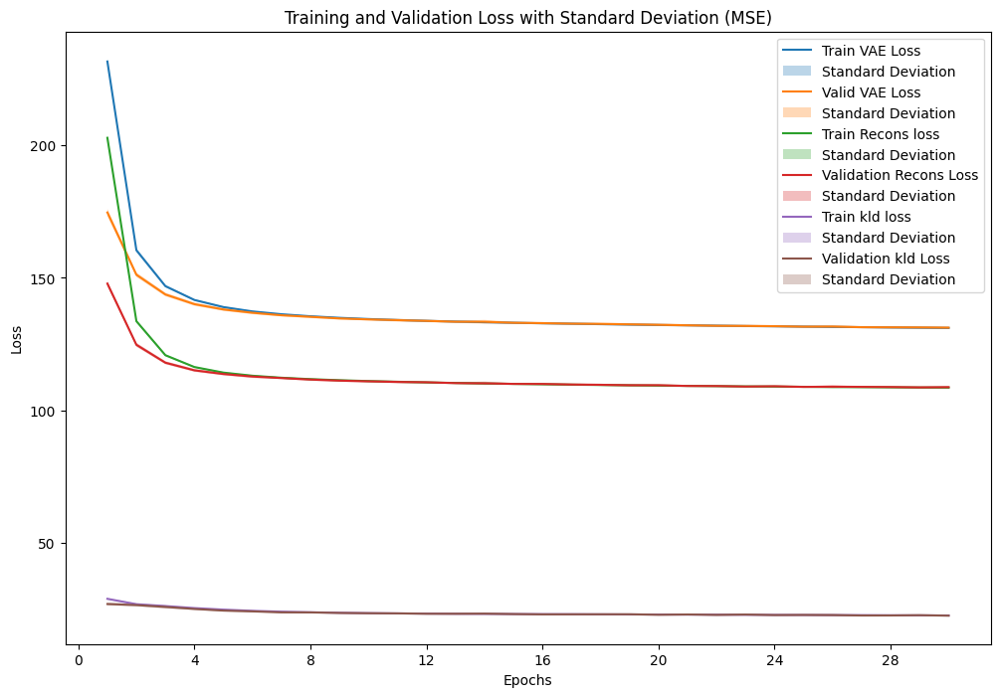

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_3_2 = VAE_plot_results(fold_results_4_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_3_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_3_2['epochs'])
VAE_plot_mean_std(result_data_4_3_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_3_2['epochs'])
VAE_plot_mean_std(result_data_4_3_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_3_2['epochs'])
VAE_plot_mean_std(result_data_4_3_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_3_2['epochs'])
VAE_plot_mean_std(result_data_4_3_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_3_2['epochs'])
VAE_plot_mean_std(result_data_4_3_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_3_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_3_2['valid_metrics'],
    result_data_4_3_2['test_metrics'],
    result_data_4_3_2['valid_result'],
    result_data_4_3_2['test_result'],
    result_data_4_3_2['recons_valid_result'],
    result_data_4_3_2['recons_test_result'],
    result_data_4_3_2['kld_valid_result'],
    result_data_4_3_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.024864           0.024307           131.207032     129.816834              108.754554        108.754554            22.452478      22.548306
Standard Deviation                 0.000165           0.000110             0.387509       0.150887                0.376972          0.376972             0.189183       0.190448

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.024995,0.024385,131.554075,129.977765
1,2,0.024950,0.024431,131.206436,129.996228
2,3,0.025113,0.024442,131.801705,130.120257
3,4,0.024565,0.024106,130.802747,129.627054
4,5,0.025000,0.024278,131.376991,129.712612
5,6,0.024689,0.024190,131.285502,129.781898
6,7,0.024763,0.024184,131.122038,129.756040
7,8,0.024970,0.024384,131.633476,129.739789
8,9,0.024896,0.024376,130.694919,129.682902
9,10,0.024703,0.024299,130.592433,129.773793


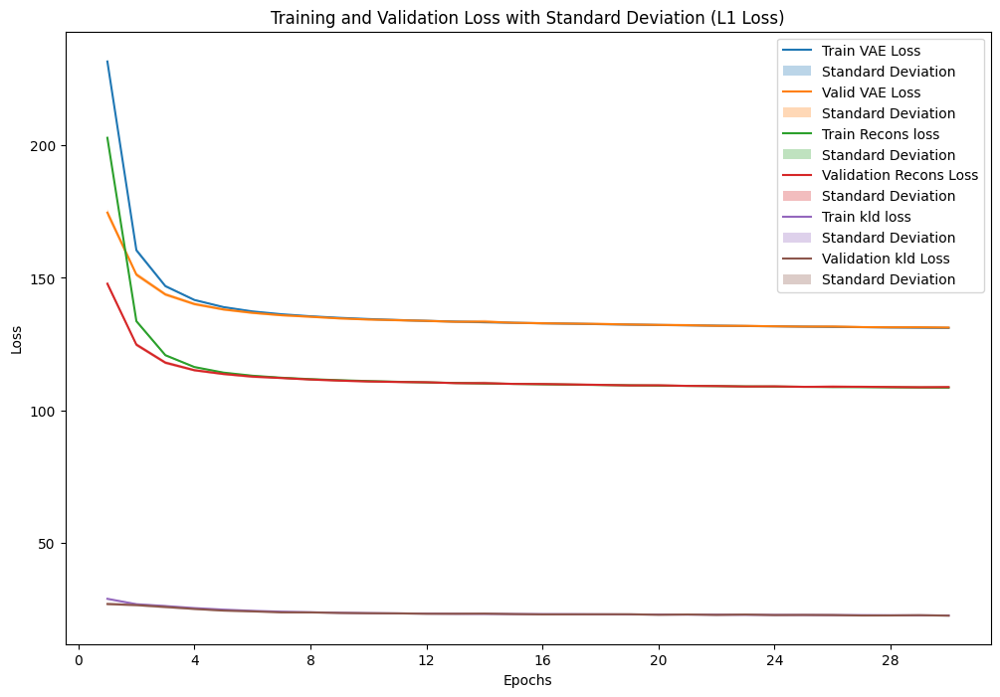

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_3_3 = VAE_plot_results(fold_results_4_3, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_3_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_3_3['epochs'])
VAE_plot_mean_std(result_data_4_3_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_3_3['epochs'])
VAE_plot_mean_std(result_data_4_3_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_3_3['epochs'])
VAE_plot_mean_std(result_data_4_3_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_3_3['epochs'])
VAE_plot_mean_std(result_data_4_3_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_3_3['epochs'])
VAE_plot_mean_std(result_data_4_3_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_3_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_3_3['valid_metrics'],
    result_data_4_3_3['test_metrics'],
    result_data_4_3_3['valid_result'],
    result_data_4_3_3['test_result'],
    result_data_4_3_3['recons_valid_result'],
    result_data_4_3_3['recons_test_result'],
    result_data_4_3_3['kld_valid_result'],
    result_data_4_3_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.065275           0.064282           131.203108     129.774714              108.750631        108.750631            22.452478      22.548306
Standard Deviation                 0.000370           0.000406             0.388554       0.152930                0.369549          0.369549             0.189183       0.190448

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.064574,0.063573,131.506300,129.905713
1,2,0.065622,0.064641,131.236221,129.870976
2,3,0.065270,0.064081,131.791037,130.084050
3,4,0.065076,0.064128,130.889866,129.545799
4,5,0.065456,0.064184,131.263717,129.601724
5,6,0.065132,0.064185,131.279365,129.785343
6,7,0.064810,0.063768,131.154843,129.667932
7,8,0.065879,0.064755,131.698627,129.697502
8,9,0.065529,0.064686,130.632384,129.719197
9,10,0.065400,0.064816,130.578723,129.868906


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_3 = sum(p.numel() for p in models_4_3[0].parameters())
print(f"Number of parameters in the model: {total_params_4_3}")

Number of parameters in the model: 38448


### Experiment 3.4 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_4 = 'VAE'
model_config_4_4 = {'D_x': 784, 'n_layers': 1, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_4, fold_results_4_4 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_4),
                                                model_config=model_config_4_4,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:213.283822, Training Recons Loss: 181.014974, Training KLD Loss: 32.268848
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.0321070994547707, 'L1 Loss': 0.08981473965847746, 'BCE': 0.16702136619293945}, Validation VAE Loss: {'MSE': 162.92120994405545, 'L1 Loss': 162.9374451332904, 'BCE': 163.0071226079413}, Validation Recons Loss: {'MSE': 130.8588381016508, 'L1 Loss': 130.87507337204954, 'BCE': 130.94475117135556}, Validation KLD Loss: {'MSE': 32.06237176124086, 'L1 Loss': 32.06237176124086, 'BCE': 32.06237176124086}
Train Fold/Epoch: 1/2, Training Loss:149.973682, Training Recons Loss: 116.979224, Training KLD Loss: 32.994458
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.022683552941901886, 'L1 Loss': 0.06909774291388532, 'BCE': 0.1372853140247629}, Validation VAE Loss: {'MSE': 141

## Visualizing reconstructions for all fold

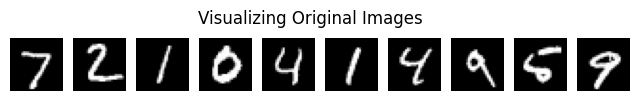

Visualizing reconstructions for fold 1


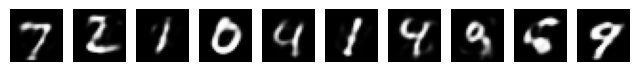

Visualizing reconstructions for fold 2


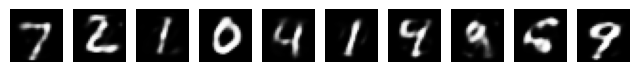

Visualizing reconstructions for fold 3


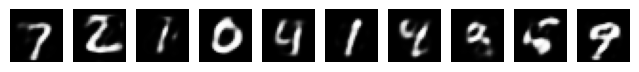

Visualizing reconstructions for fold 4


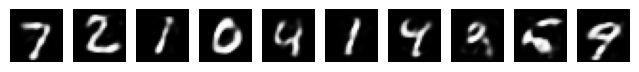

Visualizing reconstructions for fold 5


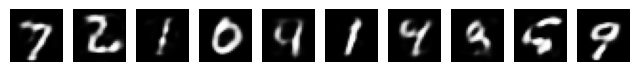

Visualizing reconstructions for fold 6


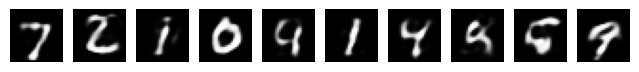

Visualizing reconstructions for fold 7


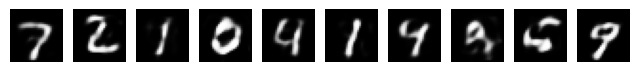

Visualizing reconstructions for fold 8


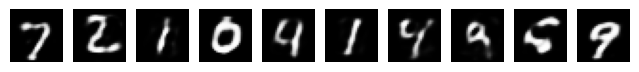

Visualizing reconstructions for fold 9


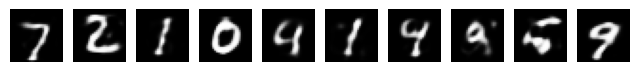

Visualizing reconstructions for fold 10


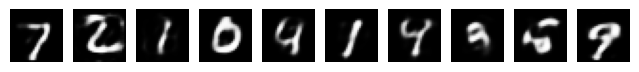

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_4):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

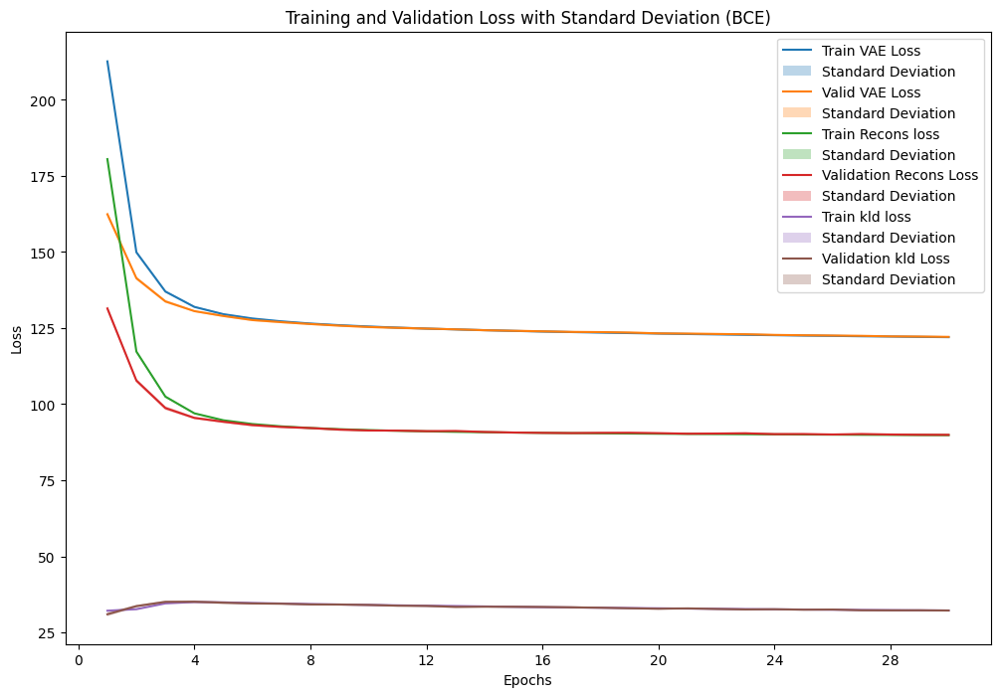

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_4_1 = VAE_plot_results(fold_results_4_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_4_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_4_1['epochs'])
VAE_plot_mean_std(result_data_4_4_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_4_1['epochs'])
VAE_plot_mean_std(result_data_4_4_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_4_1['epochs'])
VAE_plot_mean_std(result_data_4_4_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_4_1['epochs'])
VAE_plot_mean_std(result_data_4_4_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_4_1['epochs'])
VAE_plot_mean_std(result_data_4_4_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_4_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_4_1['valid_metrics'],
    result_data_4_4_1['test_metrics'],
    result_data_4_4_1['valid_result'],
    result_data_4_4_1['test_result'],
    result_data_4_4_1['recons_valid_result'],
    result_data_4_4_1['recons_test_result'],
    result_data_4_4_1['kld_valid_result'],
    result_data_4_4_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.114663           0.112963           122.088594     120.787016               89.896145         89.896145            32.192449      32.224284
Standard Deviation                 0.000411           0.000302             0.259034       0.115624                0.322586          0.322586             0.226115       0.232088

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.115196,0.113117,122.312452,120.812262
1,2,0.114672,0.113067,121.920986,120.699420
2,3,0.114401,0.112595,122.198966,120.741274
3,4,0.114486,0.113025,122.164212,121.025728
4,5,0.114825,0.113114,122.123021,120.843345
5,6,0.114561,0.112555,122.242155,120.681511
6,7,0.114986,0.113415,122.136541,120.911055
7,8,0.115347,0.113349,122.441564,120.702503
8,9,0.113977,0.112532,121.870298,120.831778
9,10,0.114184,0.112859,121.475750,120.621287


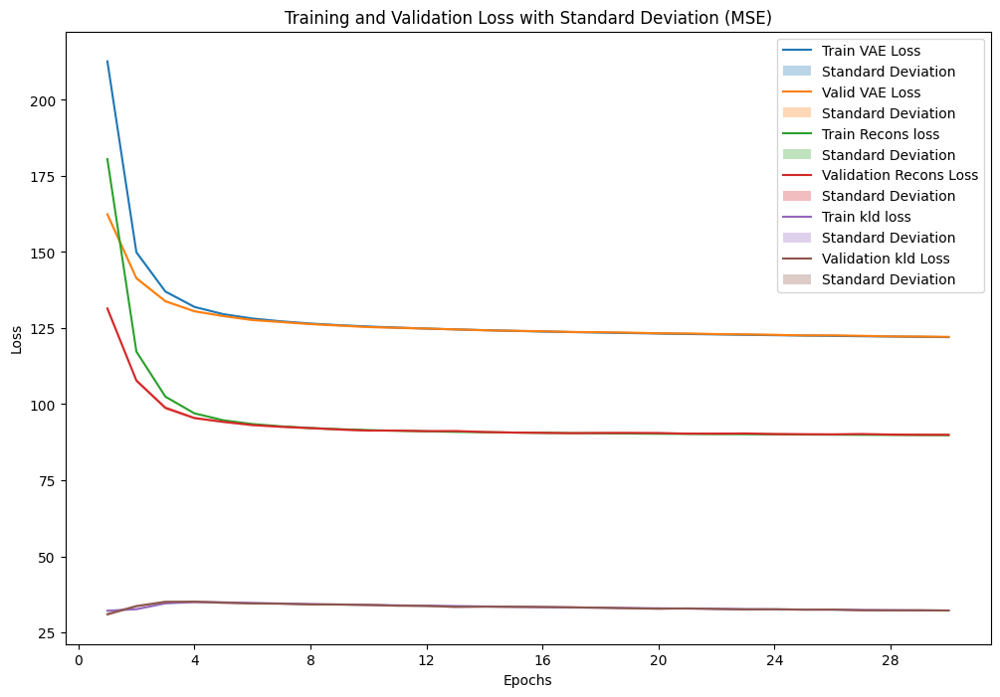

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_4_2 = VAE_plot_results(fold_results_4_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_4_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_4_2['epochs'])
VAE_plot_mean_std(result_data_4_4_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_4_2['epochs'])
VAE_plot_mean_std(result_data_4_4_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_4_2['epochs'])
VAE_plot_mean_std(result_data_4_4_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_4_2['epochs'])
VAE_plot_mean_std(result_data_4_4_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_4_2['epochs'])
VAE_plot_mean_std(result_data_4_4_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_4_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_4_2['valid_metrics'],
    result_data_4_4_2['test_metrics'],
    result_data_4_4_2['valid_result'],
    result_data_4_4_2['test_result'],
    result_data_4_4_2['recons_valid_result'],
    result_data_4_4_2['recons_test_result'],
    result_data_4_4_2['kld_valid_result'],
    result_data_4_4_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.016897           0.016415           122.089004     120.764635               89.896555         89.896555            32.192449      32.224284
Standard Deviation                 0.000100           0.000101             0.235876       0.086278                0.303464          0.303464             0.226115       0.232088

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.016963,0.016422,122.207609,120.752367
1,2,0.016988,0.016460,122.076157,120.762102
2,3,0.016856,0.016322,122.341459,120.776301
3,4,0.016799,0.016345,122.142644,120.901021
4,5,0.017023,0.016432,122.307103,120.768756
5,6,0.016736,0.016306,122.176095,120.678131
6,7,0.017034,0.016619,122.033633,120.931041
7,8,0.016918,0.016513,122.275042,120.681291
8,9,0.016773,0.016269,121.773315,120.744777
9,10,0.016877,0.016460,121.556983,120.650562


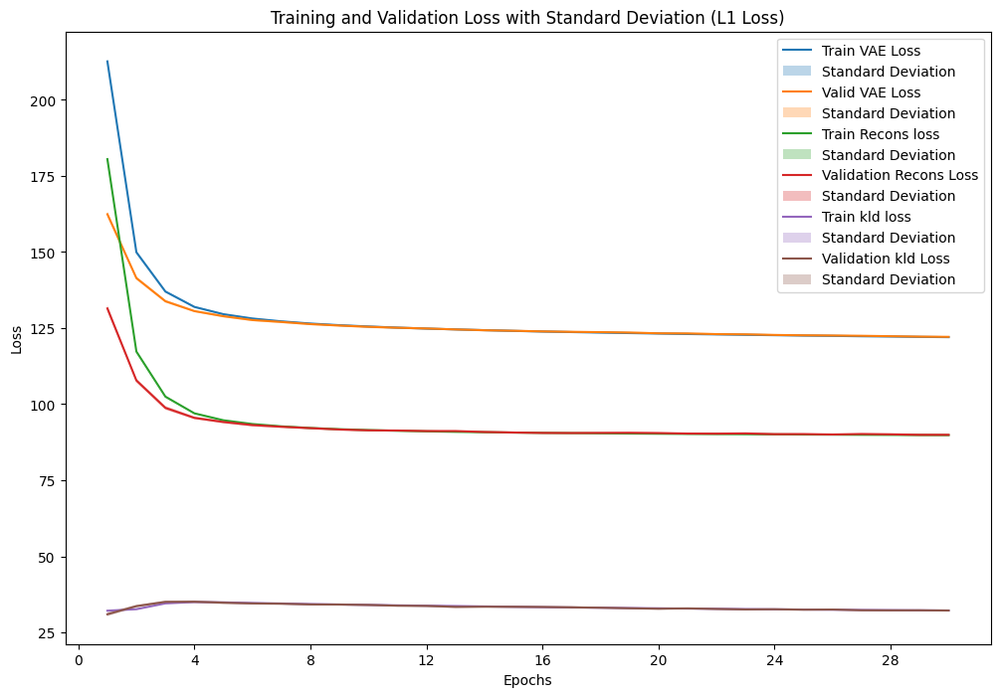

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_4_3 = VAE_plot_results(fold_results_4_4, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_4_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_4_3['epochs'])
VAE_plot_mean_std(result_data_4_4_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_4_3['epochs'])
VAE_plot_mean_std(result_data_4_4_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_4_3['epochs'])
VAE_plot_mean_std(result_data_4_4_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_4_3['epochs'])
VAE_plot_mean_std(result_data_4_4_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_4_3['epochs'])
VAE_plot_mean_std(result_data_4_4_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_4_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_4_3['valid_metrics'],
    result_data_4_4_3['test_metrics'],
    result_data_4_4_3['valid_result'],
    result_data_4_4_3['test_result'],
    result_data_4_4_3['recons_valid_result'],
    result_data_4_4_3['recons_test_result'],
    result_data_4_4_3['kld_valid_result'],
    result_data_4_4_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.049057           0.048171           122.149144     120.791673               89.956695         89.956695            32.192449      32.224284
Standard Deviation                 0.000341           0.000267             0.251583       0.127466                0.338469          0.338469             0.226115       0.232088

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.049287,0.048276,122.310005,120.818978
1,2,0.049385,0.048407,122.129606,120.660243
2,3,0.048782,0.047893,122.343396,120.862229
3,4,0.049167,0.048405,122.186433,121.045520
4,5,0.049346,0.048299,122.207216,120.795462
5,6,0.049010,0.048111,122.182187,120.597139
6,7,0.049031,0.048227,122.167086,120.907387
7,8,0.049539,0.048559,122.540306,120.714080
8,9,0.048479,0.047671,121.832225,120.845833
9,10,0.048546,0.047865,121.592975,120.669857


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_4 = sum(p.numel() for p in models_4_4[0].parameters())
print(f"Number of parameters in the model: {total_params_4_4}")

Number of parameters in the model: 76112


### Experiment 3.5 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=64, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_5 = 'VAE'
model_config_4_5 = {'D_x': 784, 'n_layers': 1, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_5, fold_results_4_5 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_5),
                                                model_config=model_config_4_5,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:199.507234, Training Recons Loss: 166.168718, Training KLD Loss: 33.338516
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.029312555004466088, 'L1 Loss': 0.08278687028808797, 'BCE': 0.15728599070868593}, Validation VAE Loss: {'MSE': 156.58955026180186, 'L1 Loss': 156.7678087924389, 'BCE': 156.72278497574177}, Validation Recons Loss: {'MSE': 123.17898275497112, 'L1 Loss': 123.35724087978932, 'BCE': 123.31221673843709}, Validation KLD Loss: {'MSE': 33.4105681967228, 'L1 Loss': 33.4105681967228, 'BCE': 33.4105681967228}
Train Fold/Epoch: 1/2, Training Loss:147.601885, Training Recons Loss: 112.314508, Training KLD Loss: 35.287377
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.022180899482299673, 'L1 Loss': 0.06474902322317691, 'BCE': 0.13364120921555986}, Validation VAE Loss: {'MSE': 1

## Visualizing reconstructions for all fold

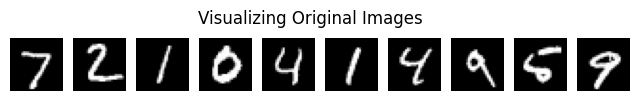

Visualizing reconstructions for fold 1


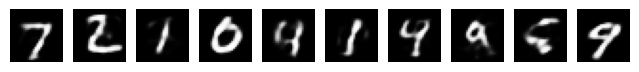

Visualizing reconstructions for fold 2


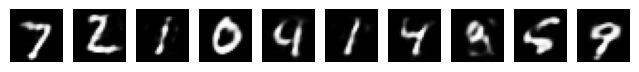

Visualizing reconstructions for fold 3


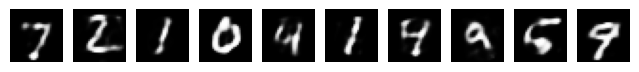

Visualizing reconstructions for fold 4


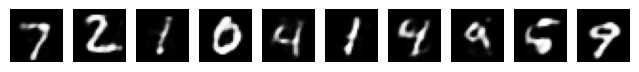

Visualizing reconstructions for fold 5


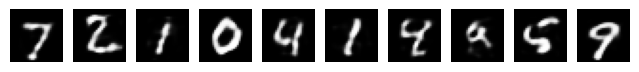

Visualizing reconstructions for fold 6


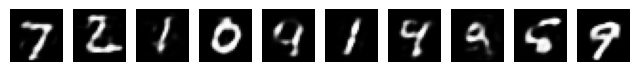

Visualizing reconstructions for fold 7


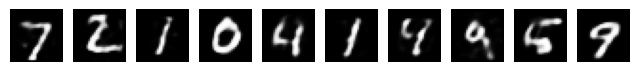

Visualizing reconstructions for fold 8


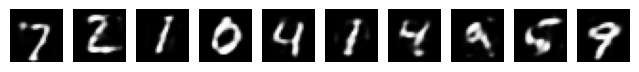

Visualizing reconstructions for fold 9


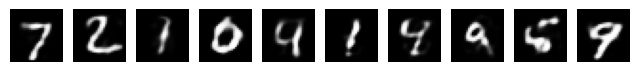

Visualizing reconstructions for fold 10


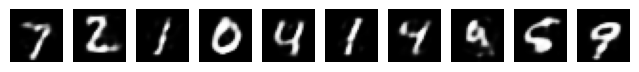

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_5):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

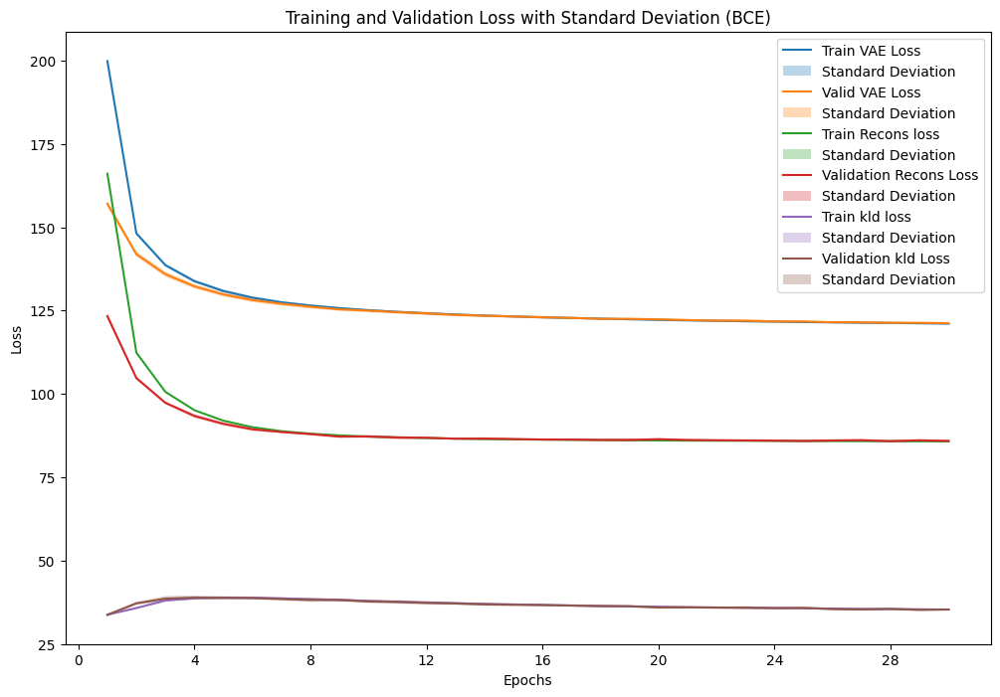

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_5_1 = VAE_plot_results(fold_results_4_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_5_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_5_1['epochs'])
VAE_plot_mean_std(result_data_4_5_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_5_1['epochs'])
VAE_plot_mean_std(result_data_4_5_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_5_1['epochs'])
VAE_plot_mean_std(result_data_4_5_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_5_1['epochs'])
VAE_plot_mean_std(result_data_4_5_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_5_1['epochs'])
VAE_plot_mean_std(result_data_4_5_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_5_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_5_1['valid_metrics'],
    result_data_4_5_1['test_metrics'],
    result_data_4_5_1['valid_result'],
    result_data_4_5_1['test_result'],
    result_data_4_5_1['recons_valid_result'],
    result_data_4_5_1['recons_test_result'],
    result_data_4_5_1['kld_valid_result'],
    result_data_4_5_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.109525           0.108042           121.189881     119.973720               85.867970         85.867970            35.321910      35.269001
Standard Deviation                 0.000464           0.000376             0.258746       0.116665                0.363953          0.363953             0.252221       0.278357

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.109459,0.107583,121.316706,119.899127
1,2,0.109470,0.108049,120.951620,119.791955
2,3,0.109585,0.108077,121.299452,119.939863
3,4,0.109729,0.108324,121.098594,119.956932
4,5,0.109075,0.107548,121.258804,120.045569
5,6,0.110322,0.108429,121.463974,119.876956
6,7,0.108887,0.107558,120.959623,119.861415
7,8,0.110276,0.108603,121.723181,120.150010
8,9,0.108986,0.107834,120.968850,120.076342
9,10,0.109467,0.108414,120.858003,120.139032


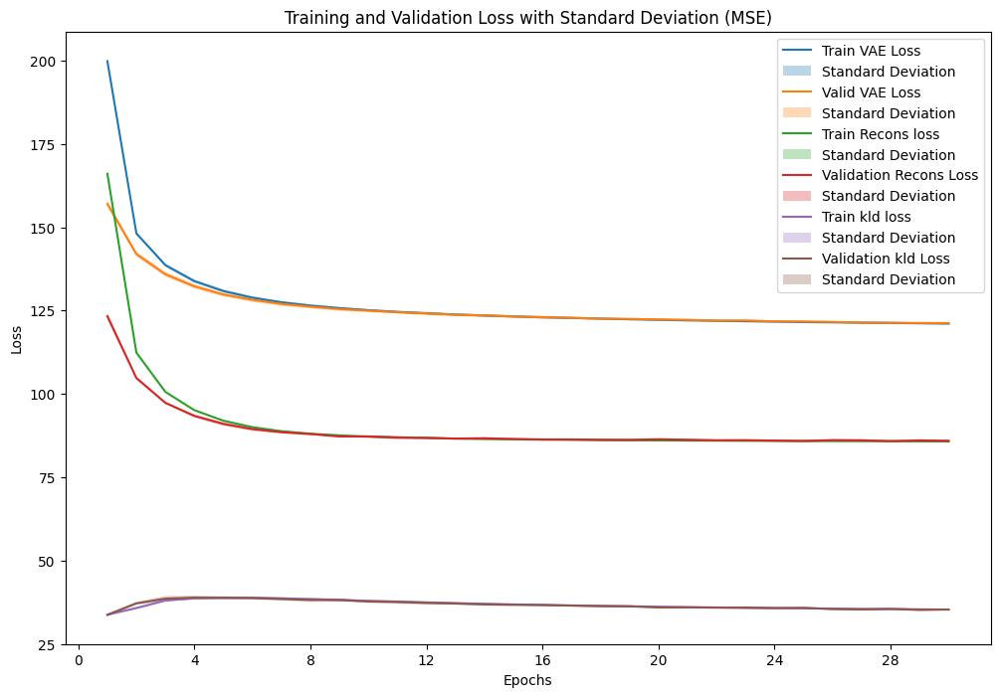

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_5_2 = VAE_plot_results(fold_results_4_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_5_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_5_2['epochs'])
VAE_plot_mean_std(result_data_4_5_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_5_2['epochs'])
VAE_plot_mean_std(result_data_4_5_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_5_2['epochs'])
VAE_plot_mean_std(result_data_4_5_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_5_2['epochs'])
VAE_plot_mean_std(result_data_4_5_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_5_2['epochs'])
VAE_plot_mean_std(result_data_4_5_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_5_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_5_2['valid_metrics'],
    result_data_4_5_2['test_metrics'],
    result_data_4_5_2['valid_result'],
    result_data_4_5_2['test_result'],
    result_data_4_5_2['recons_valid_result'],
    result_data_4_5_2['recons_test_result'],
    result_data_4_5_2['kld_valid_result'],
    result_data_4_5_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.015204            0.01478           121.263799     119.996540               85.941888         85.941888            35.321910      35.269001
Standard Deviation                 0.000124            0.00012             0.288763       0.079188                0.407134          0.407134             0.252221       0.278357

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.015047,0.014617,121.140967,119.940821
1,2,0.015267,0.014808,121.142968,119.906388
2,3,0.015249,0.014800,121.438831,119.981440
3,4,0.015258,0.014911,121.081578,120.023907
4,5,0.015116,0.014611,121.386103,120.012273
5,6,0.015363,0.014929,121.534633,119.910421
6,7,0.015014,0.014656,121.015868,119.915849
7,8,0.015407,0.014937,121.920803,120.134466
8,9,0.015100,0.014702,120.929461,120.012775
9,10,0.015216,0.014828,121.046775,120.127061


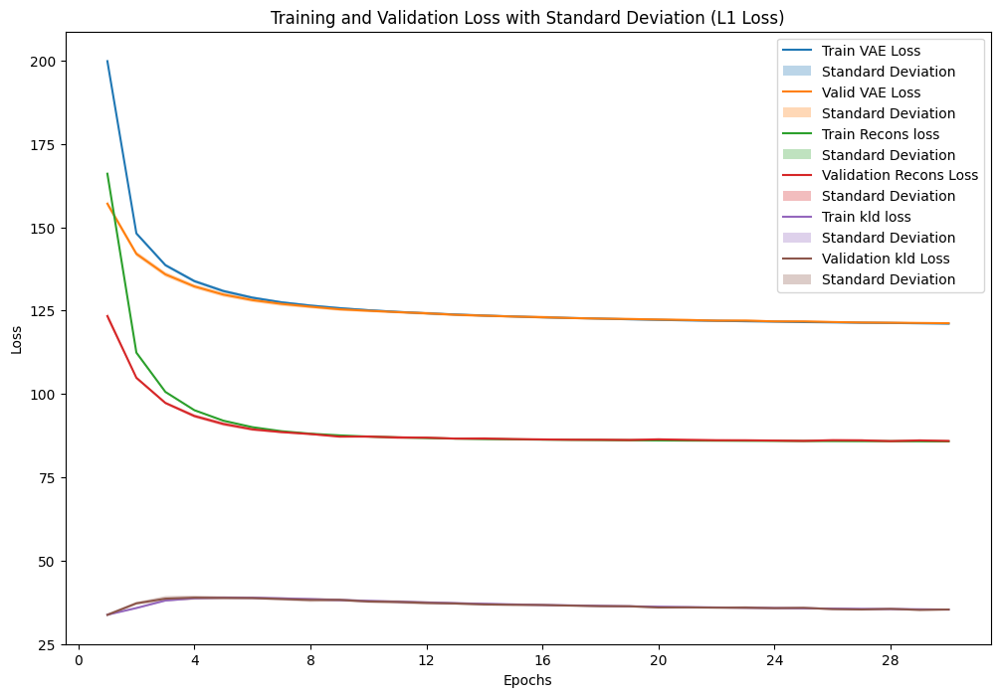

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_5_3 = VAE_plot_results(fold_results_4_5, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_5_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_5_3['epochs'])
VAE_plot_mean_std(result_data_4_5_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_5_3['epochs'])
VAE_plot_mean_std(result_data_4_5_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_5_3['epochs'])
VAE_plot_mean_std(result_data_4_5_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_5_3['epochs'])
VAE_plot_mean_std(result_data_4_5_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_5_3['epochs'])
VAE_plot_mean_std(result_data_4_5_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_5_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_5_3['valid_metrics'],
    result_data_4_5_3['test_metrics'],
    result_data_4_5_3['valid_result'],
    result_data_4_5_3['test_result'],
    result_data_4_5_3['recons_valid_result'],
    result_data_4_5_3['recons_test_result'],
    result_data_4_5_3['kld_valid_result'],
    result_data_4_5_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.045450           0.044682           121.248834     119.993384               85.926923         85.926923            35.321910      35.269001
Standard Deviation                 0.000257           0.000277             0.260360       0.093032                0.372046          0.372046             0.252221       0.278357

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.045313,0.044493,121.264439,119.892425
1,2,0.045579,0.044665,121.276378,119.870101
2,3,0.045359,0.044680,121.285559,120.052556
3,4,0.045447,0.044835,121.105338,120.014541
4,5,0.045227,0.044257,121.335056,119.922059
5,6,0.045747,0.044858,121.498526,119.936831
6,7,0.045131,0.044414,121.045100,119.921069
7,8,0.045923,0.045020,121.819622,120.058403
8,9,0.045118,0.044421,121.011193,120.116774
9,10,0.045659,0.045176,120.847126,120.149083


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_5 = sum(p.numel() for p in models_4_5[0].parameters())
print(f"Number of parameters in the model: {total_params_4_5}")

Number of parameters in the model: 151440


### Experiments with MNIST: Variational Autoencoder

### Experiments 2 : VAE with n_layers =2

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz) across different values, specifically {2,16, 32}. Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 2, considering likelihoods modeled as Gaussian and Bernoulli.

## Test 3 VAE: MSE

### Experiment 3.1 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_6 = 'VAE'
model_config_3_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_6, fold_results_3_6 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_6),
                                                model_config=model_config_3_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:46.528199, Training Recons Loss: 43.528971, Training KLD Loss: 2.999228
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.04957169908633892, 'L1 Loss': 0.11744039323418698, 'BCE': 0.21536855526427004}, Validation VAE Loss: {'MSE': 42.17606268537806, 'L1 Loss': 42.17882744809415, 'BCE': 42.1446384673423}, Validation Recons Loss: {'MSE': 38.8642120767147, 'L1 Loss': 38.86697683943079, 'BCE': 38.83278789926082}, Validation KLD Loss: {'MSE': 3.3118505807633096, 'L1 Loss': 3.3118505807633096, 'BCE': 3.3118505807633096}
Train Fold/Epoch: 1/2, Training Loss:41.441230, Training Recons Loss: 37.876087, Training KLD Loss: 3.565143
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.047991513769994394, 'L1 Loss': 0.11293395743408102, 'BCE': 0.20969529354825933}, Validation VAE Loss: {'MSE': 40.997293

## Visualizing reconstructions for all fold

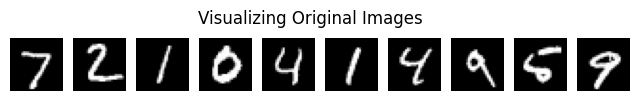

Visualizing reconstructions for fold 1


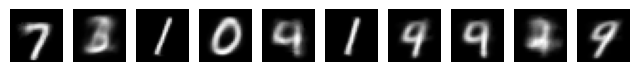

Visualizing reconstructions for fold 2


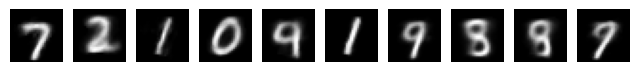

Visualizing reconstructions for fold 3


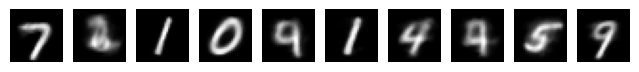

Visualizing reconstructions for fold 4


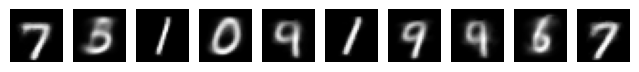

Visualizing reconstructions for fold 5


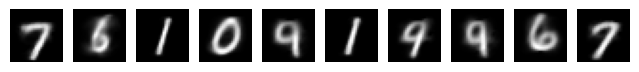

Visualizing reconstructions for fold 6


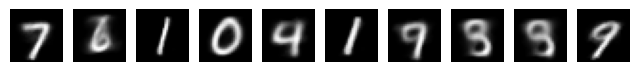

Visualizing reconstructions for fold 7


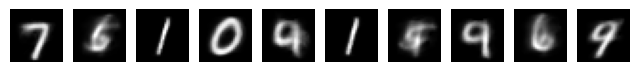

Visualizing reconstructions for fold 8


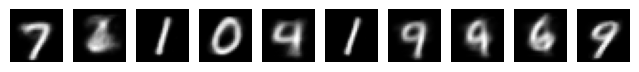

Visualizing reconstructions for fold 9


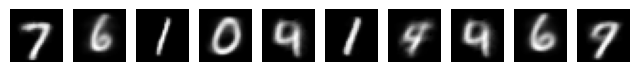

Visualizing reconstructions for fold 10


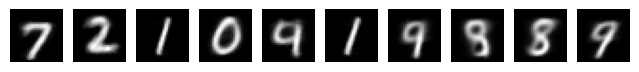

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

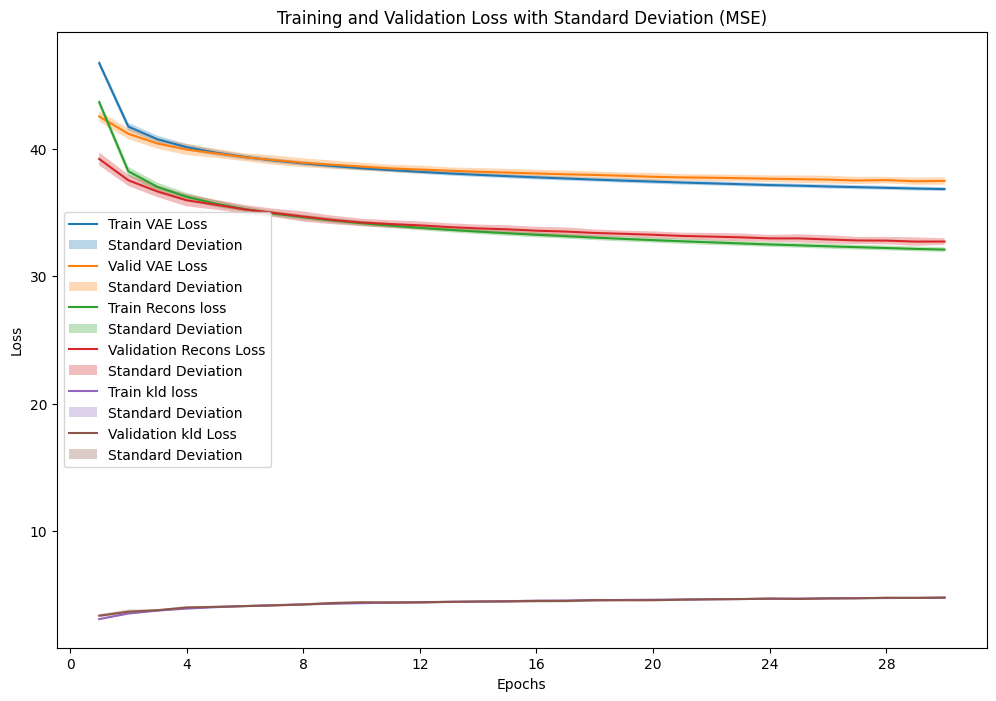

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_6_1 = VAE_plot_results(fold_results_3_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_6_1['epochs'])
VAE_plot_mean_std(result_data_3_6_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_6_1['epochs'])
VAE_plot_mean_std(result_data_3_6_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_6_1['epochs'])
VAE_plot_mean_std(result_data_3_6_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_6_1['epochs'])
VAE_plot_mean_std(result_data_3_6_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_6_1['epochs'])
VAE_plot_mean_std(result_data_3_6_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_6_1['valid_metrics'],
    result_data_3_6_1['test_metrics'],
    result_data_3_6_1['valid_result'],
    result_data_3_6_1['test_result'],
    result_data_3_6_1['recons_valid_result'],
    result_data_3_6_1['recons_test_result'],
    result_data_3_6_1['kld_valid_result'],
    result_data_3_6_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.041751           0.041653            37.493536      37.407679               32.732878         32.732878             4.760658       4.751601
Standard Deviation                 0.000340           0.000194             0.299049       0.167551                0.266280          0.266280             0.096933       0.094575

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.041628,0.041354,37.479686,37.288073
1,2,0.041993,0.041920,37.786618,37.732875
2,3,0.041959,0.041388,37.670463,37.189027
3,4,0.041633,0.041706,37.262324,37.324668
4,5,0.041549,0.041716,37.290403,37.410038
5,6,0.041462,0.041495,37.445927,37.433513
6,7,0.041661,0.041661,37.413859,37.399815
7,8,0.042468,0.041992,38.078330,37.692389
8,9,0.041977,0.041664,37.583050,37.337459
9,10,0.041181,0.041636,36.924696,37.268937


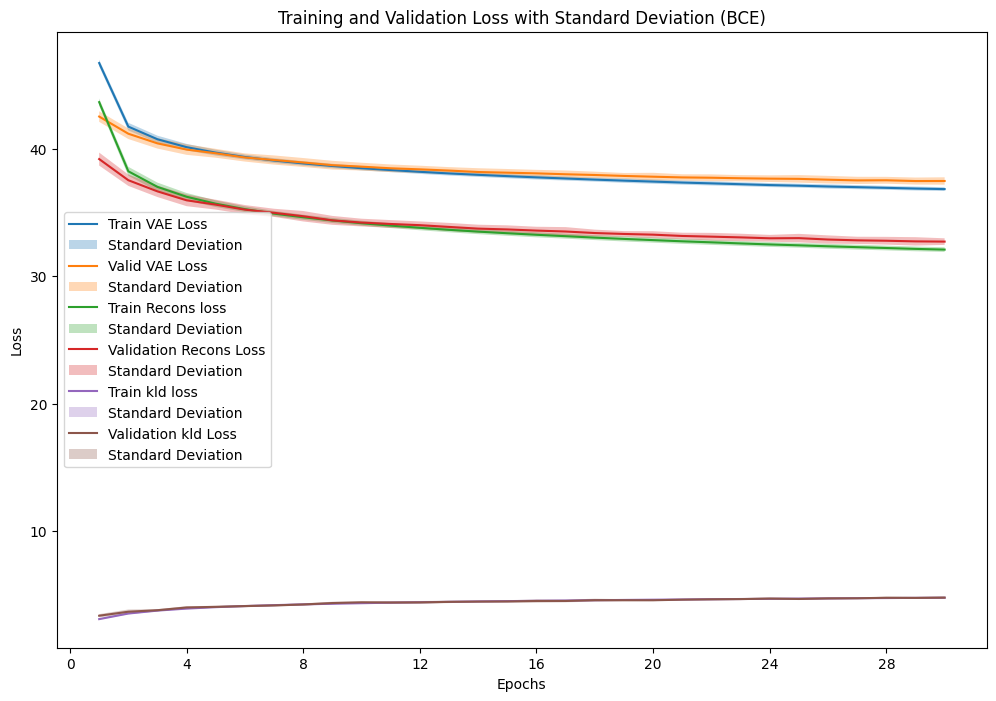

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_6_2 = VAE_plot_results(fold_results_3_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_6_2['epochs'])
VAE_plot_mean_std(result_data_3_6_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_6_2['epochs'])
VAE_plot_mean_std(result_data_3_6_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_6_2['epochs'])
VAE_plot_mean_std(result_data_3_6_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_6_2['epochs'])
VAE_plot_mean_std(result_data_3_6_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_6_2['epochs'])
VAE_plot_mean_std(result_data_3_6_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_6_2['valid_metrics'],
    result_data_3_6_2['test_metrics'],
    result_data_3_6_2['valid_result'],
    result_data_3_6_2['test_result'],
    result_data_3_6_2['recons_valid_result'],
    result_data_3_6_2['recons_test_result'],
    result_data_3_6_2['kld_valid_result'],
    result_data_3_6_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.190055           0.189377            37.466512      37.414771               32.705855         32.705855             4.760658       4.751601
Standard Deviation                 0.001035           0.000859             0.288114       0.167917                0.258154          0.258154             0.096933       0.094575

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.190608,0.189311,37.486530,37.322399
1,2,0.191647,0.191115,37.725634,37.744094
2,3,0.190331,0.188084,37.659150,37.161575
3,4,0.190153,0.190148,37.235755,37.367225
4,5,0.189660,0.190043,37.275547,37.420691
5,6,0.189284,0.188564,37.360655,37.413066
6,7,0.189394,0.188694,37.461485,37.400223
7,8,0.191563,0.189830,38.034929,37.693011
8,9,0.189928,0.189048,37.506470,37.320023
9,10,0.187980,0.188930,36.918969,37.305408


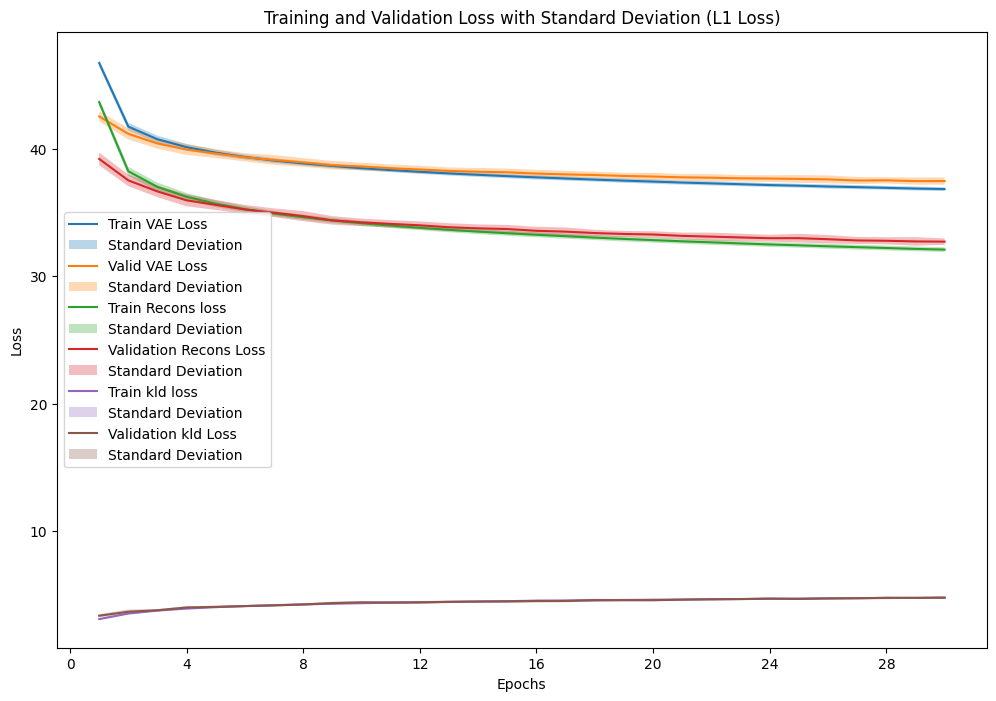

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_6_3 = VAE_plot_results(fold_results_3_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_6_3['epochs'])
VAE_plot_mean_std(result_data_3_6_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_6_3['epochs'])
VAE_plot_mean_std(result_data_3_6_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_6_3['epochs'])
VAE_plot_mean_std(result_data_3_6_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_6_3['epochs'])
VAE_plot_mean_std(result_data_3_6_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_6_3['epochs'])
VAE_plot_mean_std(result_data_3_6_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_6_3['valid_metrics'],
    result_data_3_6_3['test_metrics'],
    result_data_3_6_3['valid_result'],
    result_data_3_6_3['test_result'],
    result_data_3_6_3['recons_valid_result'],
    result_data_3_6_3['recons_test_result'],
    result_data_3_6_3['kld_valid_result'],
    result_data_3_6_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.097966           0.097978            37.480450      37.416252               32.719793         32.719793             4.760658       4.751601
Standard Deviation                 0.000583           0.000462             0.295326       0.159809                0.265058          0.265058             0.096933       0.094575

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.097624,0.097383,37.480022,37.288099
1,2,0.098345,0.098321,37.759371,37.704367
2,3,0.097931,0.097376,37.583386,37.209282
3,4,0.098156,0.098247,37.241966,37.327959
4,5,0.097855,0.098130,37.289710,37.443443
5,6,0.097179,0.097408,37.409011,37.411411
6,7,0.097481,0.097786,37.426424,37.439611
7,8,0.099442,0.098808,38.109024,37.703023
8,9,0.097925,0.097948,37.555897,37.351845
9,10,0.097722,0.098372,36.949692,37.283481


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_6 = sum(p.numel() for p in models_3_6[0].parameters())
print(f"Number of parameters in the model: {total_params_3_6}")

Number of parameters in the model: 620156


<ipython-input-17-14e9441719e3>:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


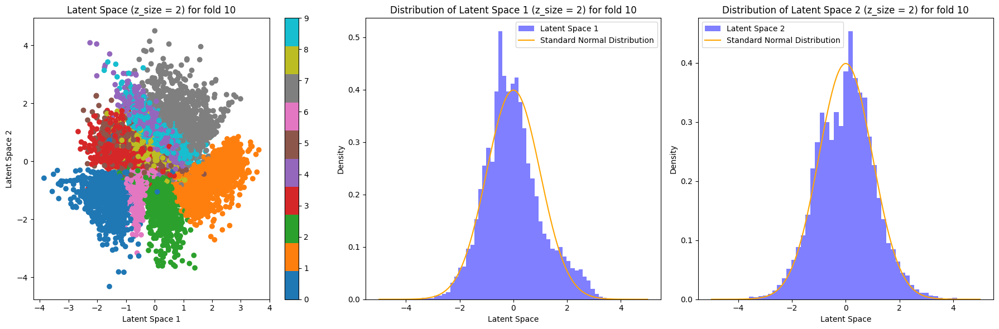

In [ ]:
latent_space_VAE_model(models_3_6[9], test_loader, device, number_fold=10)

### Experiment 3.1 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_8_6 = 'VAE'
model_config_8_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_8_6, fold_results_8_6 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_8_6),
                                                model_config=model_config_8_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:40.387598, Training Recons Loss: 33.403958, Training KLD Loss: 6.983639
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.032436574749807094, 'L1 Loss': 0.08400533102611278, 'BCE': 0.16365141786159354}, Validation VAE Loss: {'MSE': 34.3315022448276, 'L1 Loss': 34.31399592947453, 'BCE': 34.29446719555145}, Validation Recons Loss: {'MSE': 25.430274659014763, 'L1 Loss': 25.41276852628018, 'BCE': 25.393239548865786}, Validation KLD Loss: {'MSE': 8.901227595958304, 'L1 Loss': 8.901227595958304, 'BCE': 8.901227595958304}
Train Fold/Epoch: 1/2, Training Loss:33.371224, Training Recons Loss: 24.364478, Training KLD Loss: 9.006746
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.030134200653497208, 'L1 Loss': 0.07680314509792531, 'BCE': 0.15591832979562434}, Validation VAE Loss: {'MSE': 32.88425

## Visualizing reconstructions for all fold

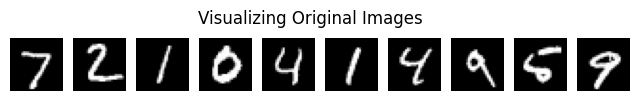

Visualizing reconstructions for fold 1


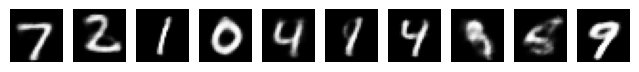

Visualizing reconstructions for fold 2


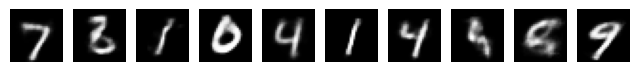

Visualizing reconstructions for fold 3


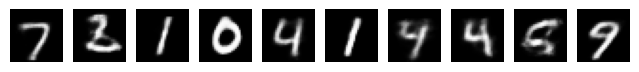

Visualizing reconstructions for fold 4


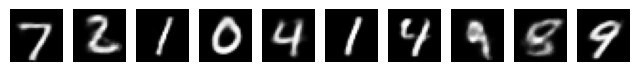

Visualizing reconstructions for fold 5


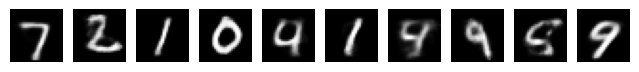

Visualizing reconstructions for fold 6


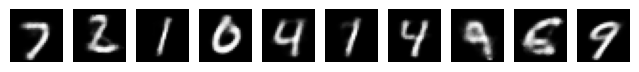

Visualizing reconstructions for fold 7


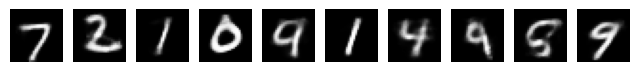

Visualizing reconstructions for fold 8


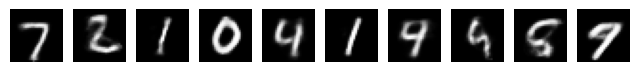

Visualizing reconstructions for fold 9


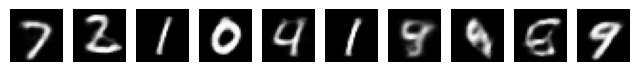

Visualizing reconstructions for fold 10


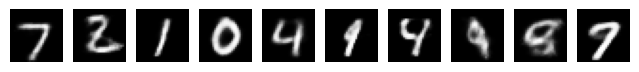

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_8_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

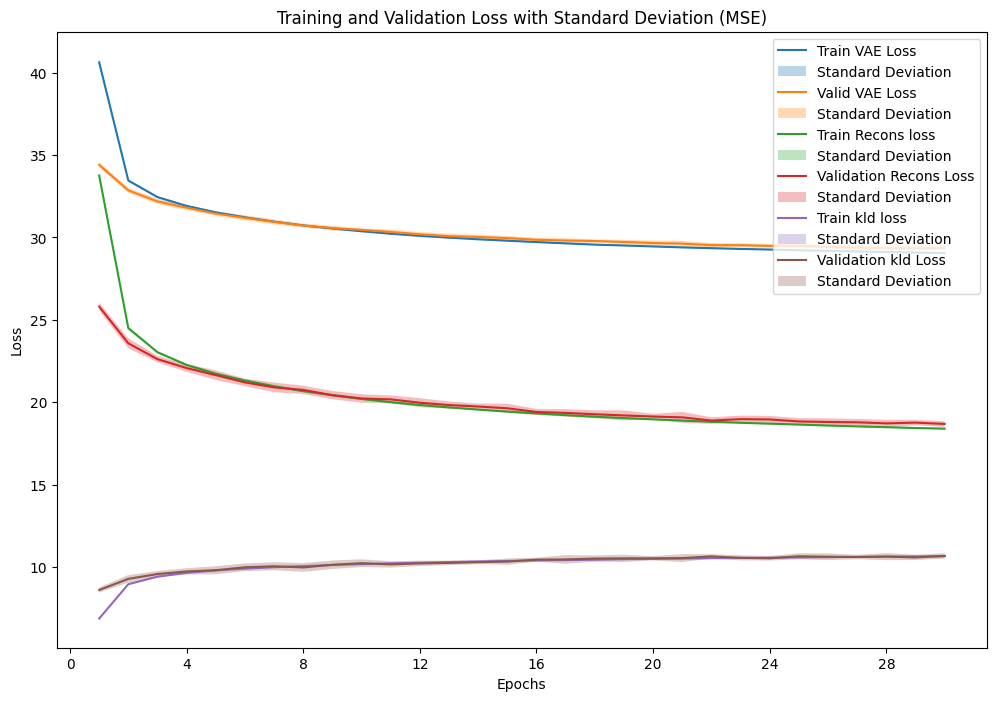

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_8_6_1 = VAE_plot_results(fold_results_8_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_8_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_8_6_1['epochs'])
VAE_plot_mean_std(result_data_8_6_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_8_6_1['epochs'])
VAE_plot_mean_std(result_data_8_6_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_8_6_1['epochs'])
VAE_plot_mean_std(result_data_8_6_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_8_6_1['epochs'])
VAE_plot_mean_std(result_data_8_6_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_8_6_1['epochs'])
VAE_plot_mean_std(result_data_8_6_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_8_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_8_6_1['valid_metrics'],
    result_data_8_6_1['test_metrics'],
    result_data_8_6_1['valid_result'],
    result_data_8_6_1['test_result'],
    result_data_8_6_1['recons_valid_result'],
    result_data_8_6_1['recons_test_result'],
    result_data_8_6_1['kld_valid_result'],
    result_data_8_6_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.023802           0.023445            29.336406      29.098034               18.660975         18.660975            10.675432      10.717497
Standard Deviation                 0.000233           0.000175             0.160936       0.084217                0.182777          0.182777             0.161846       0.165416

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.023894,0.023439,29.314189,29.034482
1,2,0.023739,0.023400,29.370318,29.160070
2,3,0.023655,0.023194,29.430997,29.099261
3,4,0.023466,0.023268,29.146205,29.013623
4,5,0.023832,0.023457,29.320004,29.078615
5,6,0.023716,0.023489,29.353062,29.171929
6,7,0.023833,0.023404,29.400210,29.102510
7,8,0.024398,0.023814,29.652815,29.183144
8,9,0.023631,0.023307,29.366361,29.211617
9,10,0.023858,0.023673,29.009899,28.925093


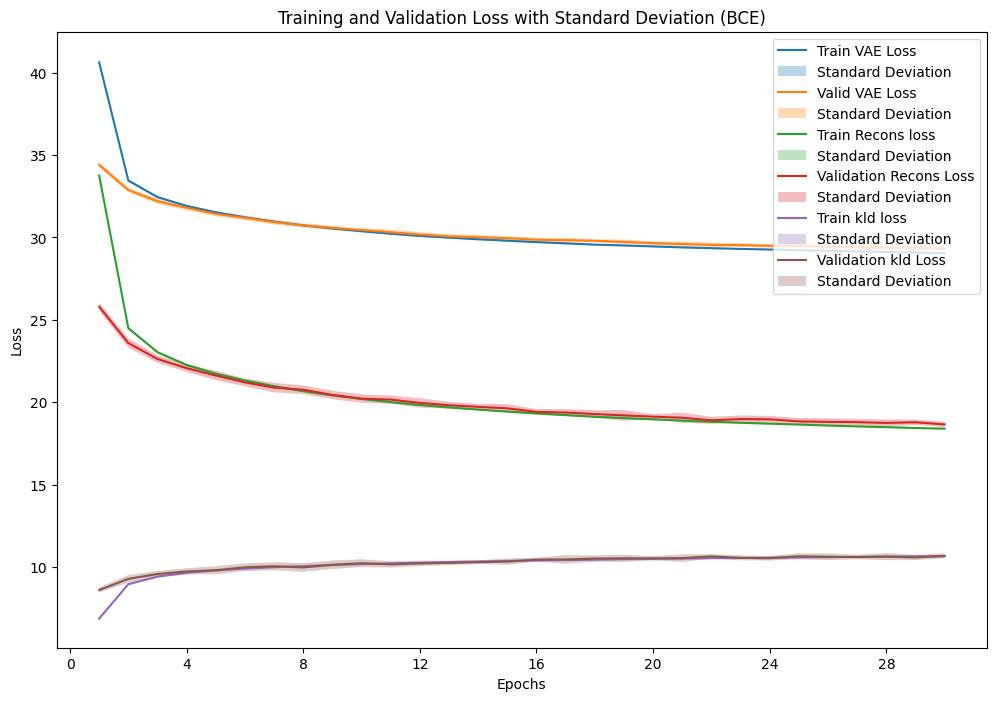

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_8_6_2 = VAE_plot_results(fold_results_8_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_8_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_8_6_2['epochs'])
VAE_plot_mean_std(result_data_8_6_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_8_6_2['epochs'])
VAE_plot_mean_std(result_data_8_6_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_8_6_2['epochs'])
VAE_plot_mean_std(result_data_8_6_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_8_6_2['epochs'])
VAE_plot_mean_std(result_data_8_6_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_8_6_2['epochs'])
VAE_plot_mean_std(result_data_8_6_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_8_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_8_6_2['valid_metrics'],
    result_data_8_6_2['test_metrics'],
    result_data_8_6_2['valid_result'],
    result_data_8_6_2['test_result'],
    result_data_8_6_2['recons_valid_result'],
    result_data_8_6_2['recons_test_result'],
    result_data_8_6_2['kld_valid_result'],
    result_data_8_6_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.135802           0.134343            29.353756      29.094171               18.678324         18.678324            10.675432      10.717497
Standard Deviation                 0.000826           0.000556             0.154360       0.087969                0.151075          0.151075             0.161846       0.165416

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.136101,0.134428,29.307291,29.081584
1,2,0.135545,0.134274,29.401622,29.130336
2,3,0.135523,0.133604,29.457319,29.079215
3,4,0.134839,0.133681,29.191836,28.985534
4,5,0.135587,0.134369,29.281617,29.079166
5,6,0.135654,0.134310,29.367065,29.177646
6,7,0.135913,0.134319,29.428272,29.110919
7,8,0.138071,0.135634,29.588933,29.143468
8,9,0.135173,0.133946,29.493269,29.240313
9,10,0.135618,0.134864,29.020333,28.913525


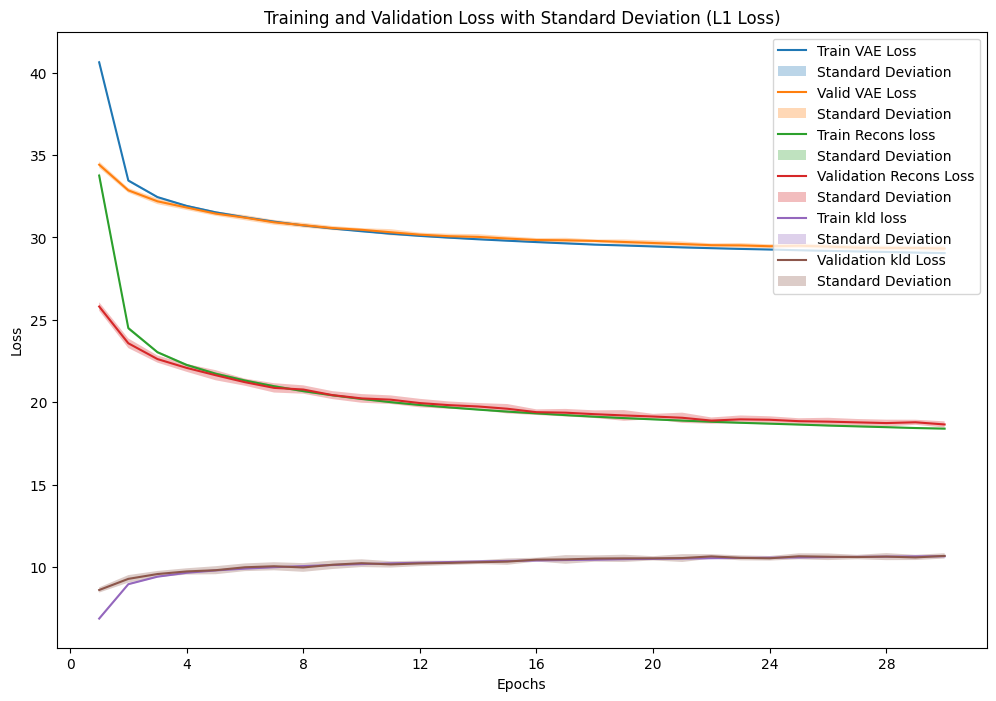

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_8_6_3 = VAE_plot_results(fold_results_8_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_8_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_8_6_3['epochs'])
VAE_plot_mean_std(result_data_8_6_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_8_6_3['epochs'])
VAE_plot_mean_std(result_data_8_6_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_8_6_3['epochs'])
VAE_plot_mean_std(result_data_8_6_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_8_6_3['epochs'])
VAE_plot_mean_std(result_data_8_6_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_8_6_3['epochs'])
VAE_plot_mean_std(result_data_8_6_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_8_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_8_6_3['valid_metrics'],
    result_data_8_6_3['test_metrics'],
    result_data_8_6_3['valid_result'],
    result_data_8_6_3['test_result'],
    result_data_8_6_3['recons_valid_result'],
    result_data_8_6_3['recons_test_result'],
    result_data_8_6_3['kld_valid_result'],
    result_data_8_6_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.062368           0.061634            29.338189      29.084500               18.662757         18.662757            10.675432      10.717497
Standard Deviation                 0.000324           0.000228             0.167322       0.089196                0.188772          0.188772             0.161846       0.165416

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.062628,0.061767,29.306030,29.071146
1,2,0.062303,0.061528,29.398792,29.115455
2,3,0.062358,0.061268,29.452896,29.039482
3,4,0.061788,0.061375,29.121196,29.030324
4,5,0.062433,0.061744,29.267493,29.062874
5,6,0.062345,0.061634,29.344523,29.097257
6,7,0.062569,0.061745,29.417756,29.136908
7,8,0.062996,0.062013,29.666946,29.142508
8,9,0.061922,0.061387,29.375003,29.256894
9,10,0.062339,0.061880,29.031253,28.892149


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_8_6 = sum(p.numel() for p in models_8_6[0].parameters())
print(f"Number of parameters in the model: {total_params_8_6}")

Number of parameters in the model: 632024


### Experiment 3.2 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=16, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_7 = 'VAE'
model_config_3_7 = {'D_x': 784, 'n_layers': 2, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_7, fold_results_3_7 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_7),
                                                model_config=model_config_3_7,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:41.399621, Training Recons Loss: 33.923940, Training KLD Loss: 7.475681
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.032039290095897434, 'L1 Loss': 0.08271980959367245, 'BCE': 0.16281342522260991}, Validation VAE Loss: {'MSE': 34.831642637861535, 'L1 Loss': 34.70554489785052, 'BCE': 34.782129328301615}, Validation Recons Loss: {'MSE': 25.11880334894708, 'L1 Loss': 24.99270571039078, 'BCE': 25.069290262587526}, Validation KLD Loss: {'MSE': 9.712839207750685, 'L1 Loss': 9.712839207750685, 'BCE': 9.712839207750685}
Train Fold/Epoch: 1/2, Training Loss:33.551383, Training Recons Loss: 22.698877, Training KLD Loss: 10.852506
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.02752876386759763, 'L1 Loss': 0.07348720396452761, 'BCE': 0.14808468726721216}, Validation VAE Loss: {'MSE': 32.855

## Visualizing reconstructions for all fold

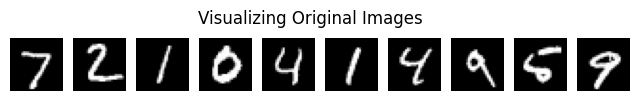

Visualizing reconstructions for fold 1


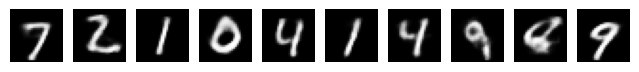

Visualizing reconstructions for fold 2


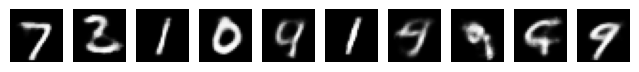

Visualizing reconstructions for fold 3


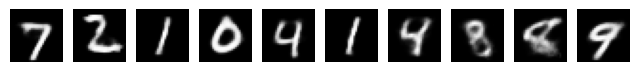

Visualizing reconstructions for fold 4


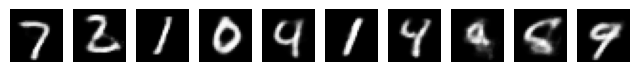

Visualizing reconstructions for fold 5


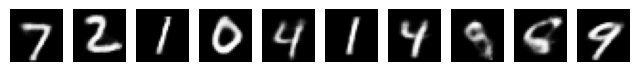

Visualizing reconstructions for fold 6


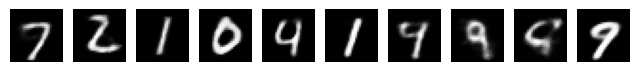

Visualizing reconstructions for fold 7


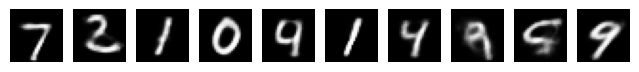

Visualizing reconstructions for fold 8


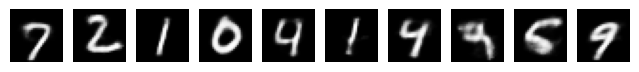

Visualizing reconstructions for fold 9


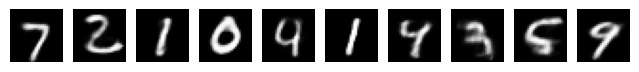

Visualizing reconstructions for fold 10


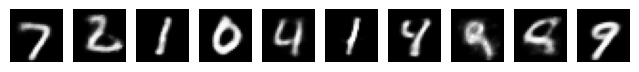

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_7):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

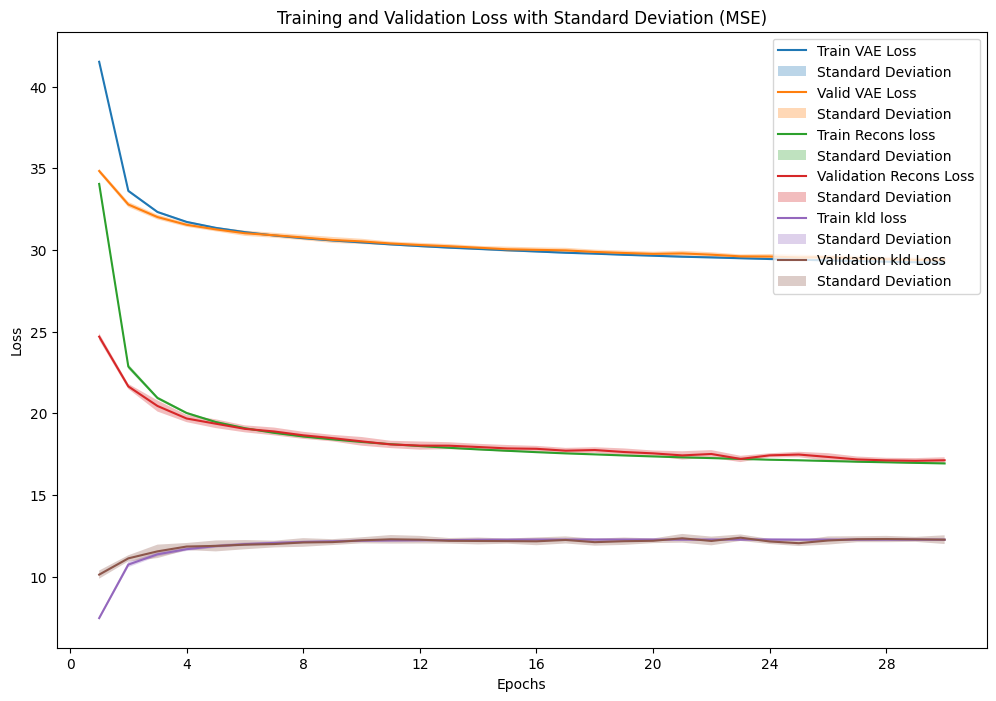

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_7_1 = VAE_plot_results(fold_results_3_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_7_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_7_1['epochs'])
VAE_plot_mean_std(result_data_3_7_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_7_1['epochs'])
VAE_plot_mean_std(result_data_3_7_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_7_1['epochs'])
VAE_plot_mean_std(result_data_3_7_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_7_1['epochs'])
VAE_plot_mean_std(result_data_3_7_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_7_1['epochs'])
VAE_plot_mean_std(result_data_3_7_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_7_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_7_1['valid_metrics'],
    result_data_3_7_1['test_metrics'],
    result_data_3_7_1['valid_result'],
    result_data_3_7_1['test_result'],
    result_data_3_7_1['recons_valid_result'],
    result_data_3_7_1['recons_test_result'],
    result_data_3_7_1['kld_valid_result'],
    result_data_3_7_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.021863           0.021452            29.414952      29.128516               17.140581         17.140581            12.274371      12.310288
Standard Deviation                 0.000213           0.000264             0.142391       0.103113                0.166827          0.166827             0.267830       0.251861

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.021694,0.021284,29.288645,29.044753
1,2,0.022074,0.021668,29.311848,29.046399
2,3,0.021783,0.021338,29.497703,29.133204
3,4,0.021747,0.021369,29.428713,29.172805
4,5,0.021927,0.021357,29.518135,29.141834
5,6,0.022026,0.021787,29.557191,29.348299
6,7,0.021951,0.021497,29.387310,29.064239
7,8,0.021565,0.020997,29.657670,29.193957
8,9,0.021598,0.021278,29.362774,29.185585
9,10,0.022266,0.021943,29.139535,28.954081


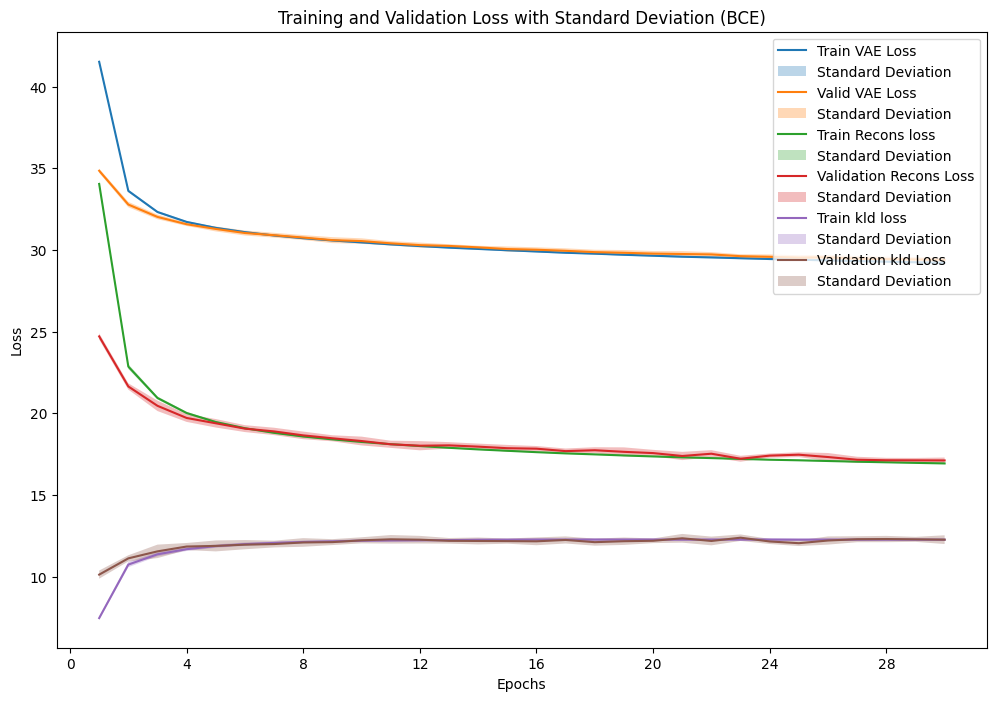

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_7_2 = VAE_plot_results(fold_results_3_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_7_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_7_2['epochs'])
VAE_plot_mean_std(result_data_3_7_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_7_2['epochs'])
VAE_plot_mean_std(result_data_3_7_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_7_2['epochs'])
VAE_plot_mean_std(result_data_3_7_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_7_2['epochs'])
VAE_plot_mean_std(result_data_3_7_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_7_2['epochs'])
VAE_plot_mean_std(result_data_3_7_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_7_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_7_2['valid_metrics'],
    result_data_3_7_2['test_metrics'],
    result_data_3_7_2['valid_result'],
    result_data_3_7_2['test_result'],
    result_data_3_7_2['recons_valid_result'],
    result_data_3_7_2['recons_test_result'],
    result_data_3_7_2['kld_valid_result'],
    result_data_3_7_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.129494           0.128034            29.395505      29.127302               17.121134         17.121134            12.274371      12.310288
Standard Deviation                 0.000747           0.001007             0.134897       0.071992                0.186248          0.186248             0.267830       0.251861

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.128871,0.127423,29.226427,29.008971
1,2,0.130239,0.129019,29.371975,29.145928
2,3,0.128904,0.127285,29.390476,29.039272
3,4,0.129121,0.127651,29.391382,29.126007
4,5,0.129699,0.127930,29.463500,29.157354
5,6,0.130359,0.128936,29.523326,29.274504
6,7,0.129513,0.128110,29.364447,29.085240
7,8,0.129017,0.126526,29.678893,29.169984
8,9,0.128363,0.127317,29.372814,29.174735
9,10,0.130855,0.130146,29.171812,29.091030


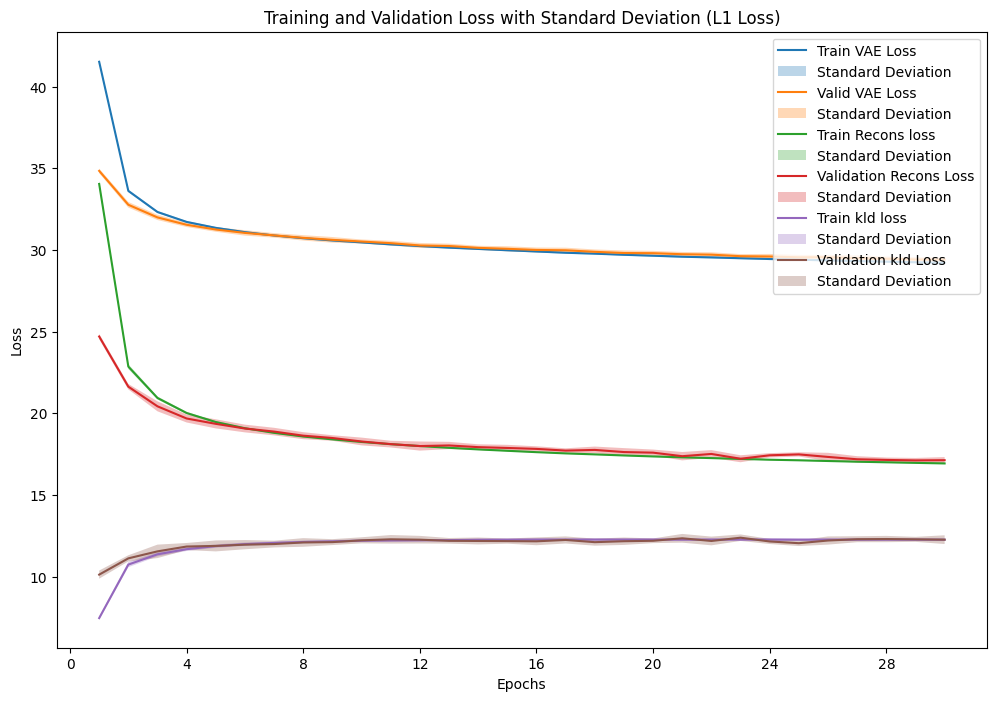

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_7_3 = VAE_plot_results(fold_results_3_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_7_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_7_3['epochs'])
VAE_plot_mean_std(result_data_3_7_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_7_3['epochs'])
VAE_plot_mean_std(result_data_3_7_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_7_3['epochs'])
VAE_plot_mean_std(result_data_3_7_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_7_3['epochs'])
VAE_plot_mean_std(result_data_3_7_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_7_3['epochs'])
VAE_plot_mean_std(result_data_3_7_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_7_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_7_3['valid_metrics'],
    result_data_3_7_3['test_metrics'],
    result_data_3_7_3['valid_result'],
    result_data_3_7_3['test_result'],
    result_data_3_7_3['recons_valid_result'],
    result_data_3_7_3['recons_test_result'],
    result_data_3_7_3['kld_valid_result'],
    result_data_3_7_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.058572           0.057816            29.396478      29.123081               17.122107         17.122107            12.274371      12.310288
Standard Deviation                 0.000405           0.000439             0.125006       0.080701                0.181221          0.181221             0.267830       0.251861

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.058643,0.057670,29.343420,29.034535
1,2,0.058971,0.058186,29.321523,29.051025
2,3,0.058306,0.057568,29.424320,29.112685
3,4,0.058224,0.057651,29.383035,29.152496
4,5,0.057998,0.057331,29.381758,29.169760
5,6,0.058943,0.058134,29.599158,29.248495
6,7,0.058906,0.058061,29.367000,29.065764
7,8,0.058057,0.057154,29.603257,29.237886
8,9,0.058445,0.057680,29.393719,29.159323
9,10,0.059225,0.058725,29.147588,28.998844


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_7 = sum(p.numel() for p in models_3_7[0].parameters())
print(f"Number of parameters in the model: {total_params_3_7}")

Number of parameters in the model: 648016


### Experiment 3.3 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=32, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_3_8 = 'VAE'
model_config_3_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_3_8, fold_results_3_8 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_3_8),
                                                model_config=model_config_3_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:43.100659, Training Recons Loss: 35.955362, Training KLD Loss: 7.145297
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.033896133719765124, 'L1 Loss': 0.08770415567337199, 'BCE': 0.1688891868007944}, Validation VAE Loss: {'MSE': 36.455728206228706, 'L1 Loss': 36.453905754900994, 'BCE': 36.43097646185692}, Validation Recons Loss: {'MSE': 26.574568829637894, 'L1 Loss': 26.572746824710926, 'BCE': 26.549817389630256}, Validation KLD Loss: {'MSE': 9.881159122954024, 'L1 Loss': 9.881159122954024, 'BCE': 9.881159122954024}
Train Fold/Epoch: 1/2, Training Loss:34.825326, Training Recons Loss: 24.236780, Training KLD Loss: 10.588546
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.02905462359256567, 'L1 Loss': 0.07582170547957116, 'BCE': 0.15339579544168838}, Validation VAE Loss: {'MSE': 33.58

## Visualizing reconstructions for all fold

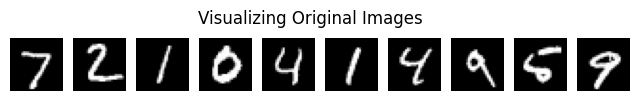

Visualizing reconstructions for fold 1


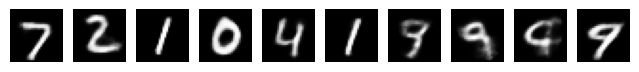

Visualizing reconstructions for fold 2


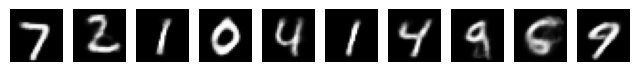

Visualizing reconstructions for fold 3


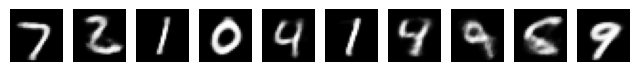

Visualizing reconstructions for fold 4


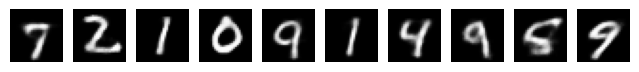

Visualizing reconstructions for fold 5


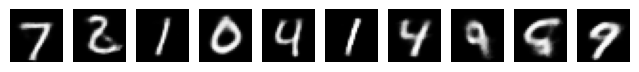

Visualizing reconstructions for fold 6


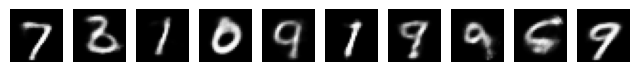

Visualizing reconstructions for fold 7


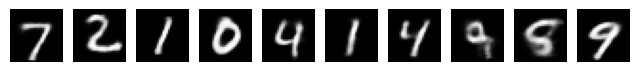

Visualizing reconstructions for fold 8


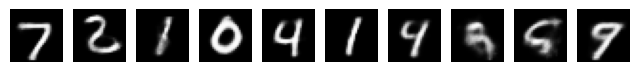

Visualizing reconstructions for fold 9


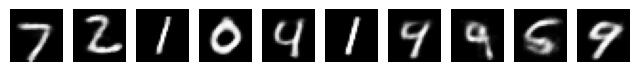

Visualizing reconstructions for fold 10


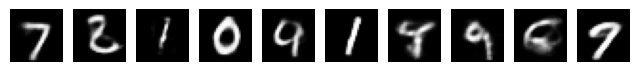

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_3_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

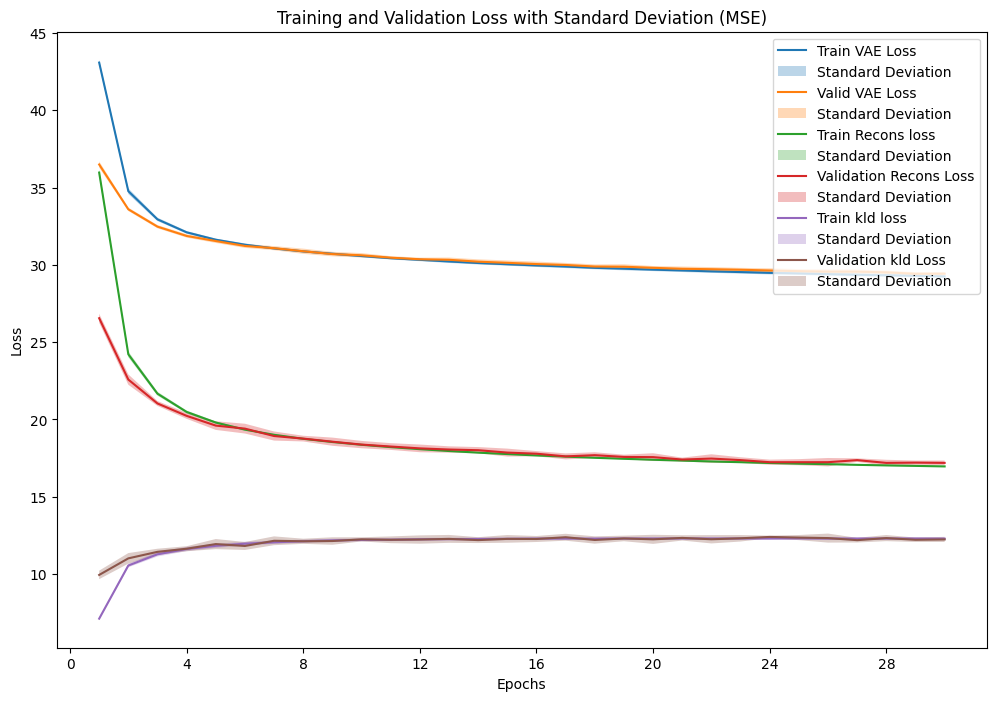

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_3_8_1 = VAE_plot_results(fold_results_3_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_8_1['epochs'])
VAE_plot_mean_std(result_data_3_8_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_8_1['epochs'])
VAE_plot_mean_std(result_data_3_8_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_8_1['epochs'])
VAE_plot_mean_std(result_data_3_8_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_8_1['epochs'])
VAE_plot_mean_std(result_data_3_8_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_8_1['epochs'])
VAE_plot_mean_std(result_data_3_8_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_8_1['valid_metrics'],
    result_data_3_8_1['test_metrics'],
    result_data_3_8_1['valid_result'],
    result_data_3_8_1['test_result'],
    result_data_3_8_1['recons_valid_result'],
    result_data_3_8_1['recons_test_result'],
    result_data_3_8_1['kld_valid_result'],
    result_data_3_8_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.021903           0.021529            29.410760      29.152807               17.171782         17.171782            12.238978      12.273718
Standard Deviation                 0.000156           0.000197             0.110816       0.091828                0.122161          0.122161             0.166407       0.169397

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.021836,0.021352,29.387359,29.066673
1,2,0.021848,0.021415,29.581149,29.272568
2,3,0.021805,0.021351,29.357780,28.976002
3,4,0.021940,0.021789,29.147566,29.084869
4,5,0.022034,0.021681,29.439348,29.220872
5,6,0.021743,0.021478,29.476328,29.273387
6,7,0.021761,0.021253,29.498187,29.118127
7,8,0.022301,0.021896,29.479638,29.123306
8,9,0.021848,0.021475,29.383084,29.167082
9,10,0.021913,0.021605,29.357158,29.225181


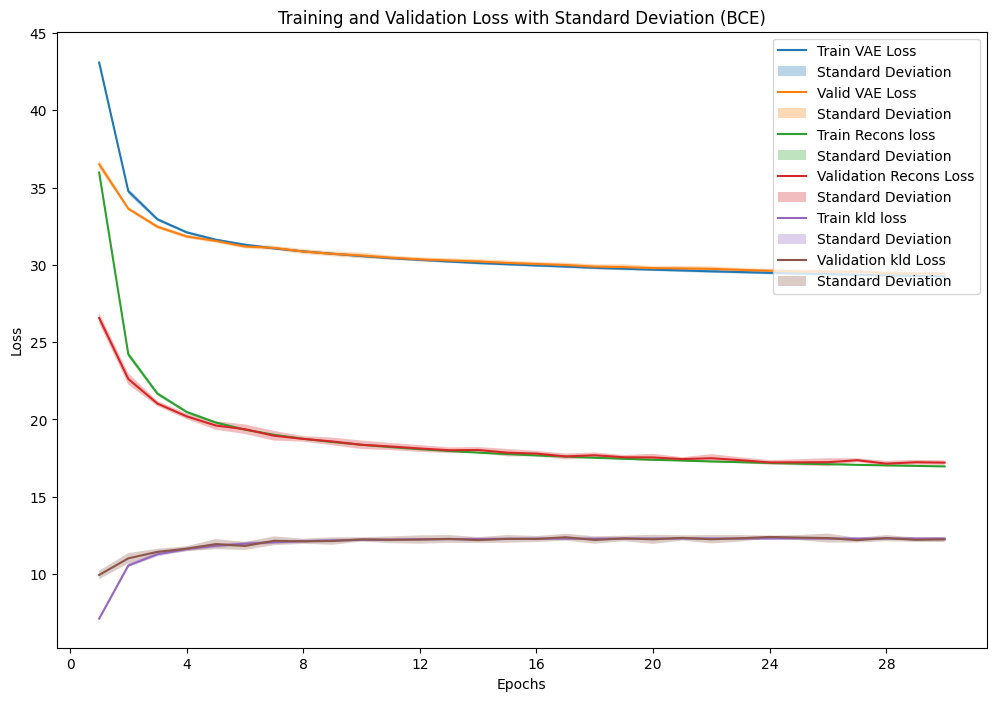

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_3_8_2 = VAE_plot_results(fold_results_3_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_8_2['epochs'])
VAE_plot_mean_std(result_data_3_8_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_8_2['epochs'])
VAE_plot_mean_std(result_data_3_8_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_8_2['epochs'])
VAE_plot_mean_std(result_data_3_8_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_8_2['epochs'])
VAE_plot_mean_std(result_data_3_8_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_8_2['epochs'])
VAE_plot_mean_std(result_data_3_8_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_8_2['valid_metrics'],
    result_data_3_8_2['test_metrics'],
    result_data_3_8_2['valid_result'],
    result_data_3_8_2['test_result'],
    result_data_3_8_2['recons_valid_result'],
    result_data_3_8_2['recons_test_result'],
    result_data_3_8_2['kld_valid_result'],
    result_data_3_8_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.129620           0.128239            29.410609      29.163811               17.171632         17.171632            12.238978      12.273718
Standard Deviation                 0.000661           0.000491             0.115553       0.125706                0.140704          0.140704             0.166407       0.169397

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.129537,0.127803,29.371063,29.103509
1,2,0.129158,0.128057,29.515194,29.287973
2,3,0.129231,0.127470,29.323935,28.914623
3,4,0.130073,0.128718,29.183864,28.988643
4,5,0.129810,0.128686,29.398888,29.232482
5,6,0.129667,0.128117,29.544422,29.283040
6,7,0.129049,0.127664,29.508593,29.202811
7,8,0.131352,0.129124,29.546207,29.095627
8,9,0.129155,0.128349,29.428765,29.283797
9,10,0.129163,0.128406,29.285162,29.245610


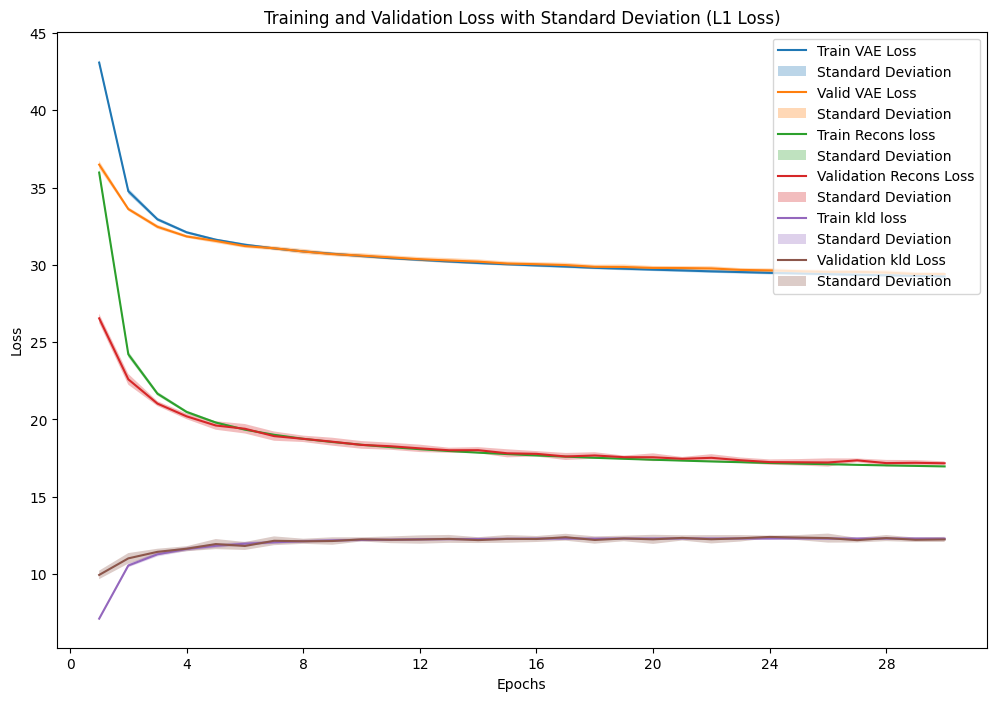

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_3_8_3 = VAE_plot_results(fold_results_3_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_3_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_3_8_3['epochs'])
VAE_plot_mean_std(result_data_3_8_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_3_8_3['epochs'])
VAE_plot_mean_std(result_data_3_8_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_3_8_3['epochs'])
VAE_plot_mean_std(result_data_3_8_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_3_8_3['epochs'])
VAE_plot_mean_std(result_data_3_8_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_3_8_3['epochs'])
VAE_plot_mean_std(result_data_3_8_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_3_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_3_8_3['valid_metrics'],
    result_data_3_8_3['test_metrics'],
    result_data_3_8_3['valid_result'],
    result_data_3_8_3['test_result'],
    result_data_3_8_3['recons_valid_result'],
    result_data_3_8_3['recons_test_result'],
    result_data_3_8_3['kld_valid_result'],
    result_data_3_8_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.058844           0.058078            29.447183      29.160969               17.208206         17.208206            12.238978      12.273718
Standard Deviation                 0.000378           0.000327             0.131158       0.108493                0.155408          0.155408             0.166407       0.169397

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.058723,0.058011,29.342760,29.077077
1,2,0.058611,0.057547,29.621447,29.234323
2,3,0.058514,0.057702,29.356676,28.977697
3,4,0.058787,0.058151,29.190914,28.998541
4,5,0.059184,0.058497,29.462928,29.236029
5,6,0.058617,0.057930,29.503588,29.273158
6,7,0.058875,0.058039,29.554539,29.245916
7,8,0.059806,0.058698,29.617080,29.095886
8,9,0.058452,0.057937,29.483200,29.283104
9,10,0.058876,0.058263,29.338700,29.187966


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_3_8 = sum(p.numel() for p in models_3_8[0].parameters())
print(f"Number of parameters in the model: {total_params_3_8}")

Number of parameters in the model: 680576


### Experiment 3.3 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=32, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_6_8 = 'VAE'
model_config_6_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'gaussian'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_6_8, fold_results_6_8 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_6_8),
                                                model_config=model_config_6_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:44.794942, Training Recons Loss: 38.234504, Training KLD Loss: 6.560438
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.03769179104649006, 'L1 Loss': 0.09410232654277315, 'BCE': 0.18079490832825926}, Validation VAE Loss: {'MSE': 38.8318848711379, 'L1 Loss': 38.9277186698102, 'BCE': 39.02452550035842}, Validation Recons Loss: {'MSE': 29.55036412908676, 'L1 Loss': 29.646197765431506, 'BCE': 29.74300473801633}, Validation KLD Loss: {'MSE': 9.281520731905674, 'L1 Loss': 9.281520731905674, 'BCE': 9.281520731905674}
Train Fold/Epoch: 1/2, Training Loss:36.602171, Training Recons Loss: 26.703301, Training KLD Loss: 9.898869
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.030680070135821687, 'L1 Loss': 0.07896488904953003, 'BCE': 0.15809717948766464}, Validation VAE Loss: {'MSE': 34.70640121

## Visualizing reconstructions for all fold

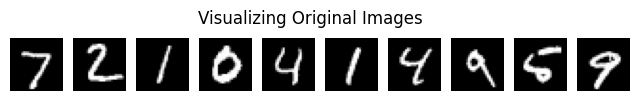

Visualizing reconstructions for fold 1


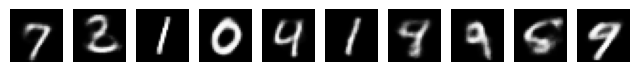

Visualizing reconstructions for fold 2


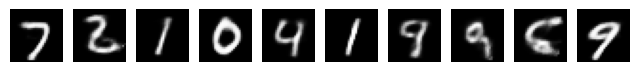

Visualizing reconstructions for fold 3


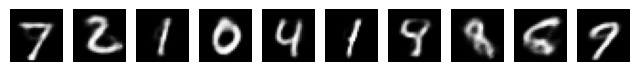

Visualizing reconstructions for fold 4


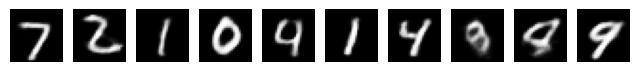

Visualizing reconstructions for fold 5


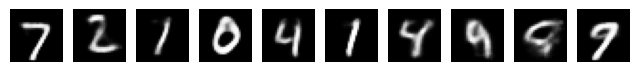

Visualizing reconstructions for fold 6


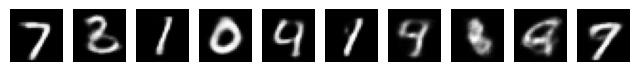

Visualizing reconstructions for fold 7


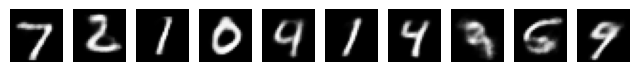

Visualizing reconstructions for fold 8


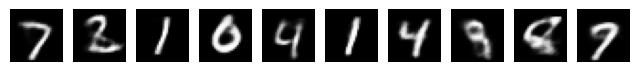

Visualizing reconstructions for fold 9


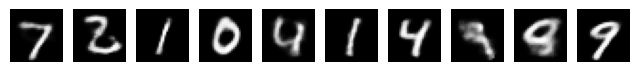

Visualizing reconstructions for fold 10


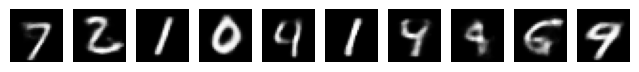

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_6_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

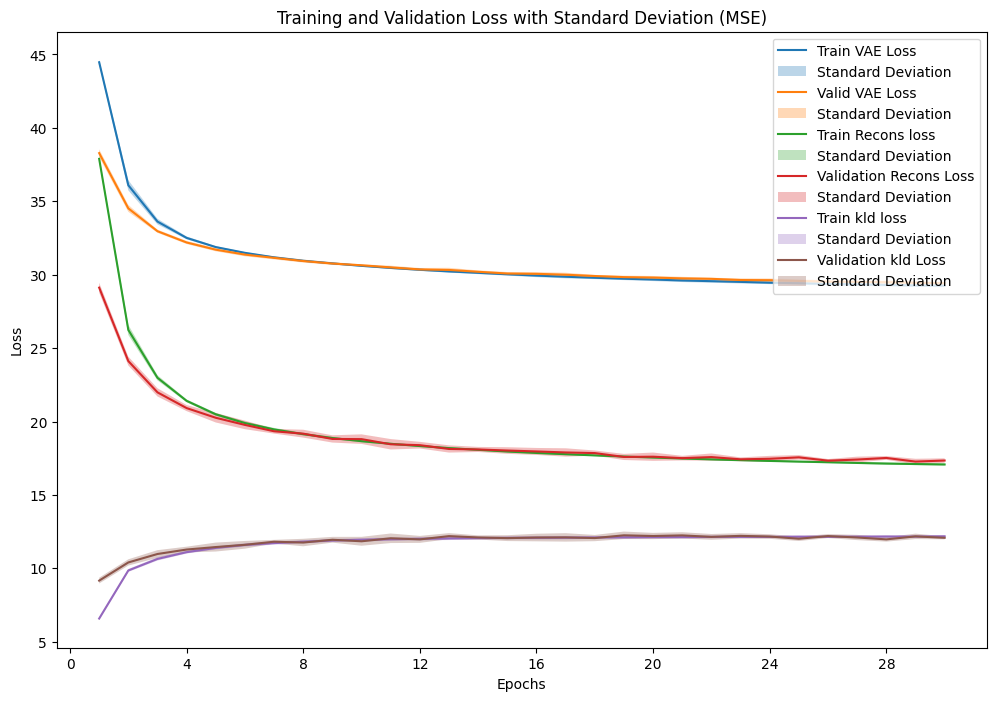

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_6_8_1 = VAE_plot_results(fold_results_6_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_6_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_6_8_1['epochs'])
VAE_plot_mean_std(result_data_6_8_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_6_8_1['epochs'])
VAE_plot_mean_std(result_data_6_8_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_6_8_1['epochs'])
VAE_plot_mean_std(result_data_6_8_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_6_8_1['epochs'])
VAE_plot_mean_std(result_data_6_8_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_6_8_1['epochs'])
VAE_plot_mean_std(result_data_6_8_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_6_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_6_8_1['valid_metrics'],
    result_data_6_8_1['test_metrics'],
    result_data_6_8_1['valid_result'],
    result_data_6_8_1['test_result'],
    result_data_6_8_1['recons_valid_result'],
    result_data_6_8_1['recons_test_result'],
    result_data_6_8_1['kld_valid_result'],
    result_data_6_8_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.022126           0.021717            29.426015      29.150950               17.347033         17.347033            12.078982      12.124976
Standard Deviation                 0.000180           0.000175             0.093165       0.073002                0.141212          0.141212             0.106108       0.079810

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.022392,0.021836,29.478732,29.153142
1,2,0.022056,0.021601,29.366870,29.060154
2,3,0.022338,0.021810,29.601273,29.185196
3,4,0.021869,0.021550,29.329521,29.116742
4,5,0.022342,0.021823,29.522473,29.185696
5,6,0.022189,0.021783,29.498014,29.196111
6,7,0.021934,0.021517,29.383212,29.102271
7,8,0.021902,0.021400,29.442643,29.027384
8,9,0.022130,0.021917,29.297894,29.189187
9,10,0.022110,0.021932,29.339517,29.293620


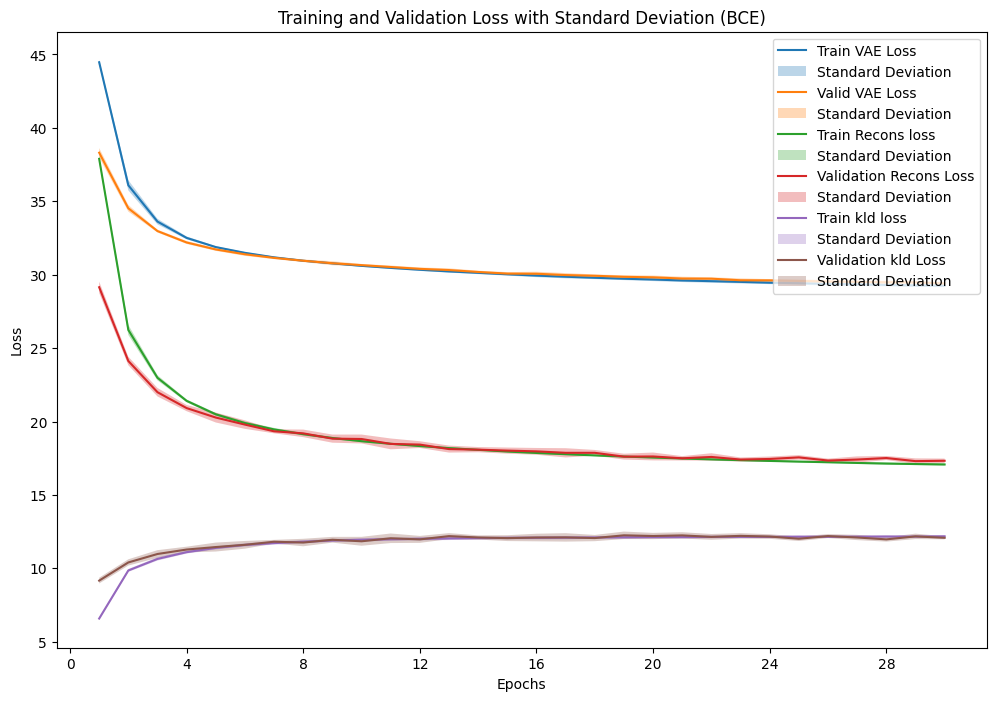

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_6_8_2 = VAE_plot_results(fold_results_6_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_6_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_6_8_2['epochs'])
VAE_plot_mean_std(result_data_6_8_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_6_8_2['epochs'])
VAE_plot_mean_std(result_data_6_8_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_6_8_2['epochs'])
VAE_plot_mean_std(result_data_6_8_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_6_8_2['epochs'])
VAE_plot_mean_std(result_data_6_8_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_6_8_2['epochs'])
VAE_plot_mean_std(result_data_6_8_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_6_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_6_8_2['valid_metrics'],
    result_data_6_8_2['test_metrics'],
    result_data_6_8_2['valid_result'],
    result_data_6_8_2['test_result'],
    result_data_6_8_2['recons_valid_result'],
    result_data_6_8_2['recons_test_result'],
    result_data_6_8_2['kld_valid_result'],
    result_data_6_8_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.130291           0.128797            29.404598      29.143274               17.325616         17.325616            12.078982      12.124976
Standard Deviation                 0.000538           0.000470             0.093710       0.077563                0.139858          0.139858             0.106108       0.079810

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.131295,0.129183,29.504487,29.183528
1,2,0.129719,0.128431,29.248541,29.018444
2,3,0.130863,0.129245,29.538549,29.209130
3,4,0.129539,0.128194,29.269881,29.051085
4,5,0.130677,0.129332,29.418448,29.209576
5,6,0.130639,0.128905,29.449207,29.187751
6,7,0.129749,0.128367,29.406147,29.165078
7,8,0.130178,0.128007,29.503801,29.057560
8,9,0.130266,0.129151,29.345183,29.092002
9,10,0.129985,0.129155,29.361740,29.258582


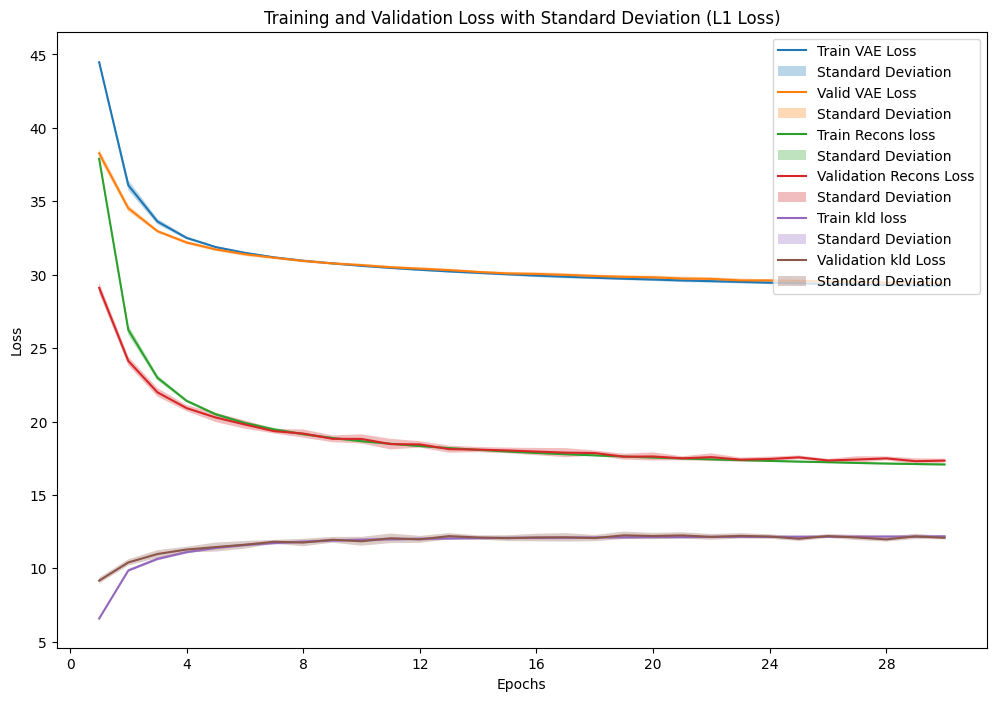

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_6_8_3 = VAE_plot_results(fold_results_6_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_6_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_6_8_3['epochs'])
VAE_plot_mean_std(result_data_6_8_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_6_8_3['epochs'])
VAE_plot_mean_std(result_data_6_8_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_6_8_3['epochs'])
VAE_plot_mean_std(result_data_6_8_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_6_8_3['epochs'])
VAE_plot_mean_std(result_data_6_8_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_6_8_3['epochs'])
VAE_plot_mean_std(result_data_6_8_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_6_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_6_8_3['valid_metrics'],
    result_data_6_8_3['test_metrics'],
    result_data_6_8_3['valid_result'],
    result_data_6_8_3['test_result'],
    result_data_6_8_3['recons_valid_result'],
    result_data_6_8_3['recons_test_result'],
    result_data_6_8_3['kld_valid_result'],
    result_data_6_8_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.058835           0.058085            29.434362      29.158209               17.355380         17.355380            12.078982      12.124976
Standard Deviation                 0.000406           0.000465             0.094869       0.082442                0.140242          0.140242             0.106108       0.079810

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.059606,0.058619,29.525130,29.247659
1,2,0.058256,0.057514,29.360470,29.063370
2,3,0.059067,0.058029,29.633484,29.166221
3,4,0.058209,0.057421,29.363555,29.091397
4,5,0.058912,0.057928,29.507515,29.171257
5,6,0.059148,0.058506,29.397706,29.197545
6,7,0.058725,0.057944,29.421784,29.113469
7,8,0.058602,0.057598,29.469878,29.012362
8,9,0.058702,0.058573,29.296074,29.237384
9,10,0.059123,0.058721,29.368026,29.281431


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_6_8 = sum(p.numel() for p in models_6_8[0].parameters())
print(f"Number of parameters in the model: {total_params_6_8}")

Number of parameters in the model: 748000


## Test 4 VAE: BCE

### Experiment 4.6 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=2, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_6 = 'VAE'
model_config_4_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_6, fold_results_4_6 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_6),
                                                model_config=model_config_4_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:183.041961, Training Recons Loss: 177.831814, Training KLD Loss: 5.210147
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.04985865899064439, 'L1 Loss': 0.1156283697073764, 'BCE': 0.20850549004179367}, Validation VAE Loss: {'MSE': 168.3916109774975, 'L1 Loss': 168.37564021983044, 'BCE': 168.34027846316073}, Validation Recons Loss: {'MSE': 163.51963724988573, 'L1 Loss': 163.5036666545462, 'BCE': 163.4683048978765}, Validation KLD Loss: {'MSE': 4.87197305801067, 'L1 Loss': 4.87197305801067, 'BCE': 4.87197305801067}
Train Fold/Epoch: 1/2, Training Loss:165.023776, Training Recons Loss: 159.907110, Training KLD Loss: 5.116666
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.04705386462205268, 'L1 Loss': 0.11037248594963804, 'BCE': 0.2008462870057593}, Validation VAE Loss: {'MSE': 162.60527

## Visualizing reconstructions for all fold

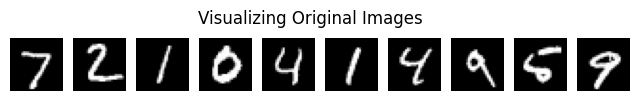

Visualizing reconstructions for fold 1


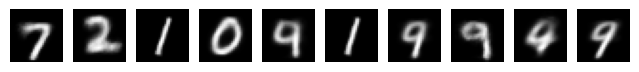

Visualizing reconstructions for fold 2


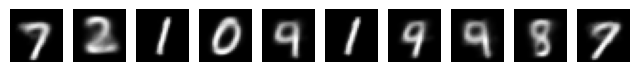

Visualizing reconstructions for fold 3


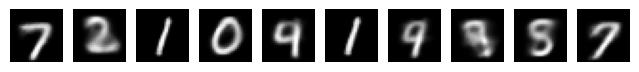

Visualizing reconstructions for fold 4


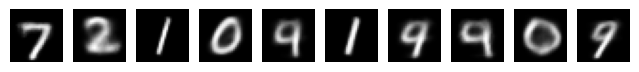

Visualizing reconstructions for fold 5


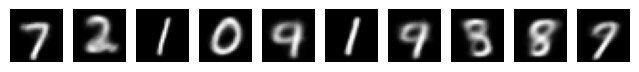

Visualizing reconstructions for fold 6


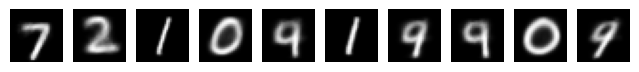

Visualizing reconstructions for fold 7


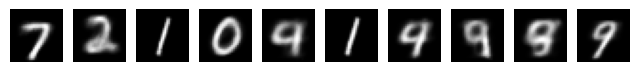

Visualizing reconstructions for fold 8


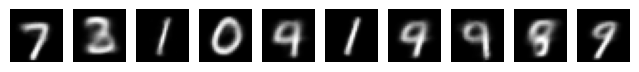

Visualizing reconstructions for fold 9


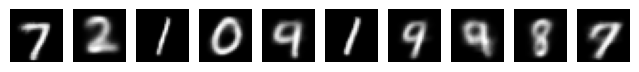

Visualizing reconstructions for fold 10


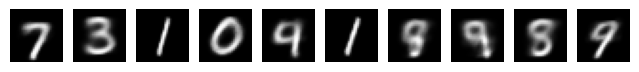

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

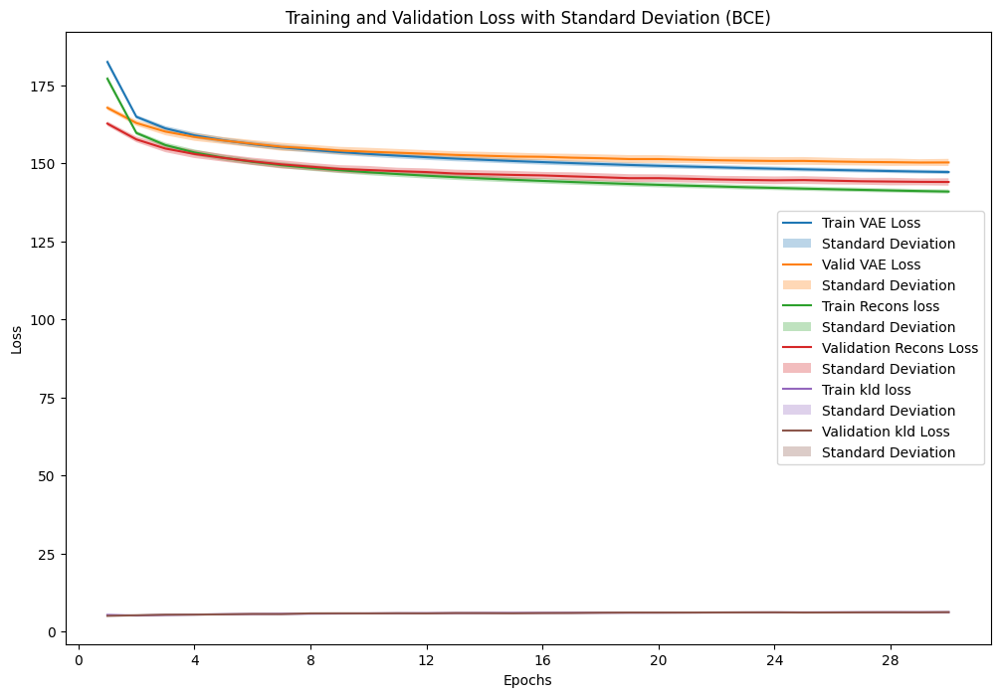

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_6_1 = VAE_plot_results(fold_results_4_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_6_1['epochs'])
VAE_plot_mean_std(result_data_4_6_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_6_1['epochs'])
VAE_plot_mean_std(result_data_4_6_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_6_1['epochs'])
VAE_plot_mean_std(result_data_4_6_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_6_1['epochs'])
VAE_plot_mean_std(result_data_4_6_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_6_1['epochs'])
VAE_plot_mean_std(result_data_4_6_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_6_1['valid_metrics'],
    result_data_4_6_1['test_metrics'],
    result_data_4_6_1['valid_result'],
    result_data_4_6_1['test_result'],
    result_data_4_6_1['recons_valid_result'],
    result_data_4_6_1['recons_test_result'],
    result_data_4_6_1['kld_valid_result'],
    result_data_4_6_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.183637           0.183448           150.221329     150.050493              143.971144        143.971144             6.250185       6.226949
Standard Deviation                 0.001529           0.001187             1.171587       0.966710                1.198610          1.198610             0.145799       0.152433

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.183594,0.183089,150.046089,149.637573
1,2,0.183132,0.183210,149.976851,150.025442
2,3,0.184710,0.183676,150.802622,149.942795
3,4,0.184496,0.185319,150.959862,151.590495
4,5,0.182892,0.183023,149.669072,149.730144
5,6,0.185839,0.185431,152.128458,151.795472
6,7,0.183426,0.183440,149.946948,149.923595
7,8,0.185641,0.183719,151.732907,150.186213
8,9,0.182031,0.181211,148.895021,148.261370
9,10,0.180606,0.182367,148.055461,149.411832


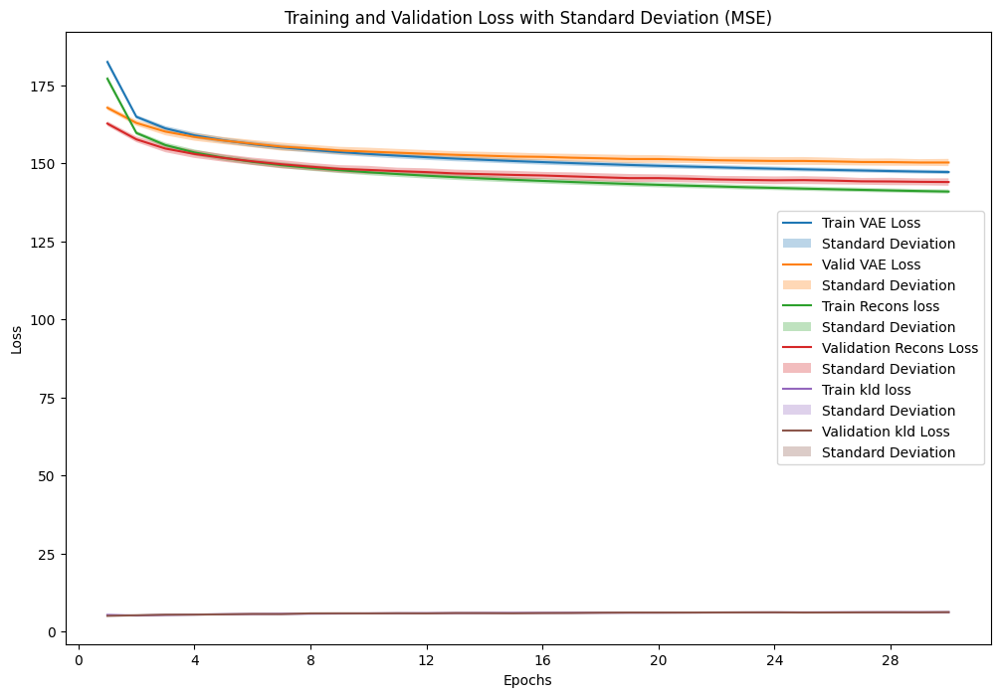

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_6_2 = VAE_plot_results(fold_results_4_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_6_2['epochs'])
VAE_plot_mean_std(result_data_4_6_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_6_2['epochs'])
VAE_plot_mean_std(result_data_4_6_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_6_2['epochs'])
VAE_plot_mean_std(result_data_4_6_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_6_2['epochs'])
VAE_plot_mean_std(result_data_4_6_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_6_2['epochs'])
VAE_plot_mean_std(result_data_4_6_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_6_2['valid_metrics'],
    result_data_4_6_2['test_metrics'],
    result_data_4_6_2['valid_result'],
    result_data_4_6_2['test_result'],
    result_data_4_6_2['recons_valid_result'],
    result_data_4_6_2['recons_test_result'],
    result_data_4_6_2['kld_valid_result'],
    result_data_4_6_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.041075           0.041091           150.261359     150.046894              144.011173        144.011173             6.250185       6.226949
Standard Deviation                 0.000547           0.000513             1.201884       0.982822                1.226721          1.226721             0.145799       0.152433

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.040914,0.040874,150.061742,149.599721
1,2,0.040802,0.040909,150.021974,150.049789
2,3,0.041419,0.041140,150.829618,149.943106
3,4,0.041417,0.041849,150.991624,151.609503
4,5,0.040930,0.041053,149.702002,149.649522
5,6,0.041987,0.041970,152.256070,151.838870
6,7,0.041240,0.041270,149.966684,149.893574
7,8,0.041590,0.041109,151.821139,150.209447
8,9,0.040398,0.040128,148.895880,148.261683
9,10,0.040048,0.040604,148.066854,149.413720


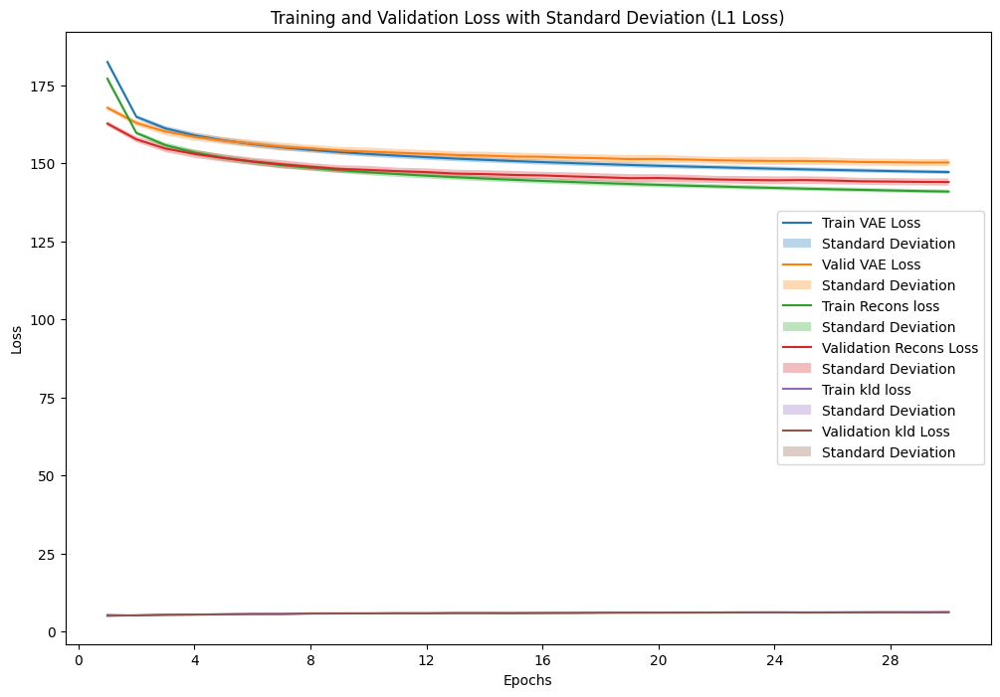

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_6_3 = VAE_plot_results(fold_results_4_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_6_3['epochs'])
VAE_plot_mean_std(result_data_4_6_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_6_3['epochs'])
VAE_plot_mean_std(result_data_4_6_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_6_3['epochs'])
VAE_plot_mean_std(result_data_4_6_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_6_3['epochs'])
VAE_plot_mean_std(result_data_4_6_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_6_3['epochs'])
VAE_plot_mean_std(result_data_4_6_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_6_3['valid_metrics'],
    result_data_4_6_3['test_metrics'],
    result_data_4_6_3['valid_result'],
    result_data_4_6_3['test_result'],
    result_data_4_6_3['recons_valid_result'],
    result_data_4_6_3['recons_test_result'],
    result_data_4_6_3['kld_valid_result'],
    result_data_4_6_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.096430           0.096547           150.235933     150.042607              143.985748        143.985748             6.250185       6.226949
Standard Deviation                 0.000969           0.000872             1.145012       0.943424                1.168446          1.168446             0.145799       0.152433

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.096071,0.096089,150.018543,149.617474
1,2,0.095650,0.095988,150.025278,150.078530
2,3,0.097346,0.097240,150.739886,150.000273
3,4,0.097105,0.097612,150.943710,151.504647
4,5,0.096076,0.096270,149.632449,149.731686
5,6,0.097983,0.097903,152.143156,151.755371
6,7,0.096944,0.096969,149.985138,149.883365
7,8,0.097109,0.096559,151.753793,150.162386
8,9,0.094851,0.094772,148.925567,148.277738
9,10,0.095166,0.096068,148.191811,149.414596


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_6 = sum(p.numel() for p in models_4_6[0].parameters())
print(f"Number of parameters in the model: {total_params_4_6}")

Number of parameters in the model: 620156


<ipython-input-17-14e9441719e3>:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


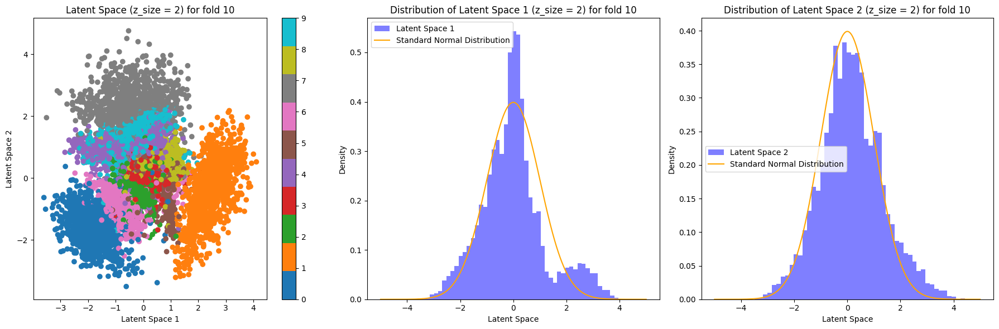

In [ ]:
latent_space_VAE_model(models_4_6[9], test_loader, device, number_fold=10)

### Experiment 3.1 : AE with 2 layer

- Model: VAE of 2 layer, D_x=784, D_z=2, activation is RELU
- Loss: Gaussian likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_9_6 = 'VAE'
model_config_9_6 = {'D_x': 784, 'n_layers': 2, 'D_z': 8, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_9_6, fold_results_9_6 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_9_6),
                                                model_config=model_config_9_6,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:151.022374, Training Recons Loss: 137.896030, Training KLD Loss: 13.126344
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.02761953946282255, 'L1 Loss': 0.07145739687567061, 'BCE': 0.14569253268394064}, Validation VAE Loss: {'MSE': 128.62652928778465, 'L1 Loss': 128.57104962937376, 'BCE': 128.64419352754632}, Validation Recons Loss: {'MSE': 114.20528144024789, 'L1 Loss': 114.14980105136303, 'BCE': 114.22294559884578}, Validation KLD Loss: {'MSE': 14.421247969282435, 'L1 Loss': 14.421247969282435, 'BCE': 14.421247969282435}
Train Fold/Epoch: 1/2, Training Loss:124.973567, Training Recons Loss: 110.274996, Training KLD Loss: 14.698570
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.02517291047471635, 'L1 Loss': 0.0660653949338705, 'BCE': 0.13801157173324138}, Validation VAE Loss: {'MSE

## Visualizing reconstructions for all fold

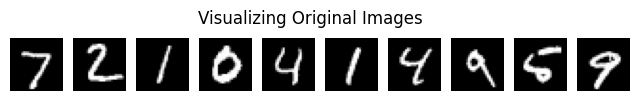

Visualizing reconstructions for fold 1


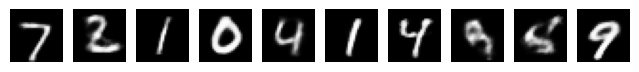

Visualizing reconstructions for fold 2


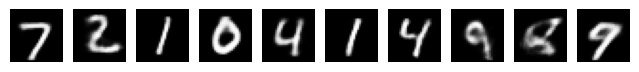

Visualizing reconstructions for fold 3


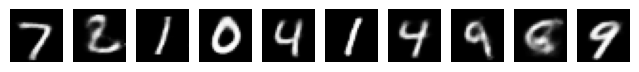

Visualizing reconstructions for fold 4


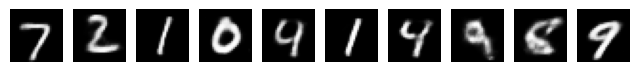

Visualizing reconstructions for fold 5


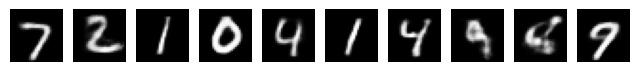

Visualizing reconstructions for fold 6


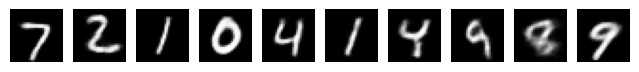

Visualizing reconstructions for fold 7


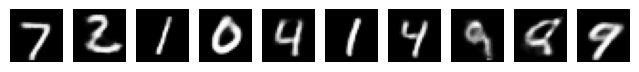

Visualizing reconstructions for fold 8


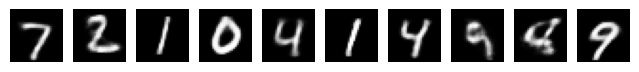

Visualizing reconstructions for fold 9


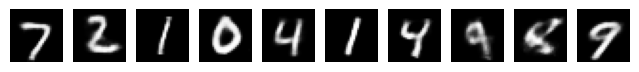

Visualizing reconstructions for fold 10


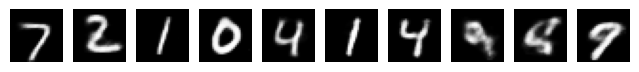

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_9_6):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

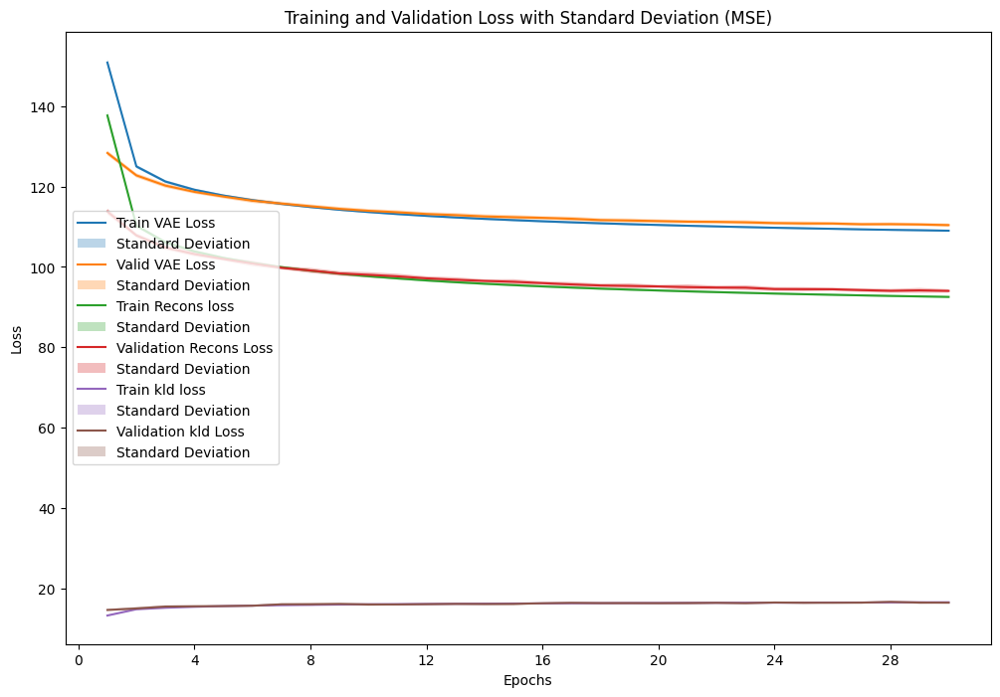

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_9_6_1 = VAE_plot_results(fold_results_9_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_9_6_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_9_6_1['epochs'])
VAE_plot_mean_std(result_data_9_6_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_9_6_1['epochs'])
VAE_plot_mean_std(result_data_9_6_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_9_6_1['epochs'])
VAE_plot_mean_std(result_data_9_6_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_9_6_1['epochs'])
VAE_plot_mean_std(result_data_9_6_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_9_6_1['epochs'])
VAE_plot_mean_std(result_data_9_6_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_9_6_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_9_6_1['valid_metrics'],
    result_data_9_6_1['test_metrics'],
    result_data_9_6_1['valid_result'],
    result_data_9_6_1['test_result'],
    result_data_9_6_1['recons_valid_result'],
    result_data_9_6_1['recons_test_result'],
    result_data_9_6_1['kld_valid_result'],
    result_data_9_6_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.019121            0.01881           110.412514     109.550630               94.024259         94.024259            16.388255      16.440677
Standard Deviation                 0.000158            0.00008             0.420753       0.230826                0.445573          0.445573             0.141703       0.144016

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.019104,0.018758,110.402421,109.372478
1,2,0.019074,0.018729,110.126791,109.289311
2,3,0.019411,0.018946,111.221321,109.962837
3,4,0.018988,0.018802,110.138767,109.626242
4,5,0.019226,0.018880,110.608456,109.752853
5,6,0.018902,0.018718,110.264611,109.336632
6,7,0.019029,0.018704,110.221413,109.367862
7,8,0.019365,0.018916,111.110593,109.591858
8,9,0.019117,0.018812,109.842244,109.348311
9,10,0.018990,0.018836,110.188523,109.857914


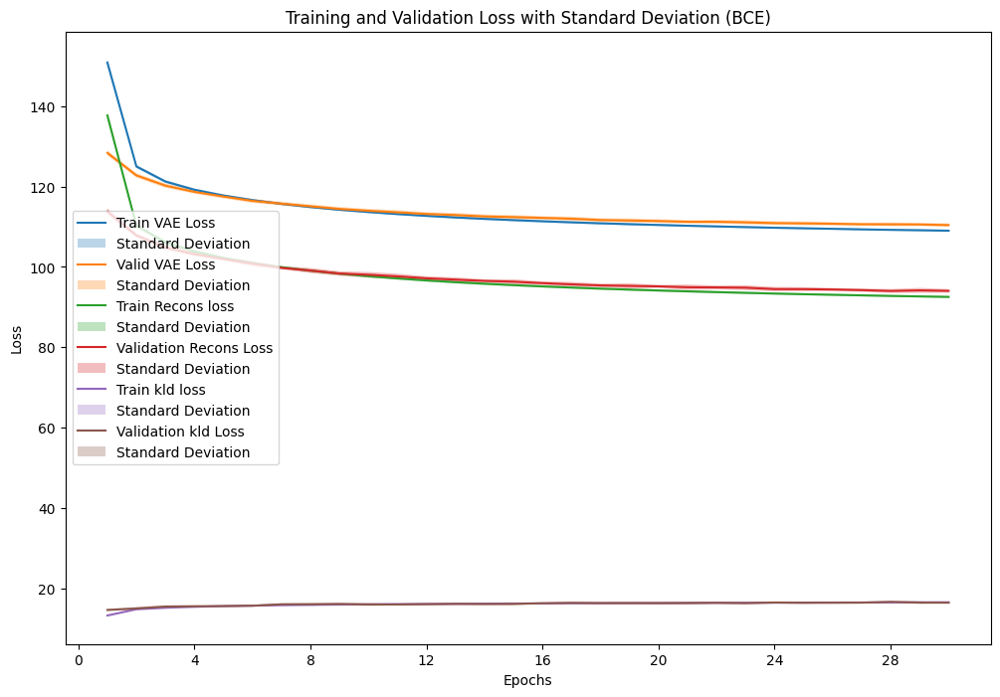

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_9_6_2 = VAE_plot_results(fold_results_9_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_9_6_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_9_6_2['epochs'])
VAE_plot_mean_std(result_data_9_6_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_9_6_2['epochs'])
VAE_plot_mean_std(result_data_9_6_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_9_6_2['epochs'])
VAE_plot_mean_std(result_data_9_6_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_9_6_2['epochs'])
VAE_plot_mean_std(result_data_9_6_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_9_6_2['epochs'])
VAE_plot_mean_std(result_data_9_6_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_9_6_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_9_6_2['valid_metrics'],
    result_data_9_6_2['test_metrics'],
    result_data_9_6_2['valid_result'],
    result_data_9_6_2['test_result'],
    result_data_9_6_2['recons_valid_result'],
    result_data_9_6_2['recons_test_result'],
    result_data_9_6_2['kld_valid_result'],
    result_data_9_6_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.119957           0.118731           110.434303     109.525768               94.046048         94.046048            16.388255      16.440677
Standard Deviation                 0.000582           0.000339             0.431625       0.264896                0.455928          0.455928             0.141703       0.144016

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.120127,0.118587,110.456816,109.330213
1,2,0.119502,0.118396,110.036414,109.222181
2,3,0.121060,0.119476,111.283281,110.052842
3,4,0.119625,0.118770,110.207388,109.610821
4,5,0.120181,0.119049,110.646752,109.811208
5,6,0.119659,0.118385,110.264107,109.295589
6,7,0.119476,0.118322,110.148357,109.318721
7,8,0.120949,0.118978,111.121647,109.541580
8,9,0.119627,0.118713,109.908392,109.304441
9,10,0.119360,0.118635,110.269881,109.770079


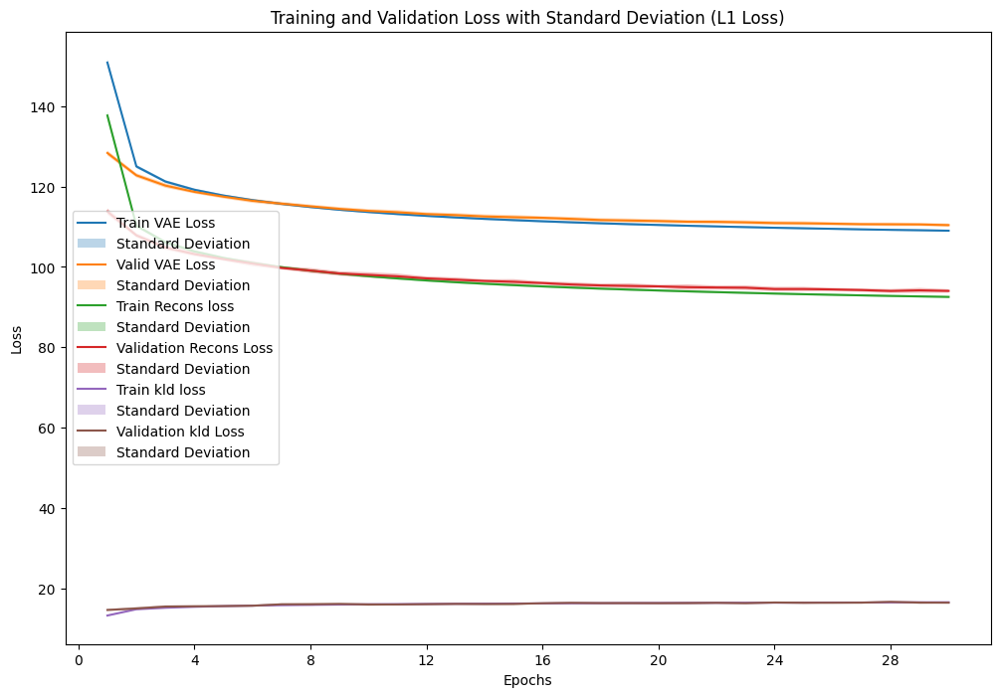

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_9_6_3 = VAE_plot_results(fold_results_9_6, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_9_6_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_9_6_3['epochs'])
VAE_plot_mean_std(result_data_9_6_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_9_6_3['epochs'])
VAE_plot_mean_std(result_data_9_6_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_9_6_3['epochs'])
VAE_plot_mean_std(result_data_9_6_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_9_6_3['epochs'])
VAE_plot_mean_std(result_data_9_6_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_9_6_3['epochs'])
VAE_plot_mean_std(result_data_9_6_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_9_6_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_9_6_3['valid_metrics'],
    result_data_9_6_3['test_metrics'],
    result_data_9_6_3['valid_result'],
    result_data_9_6_3['test_result'],
    result_data_9_6_3['recons_valid_result'],
    result_data_9_6_3['recons_test_result'],
    result_data_9_6_3['kld_valid_result'],
    result_data_9_6_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.052579           0.051854           110.429742     109.541759               94.041487         94.041487            16.388255      16.440677
Standard Deviation                 0.000341           0.000255             0.445302       0.254780                0.464867          0.464867             0.141703       0.144016

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.052472,0.051756,110.429020,109.356574
1,2,0.052254,0.051610,110.136313,109.333275
2,3,0.053269,0.052329,111.263551,110.017409
3,4,0.052321,0.051679,110.217038,109.602836
4,5,0.052955,0.052234,110.617320,109.848294
5,6,0.052317,0.051626,110.290100,109.255782
6,7,0.052331,0.051643,110.205249,109.369318
7,8,0.052968,0.051972,111.174368,109.535120
8,9,0.052297,0.051659,109.762834,109.288967
9,10,0.052601,0.052030,110.201628,109.810018


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_9_6 = sum(p.numel() for p in models_9_6[0].parameters())
print(f"Number of parameters in the model: {total_params_9_6}")

Number of parameters in the model: 632024


### Experiment 3.2 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=8, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_7 = 'VAE'
model_config_4_7 = {'D_x': 784, 'n_layers': 2, 'D_z': 16, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_7, fold_results_4_7 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_7),
                                                model_config=model_config_4_7,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:148.616238, Training Recons Loss: 131.566843, Training KLD Loss: 17.049395
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.021794662414554584, 'L1 Loss': 0.060439365975400235, 'BCE': 0.1291021189474045}, Validation VAE Loss: {'MSE': 121.4674620932721, 'L1 Loss': 121.52794988104638, 'BCE': 121.62772807669133}, Validation Recons Loss: {'MSE': 101.05579546664623, 'L1 Loss': 101.11628317325673, 'BCE': 101.21606136890168}, Validation KLD Loss: {'MSE': 20.41166703244473, 'L1 Loss': 20.41166703244473, 'BCE': 20.41166703244473}
Train Fold/Epoch: 1/2, Training Loss:117.173107, Training Recons Loss: 95.331183, Training KLD Loss: 21.841924
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.018323916169081595, 'L1 Loss': 0.051653121063049805, 'BCE': 0.11770466810211222}, Validation VAE Loss: {'MSE'

## Visualizing reconstructions for all fold

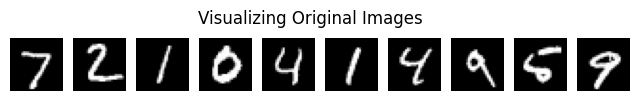

Visualizing reconstructions for fold 1


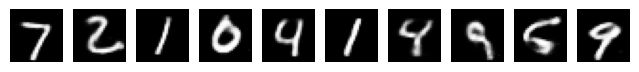

Visualizing reconstructions for fold 2


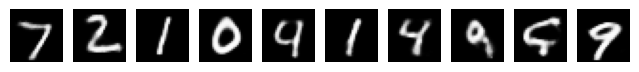

Visualizing reconstructions for fold 3


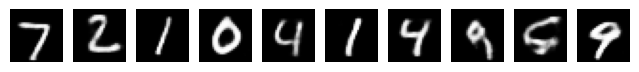

Visualizing reconstructions for fold 4


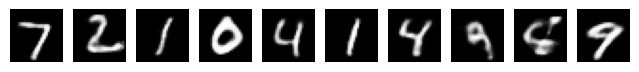

Visualizing reconstructions for fold 5


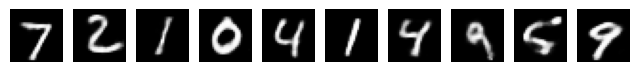

Visualizing reconstructions for fold 6


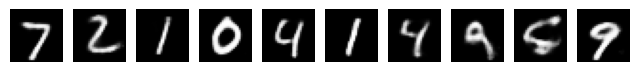

Visualizing reconstructions for fold 7


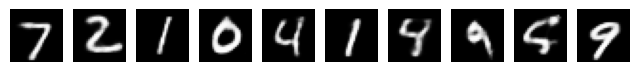

Visualizing reconstructions for fold 8


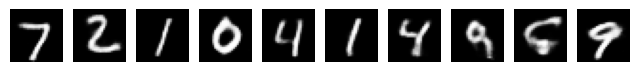

Visualizing reconstructions for fold 9


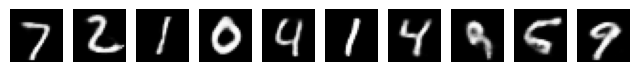

Visualizing reconstructions for fold 10


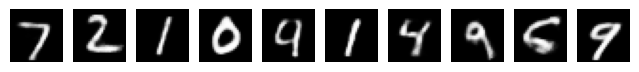

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_7):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

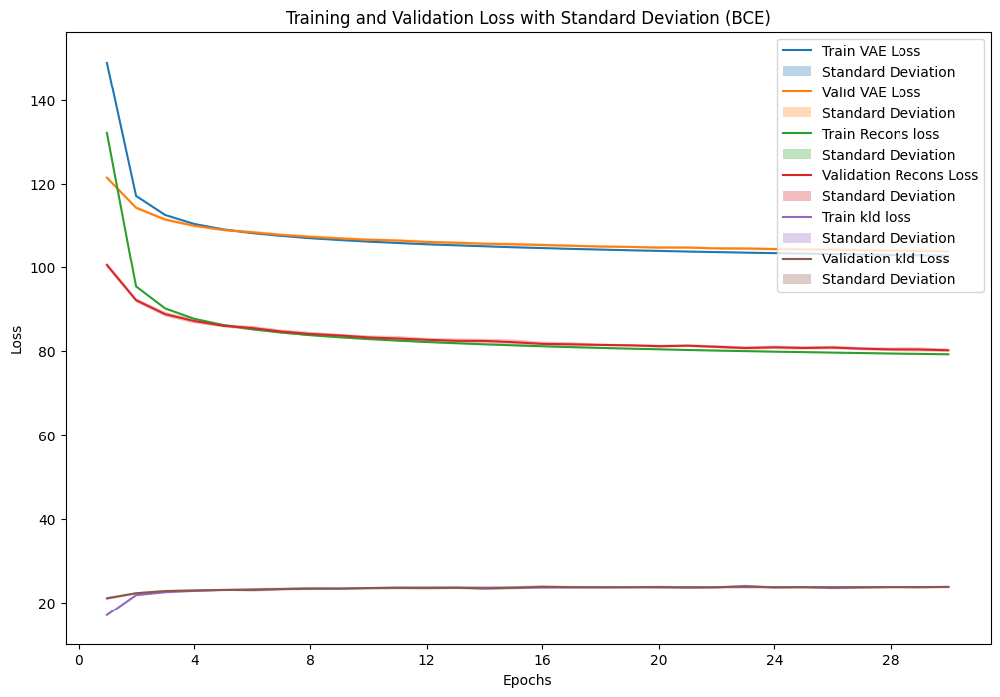

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_7_1 = VAE_plot_results(fold_results_4_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_7_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_7_1['epochs'])
VAE_plot_mean_std(result_data_4_7_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_7_1['epochs'])
VAE_plot_mean_std(result_data_4_7_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_7_1['epochs'])
VAE_plot_mean_std(result_data_4_7_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_7_1['epochs'])
VAE_plot_mean_std(result_data_4_7_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_7_1['epochs'])
VAE_plot_mean_std(result_data_4_7_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_7_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_7_1['valid_metrics'],
    result_data_4_7_1['test_metrics'],
    result_data_4_7_1['valid_result'],
    result_data_4_7_1['test_result'],
    result_data_4_7_1['recons_valid_result'],
    result_data_4_7_1['recons_test_result'],
    result_data_4_7_1['kld_valid_result'],
    result_data_4_7_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.102409           0.101333           104.030862     103.162358               80.288632         80.288632            23.742230      23.717523
Standard Deviation                 0.000495           0.000425             0.257661       0.130305                0.387743          0.387743             0.245897       0.247984

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.102847,0.101569,104.199938,103.205124
1,2,0.102276,0.101440,103.900897,103.217471
2,3,0.102659,0.101379,104.249123,103.163809
3,4,0.103111,0.102041,104.085116,103.195722
4,5,0.102481,0.101215,104.139058,103.120795
5,6,0.101889,0.100680,104.046598,103.061461
6,7,0.102746,0.101701,104.170670,103.338546
7,8,0.102535,0.100902,104.330941,102.905671
8,9,0.102257,0.101668,103.770731,103.367023
9,10,0.101290,0.100733,103.415546,103.047963


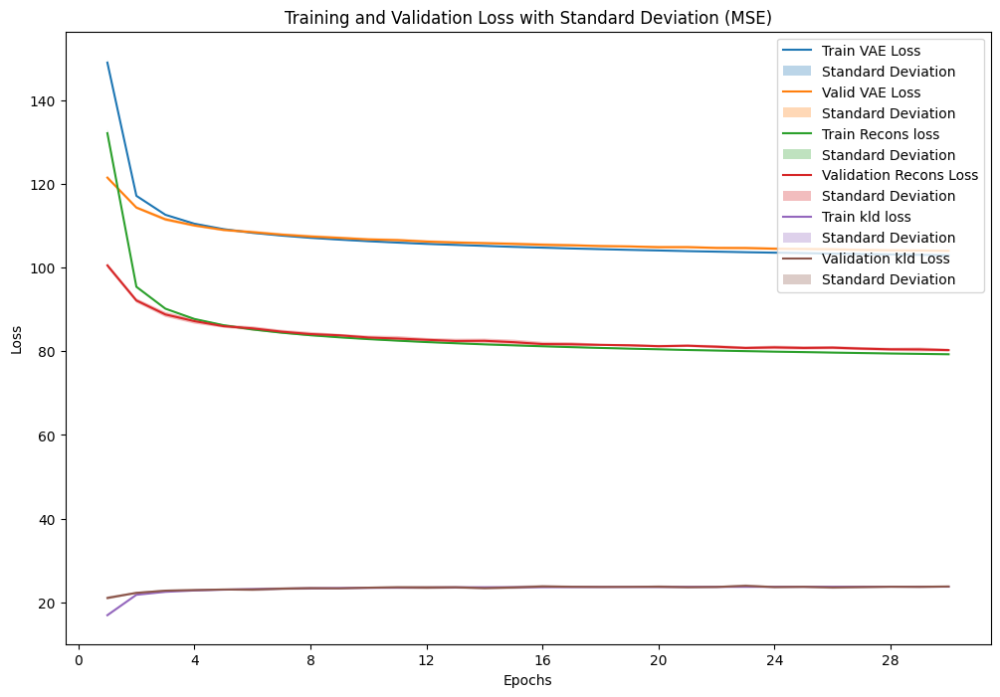

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_7_2 = VAE_plot_results(fold_results_4_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_7_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_7_2['epochs'])
VAE_plot_mean_std(result_data_4_7_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_7_2['epochs'])
VAE_plot_mean_std(result_data_4_7_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_7_2['epochs'])
VAE_plot_mean_std(result_data_4_7_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_7_2['epochs'])
VAE_plot_mean_std(result_data_4_7_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_7_2['epochs'])
VAE_plot_mean_std(result_data_4_7_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_7_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_7_2['valid_metrics'],
    result_data_4_7_2['test_metrics'],
    result_data_4_7_2['valid_result'],
    result_data_4_7_2['test_result'],
    result_data_4_7_2['recons_valid_result'],
    result_data_4_7_2['recons_test_result'],
    result_data_4_7_2['kld_valid_result'],
    result_data_4_7_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.013343           0.013059           104.039397     103.140939               80.297167         80.297167            23.742230      23.717523
Standard Deviation                 0.000154           0.000150             0.241248       0.146034                0.352573          0.352573             0.245897       0.247984

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.013446,0.013151,104.184936,103.210511
1,2,0.013370,0.013062,103.991664,103.123740
2,3,0.013371,0.013082,104.173026,103.170760
3,4,0.013551,0.013312,103.978903,103.193882
4,5,0.013418,0.013078,104.201584,103.198174
5,6,0.013073,0.012820,104.057141,102.969368
6,7,0.013448,0.013187,104.146216,103.342472
7,8,0.013297,0.012909,104.391715,102.878155
8,9,0.013405,0.013147,103.787396,103.336135
9,10,0.013051,0.012843,103.481392,102.986192


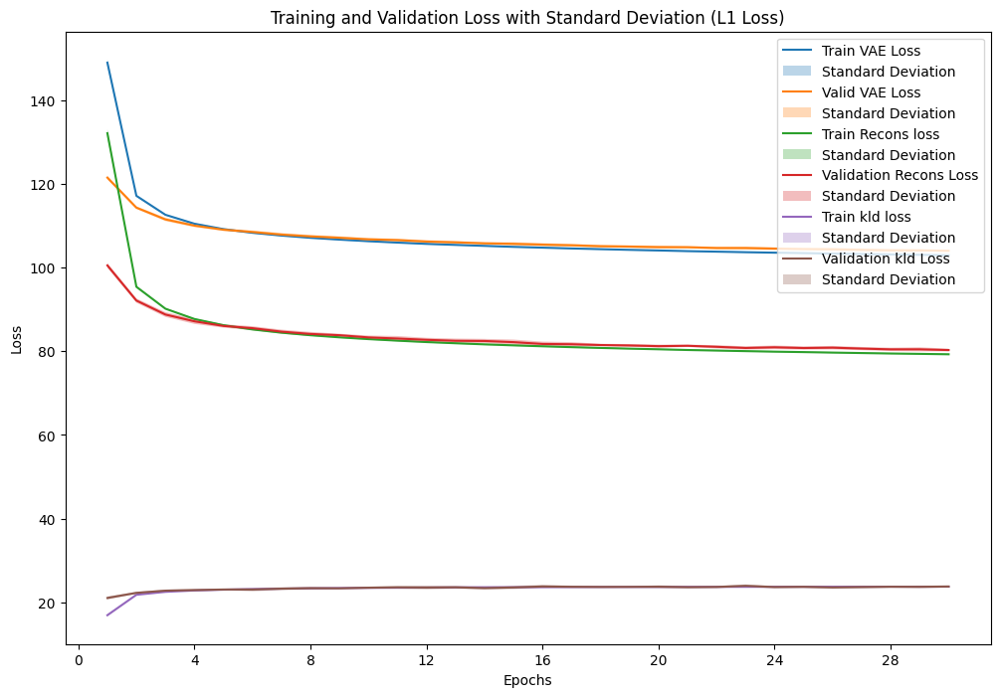

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_7_3 = VAE_plot_results(fold_results_4_7, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_7_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_7_3['epochs'])
VAE_plot_mean_std(result_data_4_7_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_7_3['epochs'])
VAE_plot_mean_std(result_data_4_7_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_7_3['epochs'])
VAE_plot_mean_std(result_data_4_7_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_7_3['epochs'])
VAE_plot_mean_std(result_data_4_7_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_7_3['epochs'])
VAE_plot_mean_std(result_data_4_7_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_7_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_7_3['valid_metrics'],
    result_data_4_7_3['test_metrics'],
    result_data_4_7_3['valid_result'],
    result_data_4_7_3['test_result'],
    result_data_4_7_3['recons_valid_result'],
    result_data_4_7_3['recons_test_result'],
    result_data_4_7_3['kld_valid_result'],
    result_data_4_7_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                  0.04080           0.040218           103.994141     103.128126               80.251911         80.251911            23.742230      23.717523
Standard Deviation                  0.00033           0.000285             0.242581       0.120196                0.393163          0.393163             0.245897       0.247984

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.040974,0.040293,104.154254,103.140978
1,2,0.040802,0.040355,103.805421,103.154969
2,3,0.040715,0.040125,104.144566,103.174865
3,4,0.041330,0.040692,104.142999,103.244886
4,5,0.040977,0.040359,104.056668,103.129000
5,6,0.040343,0.039732,103.996683,102.954203
6,7,0.041078,0.040333,104.185614,103.201514
7,8,0.040838,0.040220,104.259016,102.993026
8,9,0.040818,0.040363,103.768361,103.335458
9,10,0.040129,0.039703,103.427832,102.952360


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_7 = sum(p.numel() for p in models_4_7[0].parameters())
print(f"Number of parameters in the model: {total_params_4_7}")

Number of parameters in the model: 648016


### Experiment 3.3 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_8 = 'VAE'
model_config_4_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_8, fold_results_4_8 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_8),
                                                model_config=model_config_4_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:152.247446, Training Recons Loss: 134.119190, Training KLD Loss: 18.128257
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.02218920353086705, 'L1 Loss': 0.06083598388160797, 'BCE': 0.13032575847303612}, Validation VAE Loss: {'MSE': 124.36309295004986, 'L1 Loss': 124.3208356816718, 'BCE': 124.52914810180664}, Validation Recons Loss: {'MSE': 102.00933927170773, 'L1 Loss': 101.9670815975108, 'BCE': 102.17539482928336}, Validation KLD Loss: {'MSE': 22.353753860960616, 'L1 Loss': 22.353753860960616, 'BCE': 22.353753860960616}
Train Fold/Epoch: 1/2, Training Loss:118.668033, Training Recons Loss: 94.399628, Training KLD Loss: 24.268406
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.017601474307160428, 'L1 Loss': 0.05058812013173357, 'BCE': 0.11577338543027005}, Validation VAE Loss: {'MSE'

## Visualizing reconstructions for all fold

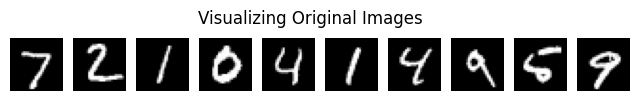

Visualizing reconstructions for fold 1


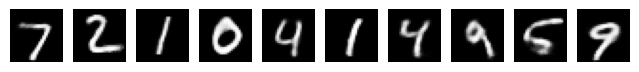

Visualizing reconstructions for fold 2


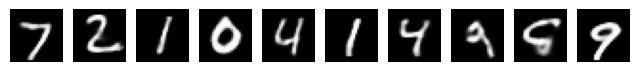

Visualizing reconstructions for fold 3


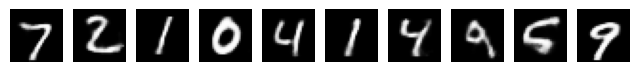

Visualizing reconstructions for fold 4


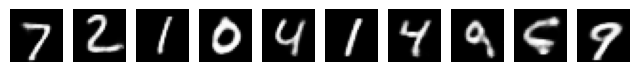

Visualizing reconstructions for fold 5


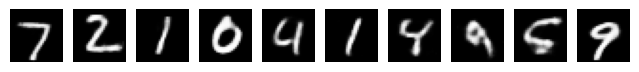

Visualizing reconstructions for fold 6


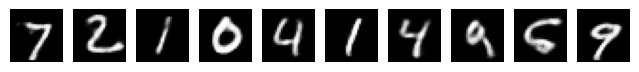

Visualizing reconstructions for fold 7


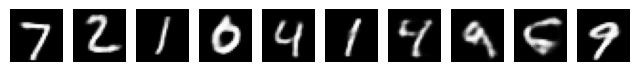

Visualizing reconstructions for fold 8


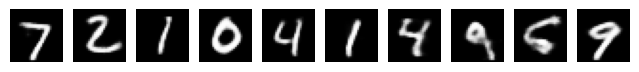

Visualizing reconstructions for fold 9


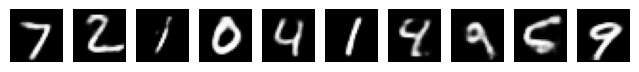

Visualizing reconstructions for fold 10


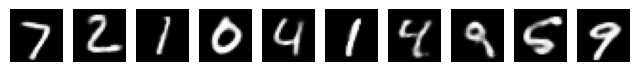

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

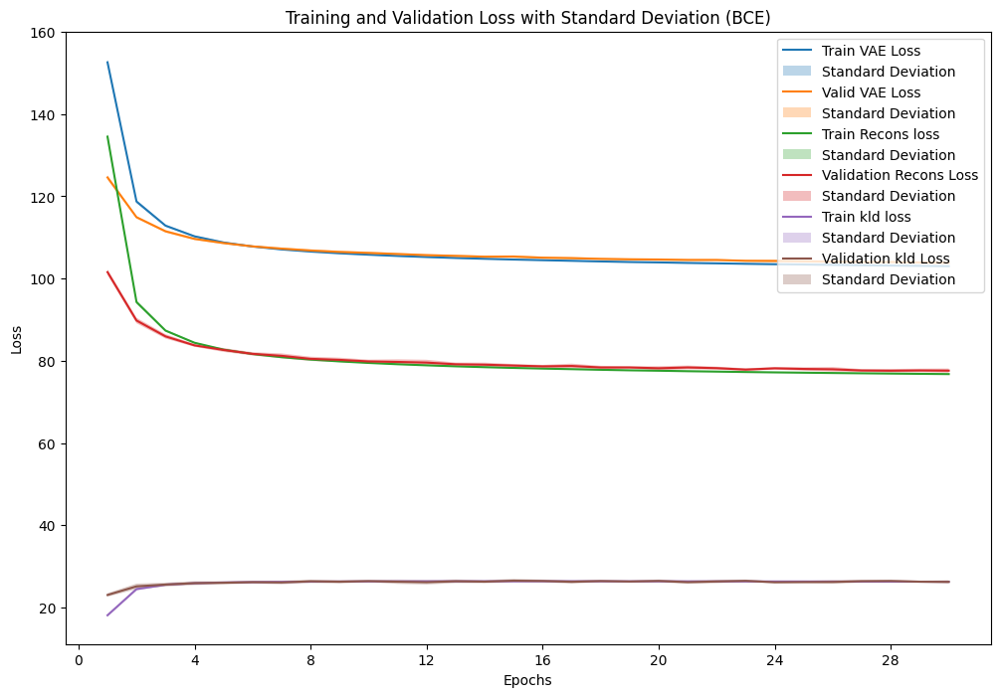

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_8_1 = VAE_plot_results(fold_results_4_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_8_1['epochs'])
VAE_plot_mean_std(result_data_4_8_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_8_1['epochs'])
VAE_plot_mean_std(result_data_4_8_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_8_1['epochs'])
VAE_plot_mean_std(result_data_4_8_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_8_1['epochs'])
VAE_plot_mean_std(result_data_4_8_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_8_1['epochs'])
VAE_plot_mean_std(result_data_4_8_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_8_1['valid_metrics'],
    result_data_4_8_1['test_metrics'],
    result_data_4_8_1['valid_result'],
    result_data_4_8_1['test_result'],
    result_data_4_8_1['recons_valid_result'],
    result_data_4_8_1['recons_test_result'],
    result_data_4_8_1['kld_valid_result'],
    result_data_4_8_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.099006           0.097906           103.841539     102.921108               77.620452         77.620452            26.221087      26.162464
Standard Deviation                 0.000620           0.000575             0.262082       0.139923                0.485720          0.485720             0.405242       0.424350

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.099920,0.098510,104.321792,103.175979
1,2,0.099147,0.098181,103.650522,102.802220
2,3,0.099754,0.098625,104.023666,102.944934
3,4,0.098579,0.097683,103.618838,102.892708
4,5,0.099449,0.098214,103.873091,102.883337
5,6,0.099044,0.097867,103.821444,102.802946
6,7,0.099317,0.098420,103.774435,103.043624
7,8,0.098566,0.096901,104.223800,102.692267
8,9,0.098496,0.097703,103.455217,102.877015
9,10,0.097784,0.096961,103.652590,103.096054


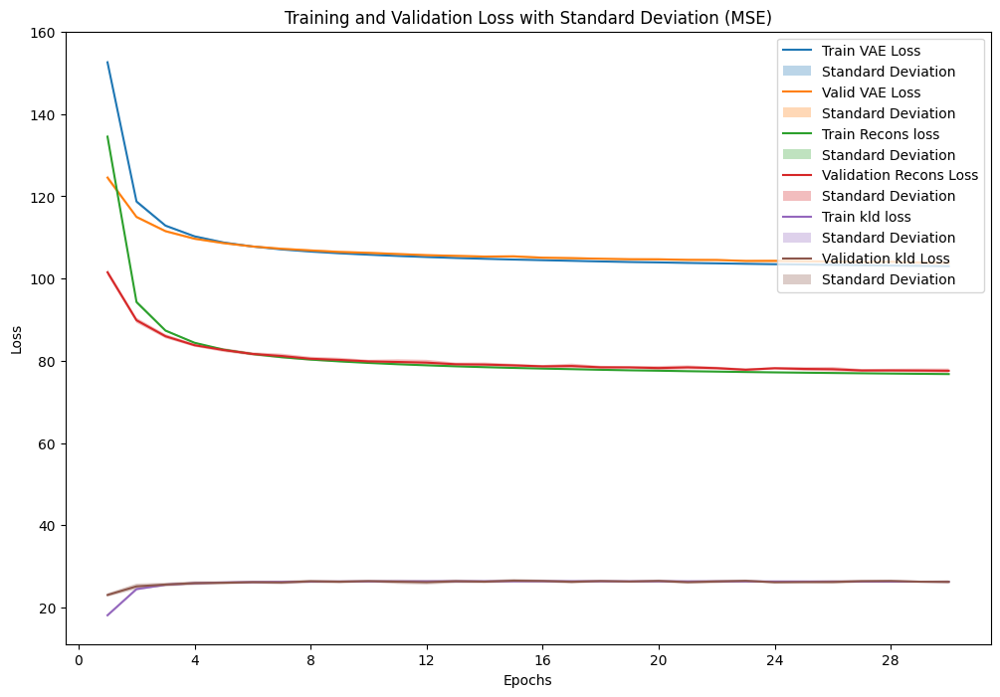

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_8_2 = VAE_plot_results(fold_results_4_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_8_2['epochs'])
VAE_plot_mean_std(result_data_4_8_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_8_2['epochs'])
VAE_plot_mean_std(result_data_4_8_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_8_2['epochs'])
VAE_plot_mean_std(result_data_4_8_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_8_2['epochs'])
VAE_plot_mean_std(result_data_4_8_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_8_2['epochs'])
VAE_plot_mean_std(result_data_4_8_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_8_2['valid_metrics'],
    result_data_4_8_2['test_metrics'],
    result_data_4_8_2['valid_result'],
    result_data_4_8_2['test_result'],
    result_data_4_8_2['recons_valid_result'],
    result_data_4_8_2['recons_test_result'],
    result_data_4_8_2['kld_valid_result'],
    result_data_4_8_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.012216           0.011970           103.780250     102.920703               77.559162         77.559162            26.221087      26.162464
Standard Deviation                 0.000173           0.000172             0.241063       0.122330                0.458143          0.458143             0.405242       0.424350

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.012402,0.012188,104.089198,103.232337
1,2,0.012272,0.012086,103.534050,102.879940
2,3,0.012463,0.012150,104.001949,102.876606
3,4,0.012150,0.011918,103.719013,102.895448
4,5,0.012330,0.012076,103.705064,102.905184
5,6,0.012111,0.011937,103.744700,102.771373
6,7,0.012359,0.012079,103.846575,102.933615
7,8,0.011985,0.011701,104.185402,102.837478
8,9,0.012179,0.011904,103.373854,102.842425
9,10,0.011905,0.011656,103.602692,103.032622


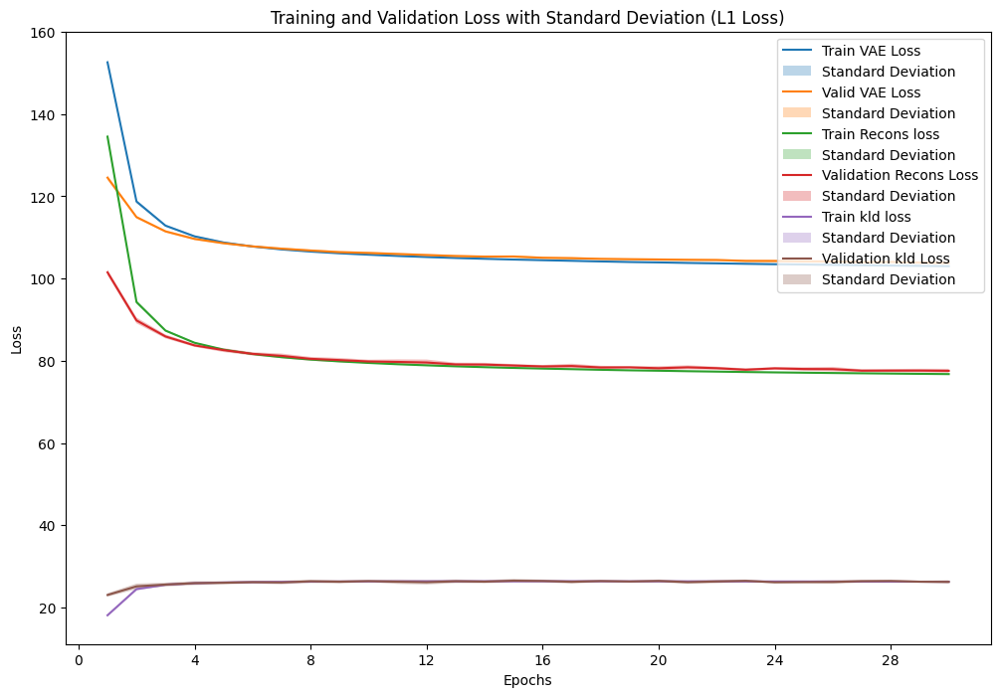

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_8_3 = VAE_plot_results(fold_results_4_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_8_3['epochs'])
VAE_plot_mean_std(result_data_4_8_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_8_3['epochs'])
VAE_plot_mean_std(result_data_4_8_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_8_3['epochs'])
VAE_plot_mean_std(result_data_4_8_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_8_3['epochs'])
VAE_plot_mean_std(result_data_4_8_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_8_3['epochs'])
VAE_plot_mean_std(result_data_4_8_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_8_3['valid_metrics'],
    result_data_4_8_3['test_metrics'],
    result_data_4_8_3['valid_result'],
    result_data_4_8_3['test_result'],
    result_data_4_8_3['recons_valid_result'],
    result_data_4_8_3['recons_test_result'],
    result_data_4_8_3['kld_valid_result'],
    result_data_4_8_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.038563           0.037969           103.829811     102.910510               77.608724         77.608724            26.221087      26.162464
Standard Deviation                 0.000266           0.000251             0.252348       0.129186                0.478390          0.478390             0.405242       0.424350

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.039001,0.038384,104.146573,103.160865
1,2,0.038500,0.037989,103.621896,102.865661
2,3,0.038566,0.037986,104.007703,102.985193
3,4,0.038380,0.037767,103.740949,102.834710
4,5,0.038939,0.038323,103.837139,102.905000
5,6,0.038599,0.038034,103.771599,102.722168
6,7,0.038761,0.038021,103.925216,102.884979
7,8,0.038376,0.037571,104.269606,102.732583
8,9,0.038440,0.037997,103.402019,102.959773
9,10,0.038069,0.037618,103.575413,103.054169


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_8 = sum(p.numel() for p in models_4_8[0].parameters())
print(f"Number of parameters in the model: {total_params_4_8}")

Number of parameters in the model: 680576


### Experiment 3.3 : AE with 1 layer

- Model: VAE of 1 layer, D_x=784, D_z=16, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_5_8 = 'VAE'
model_config_5_8 = {'D_x': 784, 'n_layers': 2, 'D_z': 64, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_5_8, fold_results_5_8 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_5_8),
                                                model_config=model_config_5_8,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:156.874164, Training Recons Loss: 138.785634, Training KLD Loss: 18.088530
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.023589999593318776, 'L1 Loss': 0.0635699516835999, 'BCE': 0.13425642030036194}, Validation VAE Loss: {'MSE': 129.61036170797146, 'L1 Loss': 129.63862942634745, 'BCE': 129.6584738873421}, Validation Recons Loss: {'MSE': 105.20892122958568, 'L1 Loss': 105.23718927261677, 'BCE': 105.25703413943027}, Validation KLD Loss: {'MSE': 24.401440052275962, 'L1 Loss': 24.401440052275962, 'BCE': 24.401440052275962}
Train Fold/Epoch: 1/2, Training Loss:121.961589, Training Recons Loss: 97.520840, Training KLD Loss: 24.440749
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.017961441331166537, 'L1 Loss': 0.05110499357923548, 'BCE': 0.11685334423438032}, Validation VAE Loss: {'MSE

## Visualizing reconstructions for all fold

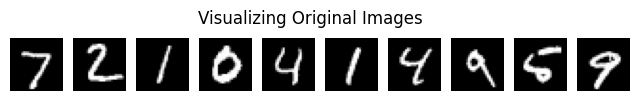

Visualizing reconstructions for fold 1


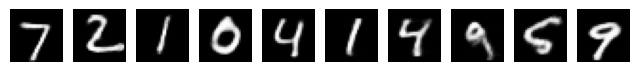

Visualizing reconstructions for fold 2


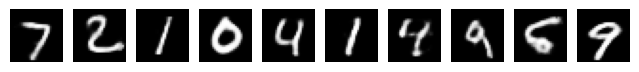

Visualizing reconstructions for fold 3


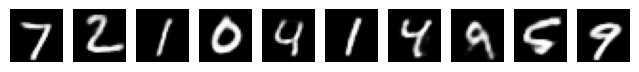

Visualizing reconstructions for fold 4


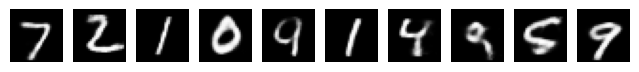

Visualizing reconstructions for fold 5


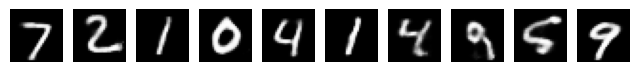

Visualizing reconstructions for fold 6


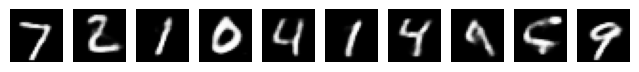

Visualizing reconstructions for fold 7


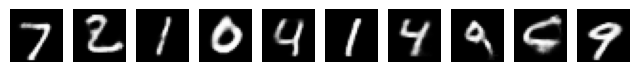

Visualizing reconstructions for fold 8


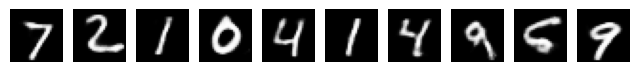

Visualizing reconstructions for fold 9


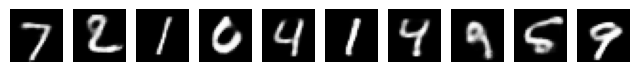

Visualizing reconstructions for fold 10


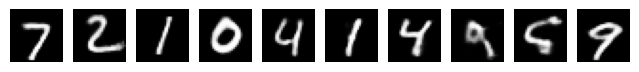

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_5_8):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

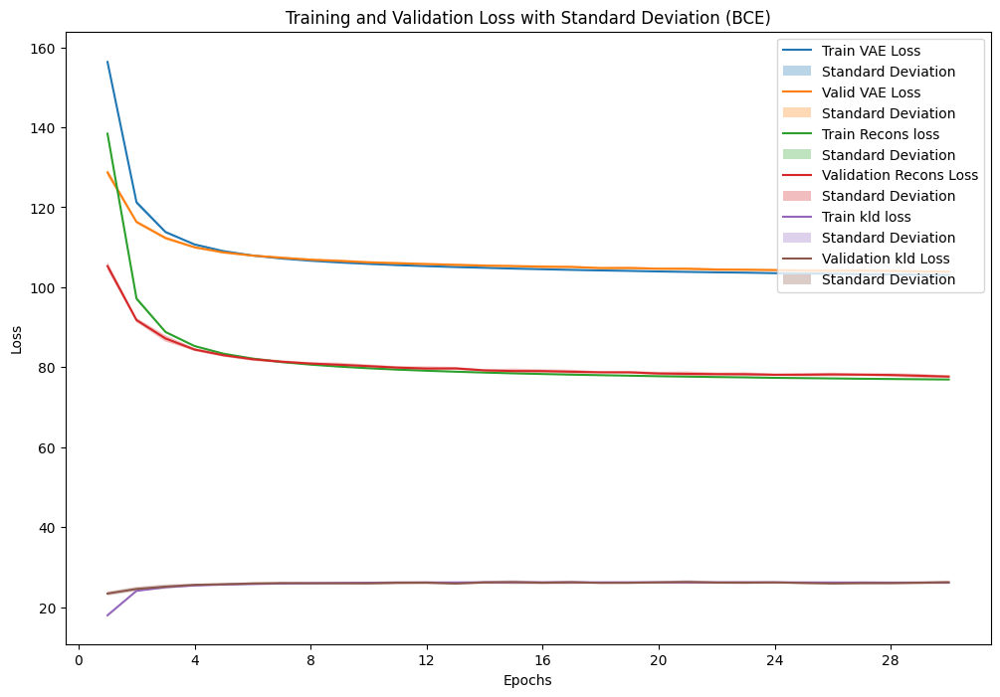

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_5_8_1 = VAE_plot_results(fold_results_5_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_5_8_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_5_8_1['epochs'])
VAE_plot_mean_std(result_data_5_8_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_5_8_1['epochs'])
VAE_plot_mean_std(result_data_5_8_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_5_8_1['epochs'])
VAE_plot_mean_std(result_data_5_8_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_5_8_1['epochs'])
VAE_plot_mean_std(result_data_5_8_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_5_8_1['epochs'])
VAE_plot_mean_std(result_data_5_8_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_5_8_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_5_8_1['valid_metrics'],
    result_data_5_8_1['test_metrics'],
    result_data_5_8_1['valid_result'],
    result_data_5_8_1['test_result'],
    result_data_5_8_1['recons_valid_result'],
    result_data_5_8_1['recons_test_result'],
    result_data_5_8_1['kld_valid_result'],
    result_data_5_8_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.099061           0.098014           103.881620     103.020349               77.663777         77.663777            26.217843      26.177616
Standard Deviation                 0.000346           0.000418             0.380898       0.165628                0.271331          0.271331             0.441727       0.439034

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.098714,0.097319,104.303189,103.261105
1,2,0.098880,0.097928,103.587400,102.795392
2,3,0.099434,0.098341,103.967220,102.939464
3,4,0.099490,0.098662,103.760686,103.063947
4,5,0.098548,0.097542,103.774430,102.962959
5,6,0.098697,0.097493,104.323337,103.308198
6,7,0.099081,0.098249,103.538837,102.831979
7,8,0.099598,0.097995,104.600314,103.162743
8,9,0.099219,0.098387,103.512067,102.906304
9,10,0.098948,0.098221,103.448720,102.971400


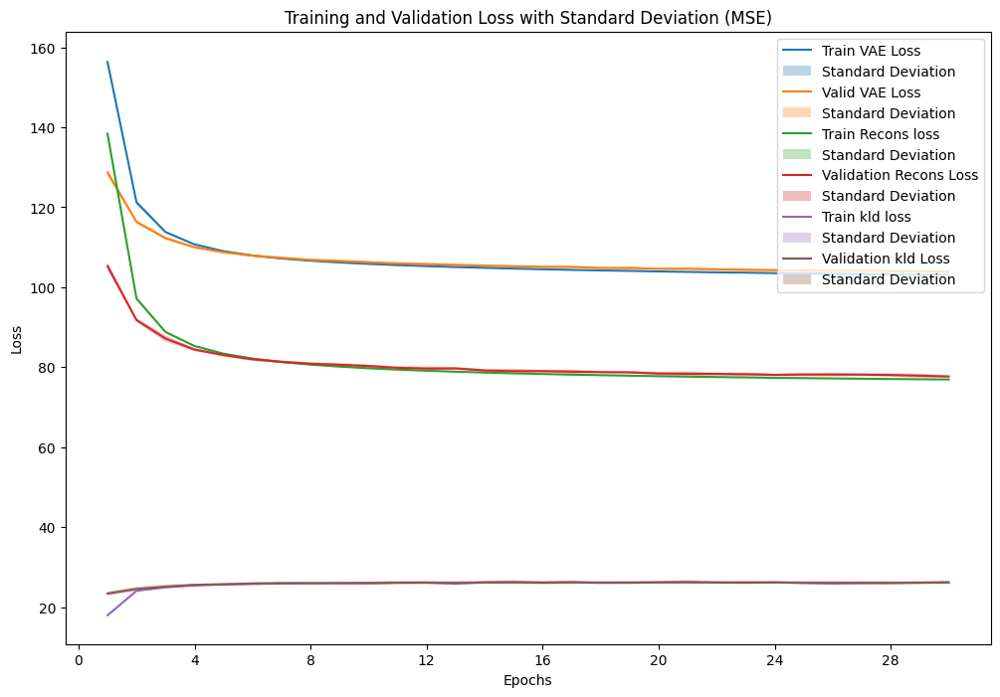

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_5_8_2 = VAE_plot_results(fold_results_5_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_5_8_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_5_8_2['epochs'])
VAE_plot_mean_std(result_data_5_8_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_5_8_2['epochs'])
VAE_plot_mean_std(result_data_5_8_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_5_8_2['epochs'])
VAE_plot_mean_std(result_data_5_8_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_5_8_2['epochs'])
VAE_plot_mean_std(result_data_5_8_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_5_8_2['epochs'])
VAE_plot_mean_std(result_data_5_8_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_5_8_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_5_8_2['valid_metrics'],
    result_data_5_8_2['test_metrics'],
    result_data_5_8_2['valid_result'],
    result_data_5_8_2['test_result'],
    result_data_5_8_2['recons_valid_result'],
    result_data_5_8_2['recons_test_result'],
    result_data_5_8_2['kld_valid_result'],
    result_data_5_8_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.012275           0.012015           103.902314     103.054113               77.684471         77.684471            26.217843      26.177616
Standard Deviation                 0.000129           0.000142             0.383039       0.155472                0.275500          0.275500             0.441727       0.439034

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.012160,0.011819,104.390780,103.328454
1,2,0.012253,0.011981,103.595431,102.792653
2,3,0.012367,0.012166,103.893508,103.067064
3,4,0.012483,0.012192,103.937322,103.021864
4,5,0.012136,0.011871,103.830367,103.031017
5,6,0.012036,0.011780,104.300961,103.214454
6,7,0.012304,0.012081,103.615551,102.858490
7,8,0.012325,0.012008,104.579469,103.215411
8,9,0.012419,0.012155,103.456378,102.976720
9,10,0.012266,0.012098,103.423373,103.035003


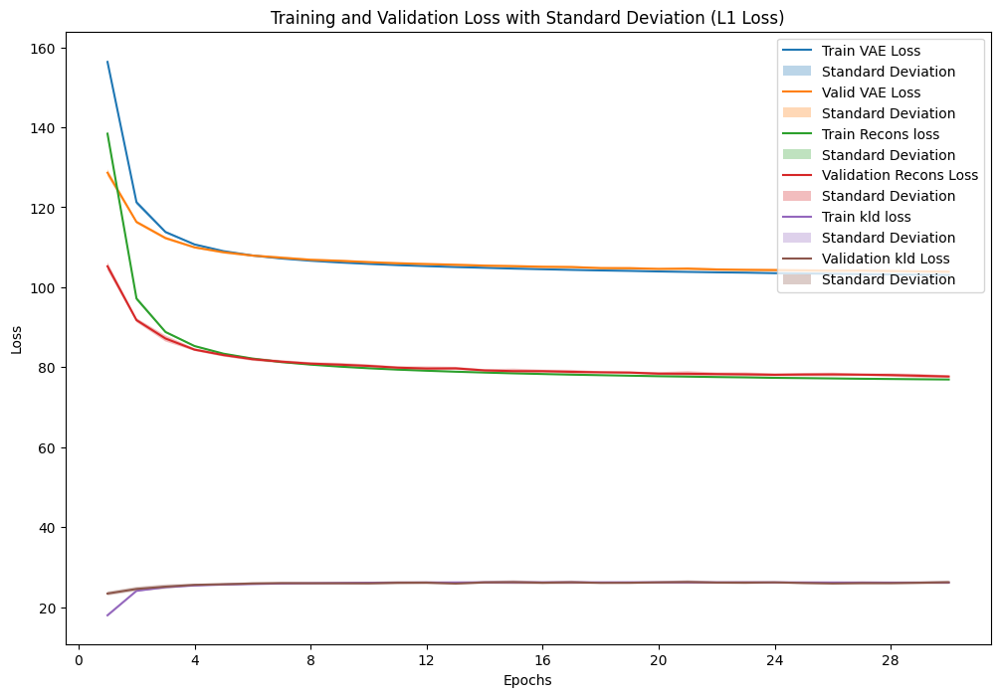

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_5_8_3 = VAE_plot_results(fold_results_5_8, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_5_8_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_5_8_3['epochs'])
VAE_plot_mean_std(result_data_5_8_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_5_8_3['epochs'])
VAE_plot_mean_std(result_data_5_8_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_5_8_3['epochs'])
VAE_plot_mean_std(result_data_5_8_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_5_8_3['epochs'])
VAE_plot_mean_std(result_data_5_8_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_5_8_3['epochs'])
VAE_plot_mean_std(result_data_5_8_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_5_8_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_5_8_3['valid_metrics'],
    result_data_5_8_3['test_metrics'],
    result_data_5_8_3['valid_result'],
    result_data_5_8_3['test_result'],
    result_data_5_8_3['recons_valid_result'],
    result_data_5_8_3['recons_test_result'],
    result_data_5_8_3['kld_valid_result'],
    result_data_5_8_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.038546           0.037974           103.893678     103.046833               77.675835         77.675835            26.217843      26.177616
Standard Deviation                 0.000267           0.000283             0.408351       0.142843                0.296618          0.296618             0.441727       0.439034

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.038411,0.037721,104.271912,103.313705
1,2,0.038365,0.037900,103.588360,102.907282
2,3,0.038757,0.038196,103.876393,102.947584
3,4,0.038882,0.038376,103.721851,102.995138
4,5,0.038100,0.037468,103.748945,102.952787
5,6,0.038157,0.037608,104.359702,103.303301
6,7,0.038786,0.038170,103.825288,102.951728
7,8,0.038852,0.037944,104.723636,103.047969
8,9,0.038614,0.038132,103.374661,102.934556
9,10,0.038533,0.038228,103.446030,103.114283


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_5_8 = sum(p.numel() for p in models_5_8[0].parameters())
print(f"Number of parameters in the model: {total_params_5_8}")

Number of parameters in the model: 748000


### Experiments 3 : VAE with n_layers =4

- We evaluate the performance of both the autoencoder and the variational autoencoder by systematically varying the latent space dimensionality (Dz=2). Additionally, for this assessment, we set the number of layers (n_layer) to be equal to 1, considering likelihoods modeled as Gaussian and Bernoulli.

## Test 4 VAE: BCE

### Experiment 4.6 : AE with 4 layer

- Model: VAE of 4 layer, D_x=784, D_z=2, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_4_9 = 'VAE'
model_config_4_9 = {'D_x': 784, 'n_layers': 4, 'D_z': 2, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_4_9, fold_results_4_9 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_4_9),
                                                model_config=model_config_4_9,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:177.783410, Training Recons Loss: 173.770267, Training KLD Loss: 4.013144
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.04494326529984779, 'L1 Loss': 0.10573723230590211, 'BCE': 0.1951750968682005}, Validation VAE Loss: {'MSE': 158.38338129571144, 'L1 Loss': 158.41853884433178, 'BCE': 158.39170545212767}, Validation Recons Loss: {'MSE': 153.00895236400848, 'L1 Loss': 153.0441099126288, 'BCE': 153.01727619576963}, Validation KLD Loss: {'MSE': 5.374429007793995, 'L1 Loss': 5.374429007793995, 'BCE': 5.374429007793995}
Train Fold/Epoch: 1/2, Training Loss:154.285444, Training Recons Loss: 148.536821, Training KLD Loss: 5.748623
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.04142702779078737, 'L1 Loss': 0.09658118725774135, 'BCE': 0.1853520263065683}, Validation VAE Loss: {'MSE': 151.

## Visualizing reconstructions for all fold

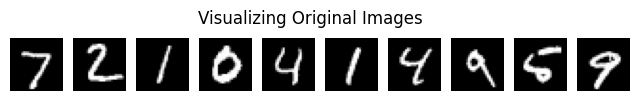

Visualizing reconstructions for fold 1


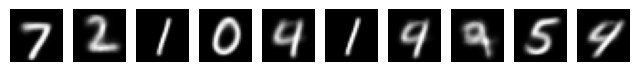

Visualizing reconstructions for fold 2


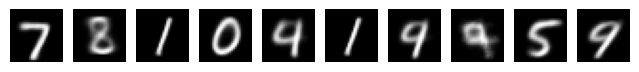

Visualizing reconstructions for fold 3


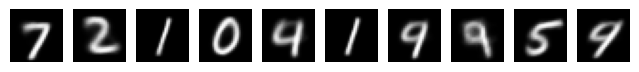

Visualizing reconstructions for fold 4


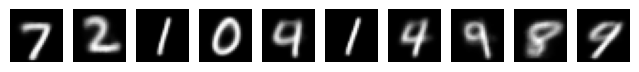

Visualizing reconstructions for fold 5


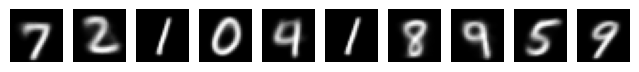

Visualizing reconstructions for fold 6


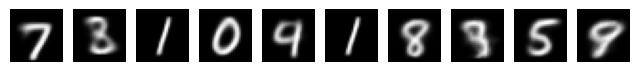

Visualizing reconstructions for fold 7


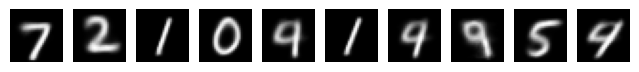

Visualizing reconstructions for fold 8


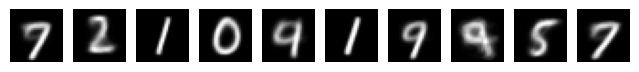

Visualizing reconstructions for fold 9


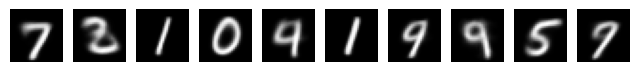

Visualizing reconstructions for fold 10


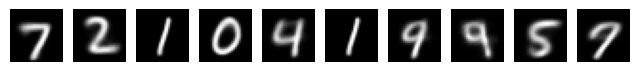

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_4_9):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

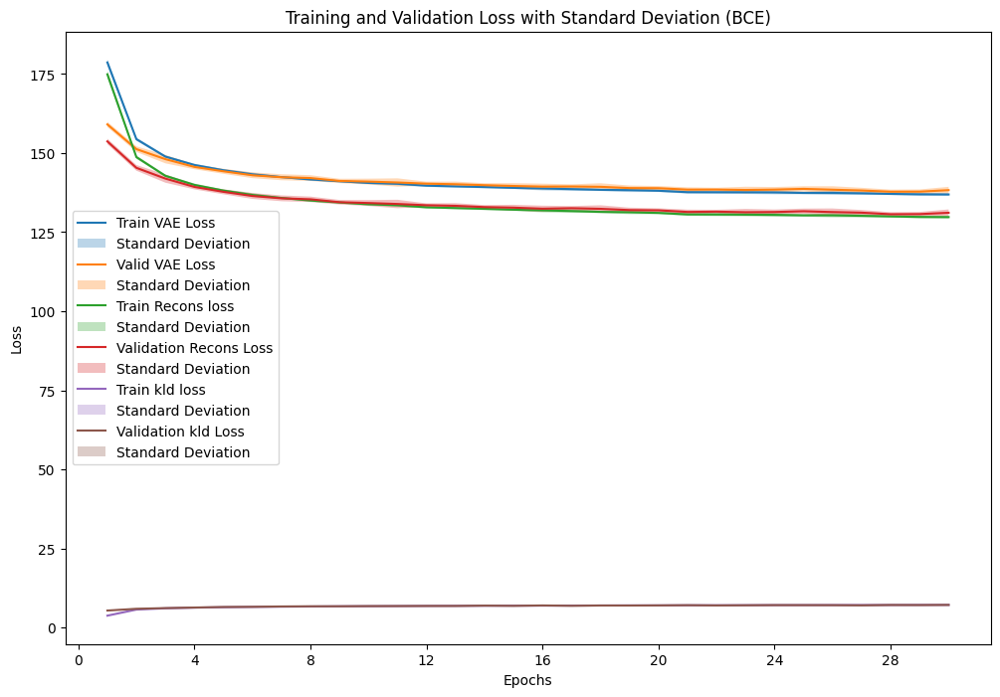

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_4_9_1 = VAE_plot_results(fold_results_4_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_9_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_9_1['epochs'])
VAE_plot_mean_std(result_data_4_9_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_9_1['epochs'])
VAE_plot_mean_std(result_data_4_9_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_9_1['epochs'])
VAE_plot_mean_std(result_data_4_9_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_9_1['epochs'])
VAE_plot_mean_std(result_data_4_9_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_9_1['epochs'])
VAE_plot_mean_std(result_data_4_9_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_9_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_9_1['valid_metrics'],
    result_data_4_9_1['test_metrics'],
    result_data_4_9_1['valid_result'],
    result_data_4_9_1['test_result'],
    result_data_4_9_1['recons_valid_result'],
    result_data_4_9_1['recons_test_result'],
    result_data_4_9_1['kld_valid_result'],
    result_data_4_9_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.167256           0.167123           138.279031     138.169832              131.129051        131.129051             7.149980       7.145443
Standard Deviation                 0.001344           0.000882             1.047600       0.646412                1.053322          1.053322             0.090663       0.091880

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.166953,0.166466,138.178418,137.794636
1,2,0.167098,0.166793,138.298913,138.071474
2,3,0.168751,0.167495,139.483147,138.481033
3,4,0.164377,0.165445,136.030123,136.857594
4,5,0.167411,0.167452,138.358614,138.383322
5,6,0.168602,0.168704,139.224745,139.274447
6,7,0.166848,0.166821,137.830648,137.843921
7,8,0.168757,0.167181,139.509763,138.265515
8,9,0.168083,0.168267,138.834507,138.976919
9,10,0.165684,0.166605,137.041436,137.749461


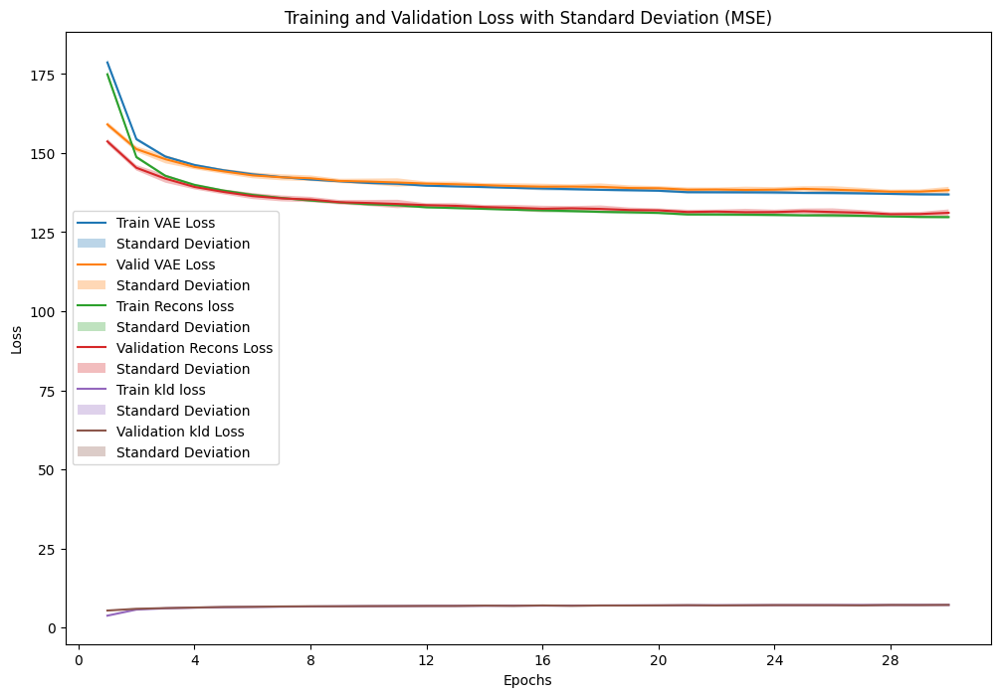

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_4_9_2 = VAE_plot_results(fold_results_4_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_9_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_9_2['epochs'])
VAE_plot_mean_std(result_data_4_9_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_9_2['epochs'])
VAE_plot_mean_std(result_data_4_9_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_9_2['epochs'])
VAE_plot_mean_std(result_data_4_9_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_9_2['epochs'])
VAE_plot_mean_std(result_data_4_9_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_9_2['epochs'])
VAE_plot_mean_std(result_data_4_9_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_9_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_9_2['valid_metrics'],
    result_data_4_9_2['test_metrics'],
    result_data_4_9_2['valid_result'],
    result_data_4_9_2['test_result'],
    result_data_4_9_2['recons_valid_result'],
    result_data_4_9_2['recons_test_result'],
    result_data_4_9_2['kld_valid_result'],
    result_data_4_9_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.035224           0.035276           138.265050     138.184436              131.115070        131.115070             7.149980       7.145443
Standard Deviation                 0.000394           0.000289             1.022657       0.668138                1.025265          1.025265             0.090663       0.091880

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.035161,0.035092,138.252371,137.802075
1,2,0.035175,0.035167,138.206706,138.130289
2,3,0.035723,0.035407,139.535194,138.575912
3,4,0.034296,0.034671,136.081994,136.852280
4,5,0.035261,0.035425,138.247783,138.397868
5,6,0.035513,0.035776,139.142803,139.297596
6,7,0.035121,0.035188,137.742225,137.869504
7,8,0.035608,0.035225,139.533149,138.153958
8,9,0.035500,0.035617,138.738422,139.062094
9,10,0.034887,0.035188,137.169852,137.702788


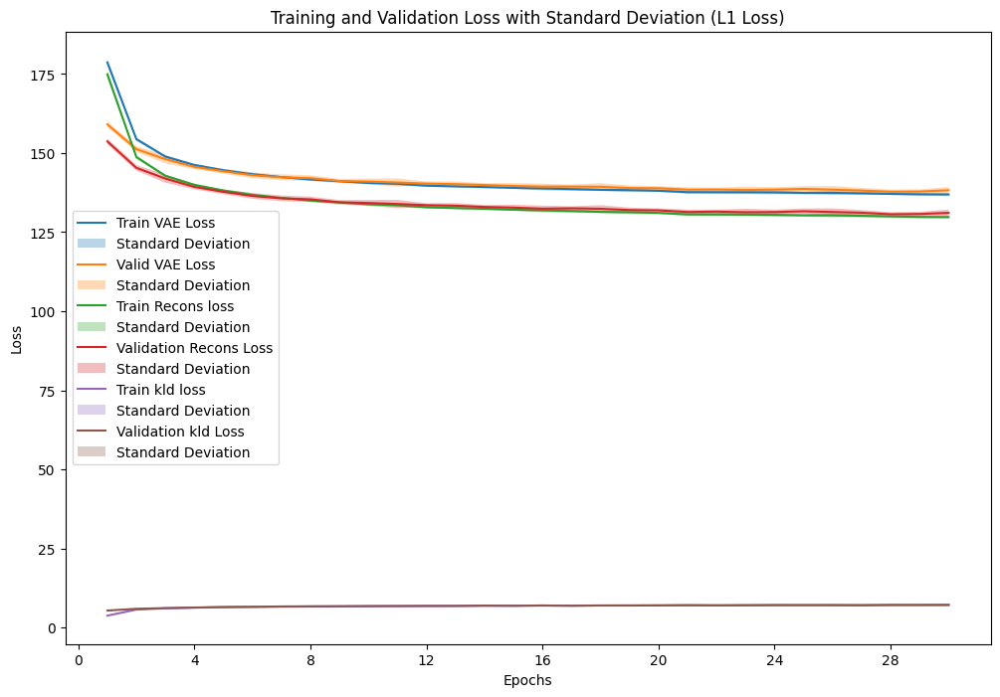

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_4_9_3 = VAE_plot_results(fold_results_4_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_4_9_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_4_9_3['epochs'])
VAE_plot_mean_std(result_data_4_9_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_4_9_3['epochs'])
VAE_plot_mean_std(result_data_4_9_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_4_9_3['epochs'])
VAE_plot_mean_std(result_data_4_9_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_4_9_3['epochs'])
VAE_plot_mean_std(result_data_4_9_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_4_9_3['epochs'])
VAE_plot_mean_std(result_data_4_9_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_4_9_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_4_9_3['valid_metrics'],
    result_data_4_9_3['test_metrics'],
    result_data_4_9_3['valid_result'],
    result_data_4_9_3['test_result'],
    result_data_4_9_3['recons_valid_result'],
    result_data_4_9_3['recons_test_result'],
    result_data_4_9_3['kld_valid_result'],
    result_data_4_9_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.084856           0.084931           138.271356     138.175559              131.121376        131.121376             7.149980       7.145443
Standard Deviation                 0.000707           0.000579             1.057447       0.643249                1.062301          1.062301             0.090663       0.091880

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.084712,0.084685,138.185034,137.761566
1,2,0.084300,0.084289,138.253334,138.155465
2,3,0.084583,0.084139,139.620137,138.492939
3,4,0.083571,0.084104,136.018600,136.866882
4,5,0.085299,0.085507,138.353440,138.419239
5,6,0.085444,0.085603,139.179003,139.288751
6,7,0.084943,0.084894,137.826120,137.917778
7,8,0.086254,0.085544,139.478102,138.130580
8,9,0.085179,0.085568,138.771398,138.959761
9,10,0.084275,0.084973,137.028390,137.762630


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_4_9 = sum(p.numel() for p in models_4_9[0].parameters())
print(f"Number of parameters in the model: {total_params_4_9}")

Number of parameters in the model: 1546470


<ipython-input-9-14e9441719e3>:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = plt.cm.get_cmap('tab10', len(np.unique(labels)))


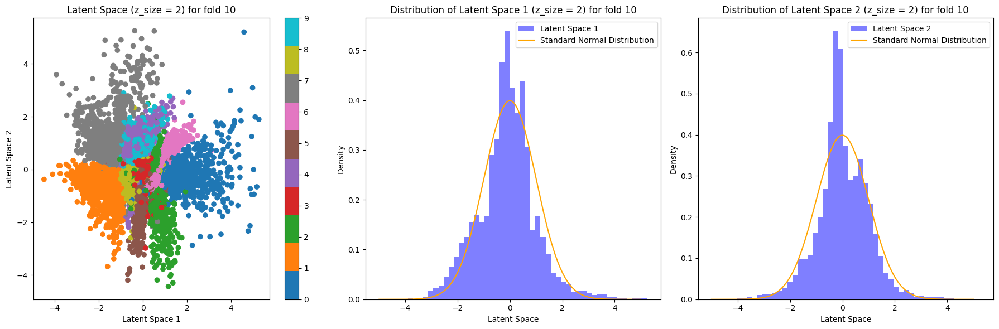

In [ ]:
latent_space_VAE_model(models_4_9[9], test_loader, device, number_fold=10)

### Experiment 4.7 : AE with 4 layer

- Model: VAE of 4 layer, D_x=784, D_z=32, activation is RELU
- Loss: Bernoulli likelihood
- Training with ADAM, LR=1e-3, for 30 epochs

In [ ]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
VAE_model_name_7_9 = 'VAE'
model_config_7_9 = {'D_x': 784, 'n_layers': 4, 'D_z': 32, 'activation': nn.ReLU}
learning_rate = 1e-3
batch_size=64
training_setup = {
    # Adam optimizer with given learning rate
    # 'optimizer' : torch.optim.Adam(
    #     AE_model_1.parameters(), # Model parameters
    #     learning_rate #LR
    #   ),
    'epochs' : 30,
    'criterion' : VAE_criterion,
    'device' : device,
    'VAE_likelihood' : 'bernoulli'
}
# Define a dataset
train_dataset = train_loader.dataset
test_dataset = test_loader.dataset
models_7_9, fold_results_7_9 = VAE_k_fold_cross_validation(
                                                model_class=getattr(sys.modules[__name__], VAE_model_name_7_9),
                                                model_config=model_config_7_9,
                                                train_dataset =train_dataset,
                                                test_dataset = test_dataset,
                                                VAE_criterion= VAE_criterion,
                                                learning_rate=learning_rate,
                                                training_setup= training_setup,
                                                beta=1,
                                                L=1,
                                                k_folds=10,
                                                batch_size=batch_size,
                                                eval_criterions={
                                                'MSE': torch.nn.MSELoss(),
                                                'L1 Loss': torch.nn.L1Loss(),
                                                'BCE': torch.nn.BCELoss()
                                                      })

Fold 1/10
54000
6000
Dataset MNIST
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: ToTensor()
Train Fold/Epoch: 1/1, Training Loss:175.979514, Training Recons Loss: 170.345603, Training KLD Loss: 5.633911
Validation Fold/Epoch: 1/1,  Validation Loss: {'MSE': 0.03790616882132723, 'L1 Loss': 0.08986837955865454, 'BCE': 0.17348705026063513}, Validation VAE Loss: {'MSE': 144.5987886469415, 'L1 Loss': 144.65148503729637, 'BCE': 144.4433556414665}, Validation Recons Loss: {'MSE': 136.16928011305788, 'L1 Loss': 136.22197625992146, 'BCE': 136.01384678292783}, Validation KLD Loss: {'MSE': 8.429508929556988, 'L1 Loss': 8.429508929556988, 'BCE': 8.429508929556988}
Train Fold/Epoch: 1/2, Training Loss:137.541856, Training Recons Loss: 127.745936, Training KLD Loss: 9.795920
Validation Fold/Epoch: 1/2,  Validation Loss: {'MSE': 0.030794175381356096, 'L1 Loss': 0.07576723468113453, 'BCE': 0.15386323266206903}, Validation VAE Loss: {'MSE': 13

## Visualizing reconstructions for all fold

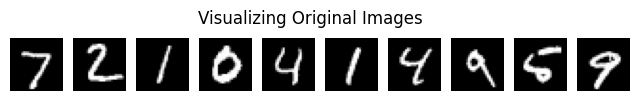

Visualizing reconstructions for fold 1


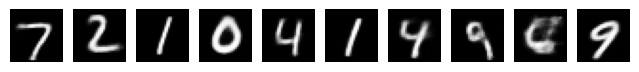

Visualizing reconstructions for fold 2


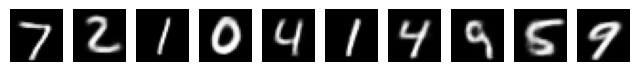

Visualizing reconstructions for fold 3


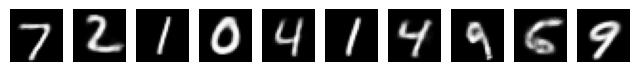

Visualizing reconstructions for fold 4


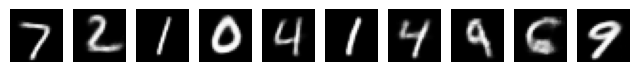

Visualizing reconstructions for fold 5


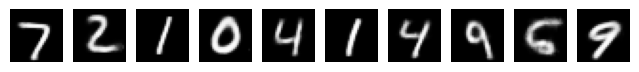

Visualizing reconstructions for fold 6


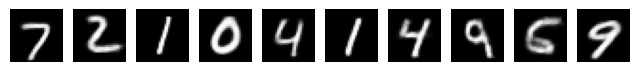

Visualizing reconstructions for fold 7


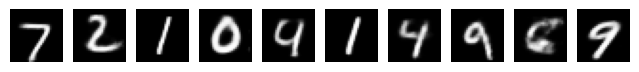

Visualizing reconstructions for fold 8


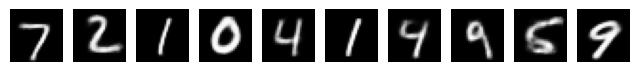

Visualizing reconstructions for fold 9


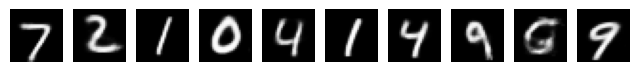

Visualizing reconstructions for fold 10


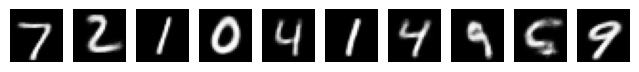

In [ ]:
VAE_visualize_original_images(test_loader, img_shape=(28, 28))
for fold_index, model_to_visualize in enumerate(models_7_9):
    print(f"Visualizing reconstructions for fold {fold_index + 1}")
    VAE_visualize_reconstructions(model_to_visualize, test_loader, img_shape, L=1, device=device, num_samples=10, fold_index=fold_index + 1, figure_size=(8, 2))


### Plot Training Loss and Validation Loss functions with Standard Deviation

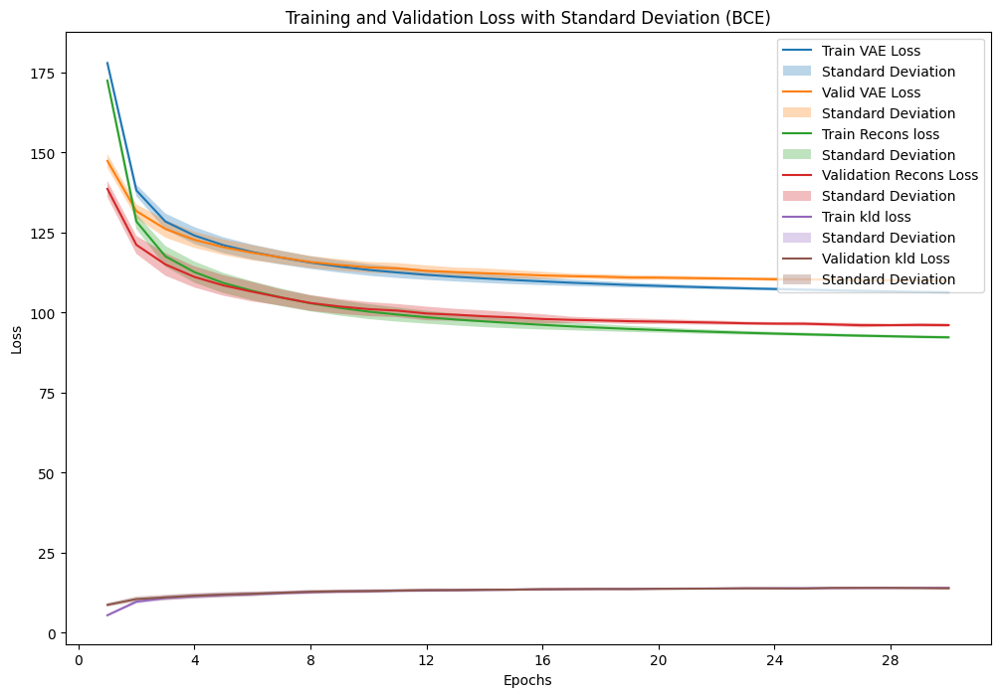

In [ ]:
loss_type_to_plot = 'BCE'   # We can change this to our desired loss type
result_data_7_9_1 = VAE_plot_results(fold_results_7_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_7_9_1['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_7_9_1['epochs'])
VAE_plot_mean_std(result_data_7_9_1['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_7_9_1['epochs'])
VAE_plot_mean_std(result_data_7_9_1['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_7_9_1['epochs'])
VAE_plot_mean_std(result_data_7_9_1['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_7_9_1['epochs'])
VAE_plot_mean_std(result_data_7_9_1['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_7_9_1['epochs'])
VAE_plot_mean_std(result_data_7_9_1['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_7_9_1['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_7_9_1['valid_metrics'],
    result_data_7_9_1['test_metrics'],
    result_data_7_9_1['valid_result'],
    result_data_7_9_1['test_result'],
    result_data_7_9_1['recons_valid_result'],
    result_data_7_9_1['recons_test_result'],
    result_data_7_9_1['kld_valid_result'],
    result_data_7_9_1['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.122626           0.122409           110.035913     109.863334               96.139140         96.139140            13.896774      13.894560
Standard Deviation                 0.000720           0.000471             0.480882       0.310338                0.564591          0.564591             0.284173       0.271409

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.123255,0.122679,110.381042,109.904282
1,2,0.122873,0.122605,110.123196,109.937396
2,3,0.123407,0.122983,110.831663,110.467570
3,4,0.121195,0.121450,109.591284,109.749382
4,5,0.122584,0.122292,109.638107,109.420599
5,6,0.122756,0.122676,109.858878,109.800350
6,7,0.122269,0.121984,109.993061,109.778346
7,8,0.123654,0.122117,110.773132,109.540741
8,9,0.121696,0.122213,109.258688,109.686322
9,10,0.122577,0.123094,109.910083,110.348352


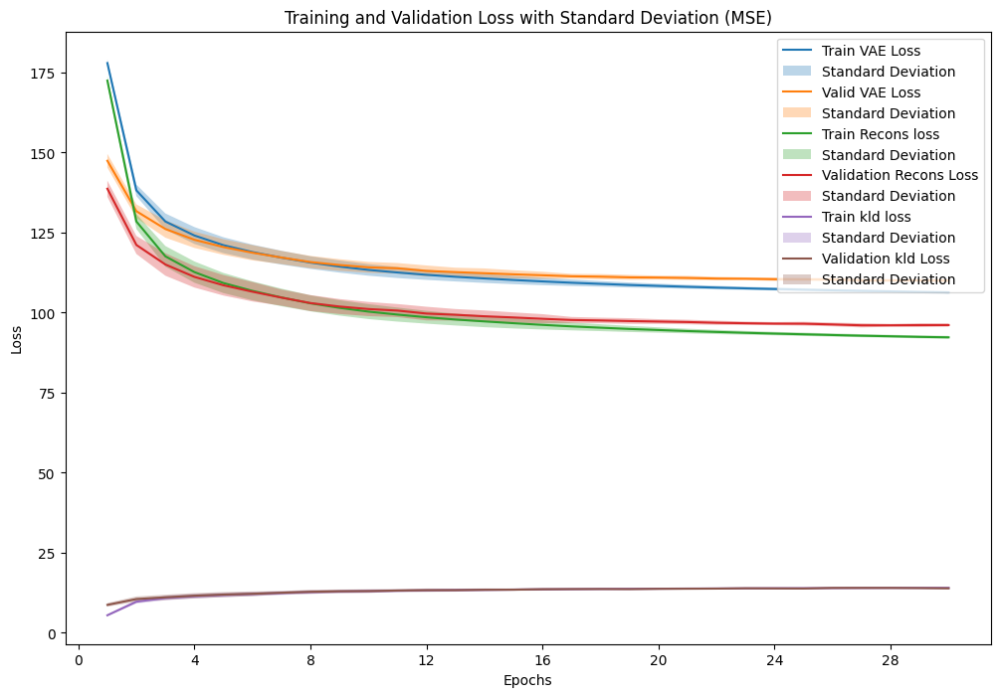

In [ ]:
loss_type_to_plot = 'MSE'   # We can change this to our desired loss type
result_data_7_9_2 = VAE_plot_results(fold_results_7_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_7_9_2['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_7_9_2['epochs'])
VAE_plot_mean_std(result_data_7_9_2['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_7_9_2['epochs'])
VAE_plot_mean_std(result_data_7_9_2['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_7_9_2['epochs'])
VAE_plot_mean_std(result_data_7_9_2['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_7_9_2['epochs'])
VAE_plot_mean_std(result_data_7_9_2['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_7_9_2['epochs'])
VAE_plot_mean_std(result_data_7_9_2['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_7_9_2['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_7_9_2['valid_metrics'],
    result_data_7_9_2['test_metrics'],
    result_data_7_9_2['valid_result'],
    result_data_7_9_2['test_result'],
    result_data_7_9_2['recons_valid_result'],
    result_data_7_9_2['recons_test_result'],
    result_data_7_9_2['kld_valid_result'],
    result_data_7_9_2['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.019907           0.019895           110.028454     109.875415               96.131680         96.131680            13.896774      13.894560
Standard Deviation                 0.000198           0.000171             0.464418       0.341206                0.525649          0.525649             0.284173       0.271409

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.019938,0.019927,110.096864,109.741588
1,2,0.020088,0.020069,110.120799,110.085609
2,3,0.020199,0.020115,110.913282,110.517074
3,4,0.019467,0.019578,109.687323,109.800318
4,5,0.019845,0.019855,109.514567,109.450269
5,6,0.019914,0.019969,110.014093,109.783706
6,7,0.019839,0.019741,110.024194,109.822245
7,8,0.020117,0.019744,110.695858,109.446308
8,9,0.019742,0.019824,109.306820,109.703374
9,10,0.019925,0.020126,109.910740,110.403656


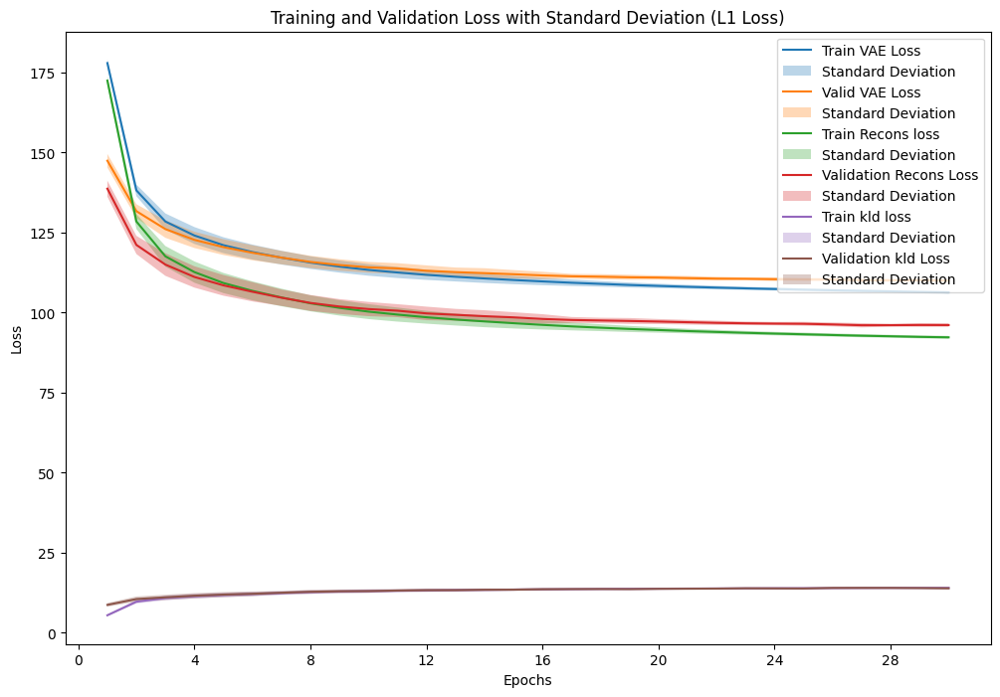

In [ ]:
loss_type_to_plot = 'L1 Loss'   # We can change this to our desired loss type
result_data_7_9_3 = VAE_plot_results(fold_results_7_9, loss_type_to_plot)

fig, ax = plt.subplots(figsize=(12, 8))
VAE_plot_mean_std(result_data_7_9_3['train_losses'], 'Training and Validation Loss', ax, 'Train VAE Loss', result_data_7_9_3['epochs'])
VAE_plot_mean_std(result_data_7_9_3['val_losses'], 'Training and Validation Loss', ax, 'Valid VAE Loss', result_data_7_9_3['epochs'])
VAE_plot_mean_std(result_data_7_9_3['train_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Train Recons loss', result_data_7_9_3['epochs'])
VAE_plot_mean_std(result_data_7_9_3['val_recons_losses'], 'Training and Validation Recontruction Loss', ax, 'Validation Recons Loss', result_data_7_9_3['epochs'])
VAE_plot_mean_std(result_data_7_9_3['train_kld_losses'], 'Training and Validation KLD Loss', ax, 'Train kld loss', result_data_7_9_3['epochs'])
VAE_plot_mean_std(result_data_7_9_3['val_kld_losses'], 'Training and Validation KLD Loss', ax, 'Validation kld Loss', result_data_7_9_3['epochs'])
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(f'Training and Validation Loss with Standard Deviation ({loss_type_to_plot})')
ax.legend()
plt.show()

In [ ]:
print_evaluation_table(
    result_data_7_9_3['valid_metrics'],
    result_data_7_9_3['test_metrics'],
    result_data_7_9_3['valid_result'],
    result_data_7_9_3['test_result'],
    result_data_7_9_3['recons_valid_result'],
    result_data_7_9_3['recons_test_result'],
    result_data_7_9_3['kld_valid_result'],
    result_data_7_9_3['kld_test_result']
)



Mean and Standard Deviation Table:
            Metric  Validation Metrics Loss  Test Metrics Loss  Validation VAE Loss  Test VAE Loss  Validation Recons Loss  Test Recons Loss  Validation KLD Loss  Test KLD Loss
              Mean                 0.053230           0.053163           109.987388     109.900814               96.090614         96.090614            13.896774      13.894560
Standard Deviation                 0.000573           0.000518             0.477238       0.338010                0.564455          0.564455             0.284173       0.271409

Detailed Evaluation Table:


,Fold,Validation Metrics Loss,Test Metrics Loss,Validation Loss,Test Loss
0,1,0.053386,0.053323,110.140456,109.810230
1,2,0.053756,0.053769,110.024328,110.023212
2,3,0.054286,0.054065,110.870083,110.514207
3,4,0.052137,0.052259,109.543663,109.784008
4,5,0.053056,0.052945,109.599882,109.491419
5,6,0.053354,0.053290,110.001345,109.897435
6,7,0.052744,0.052646,109.903982,109.823658
7,8,0.053620,0.052902,110.691258,109.452192
8,9,0.052740,0.052855,109.202758,109.738138
9,10,0.053217,0.053577,109.896127,110.473641


### Number of parameters

In [ ]:
# Count the number of parameters
total_params_7_9 = sum(p.numel() for p in models_7_9[0].parameters())
print(f"Number of parameters in the model: {total_params_7_9}")

Number of parameters in the model: 1624800
